<a href="https://colab.research.google.com/github/maorshechter/dim_reduction_comparison/blob/main/Stream.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%pip install umap-learn

In [2]:
import numpy as np
import pandas as pd
import os
import requests
import joblib
from scipy.sparse import issparse
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import fetch_openml, fetch_20newsgroups_vectorized
from tensorflow.keras.datasets import cifar10
# import kagglehub
import time
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
import umap
from sklearn.manifold import TSNE
import math
import random
import plotly.graph_objects as go  # Add this import for interactive plots


from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.svm import SVC, SVR
from sklearn.linear_model import LinearRegression, LogisticRegression
import xgboost as xgb
from sklearn.metrics import accuracy_score, f1_score, mean_squared_error, mean_absolute_percentage_error
from sklearn.manifold import TSNE
import time
import matplotlib.pyplot as plt

from sklearn.datasets import fetch_openml

from sklearn.random_projection import GaussianRandomProjection
from sklearn.manifold import Isomap
from sklearn.decomposition import FastICA
from sklearn.manifold import LocallyLinearEmbedding



# DATASETS

In [3]:
def load_usps_data(random_state=42):
    # Load the usps dataset
    usps = fetch_openml('usps', version=2, as_frame=False)
    X, y = usps.data, usps.target.astype(int)  # Convert labels to integers
    y = y - 1 # scale to 0-9
    # Split into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_state)

    return (X_train, X_test, y_train, y_test)

def load_online_news_data(random_state=42):
    # Load the Online News Popularity dataset from UCI ML repository
    df = pd.read_csv("./datasets/OnlineNewsPopularity.csv").head(10000)
    # Remove the first two columns (non-predictive: article URL)
    df = df.iloc[:, 2:]

    # Rename columns to remove leading spaces
    df.columns = df.columns.str.strip()

    # Define features (X) and target (y)
    X = df.drop(columns=['shares'])
    y = df['shares']

    # Log-transform the target to reduce skewness (optional)
    y = np.log1p(y)

    # Split into training and testing sets (80% train, 20% test)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_state)

    # Return the train/test splits
    return (X_train, X_test, y_train, y_test)

def load_phone_prices(random_state = 42):
    #https://www.kaggle.com/datasets/iabhishekofficial/mobile-price-classification/data
    df_phone = pd.read_csv("./datasets/phone_price.csv")
    X_train, X_test, y_train, y_test = train_test_split(df_phone.drop(columns=['price_range']), df_phone.price_range.astype(int), test_size=0.2, random_state=random_state)
    return (X_train, X_test, y_train, y_test)

def load_schizophrenia_df(random_state=42):
    #https://www.kaggle.com/datasets/asinow/schizohealth-dataset
    df_schizo = pd.read_csv("./datasets/schizophrenia_dataset.csv")
    df_schizo.rename(columns={'Pozitif_Semptom_Skoru': 'possitive_symptom_score', 'Negatif_Semptom_Skoru': 'negative_symptom_score', 'Hastalık_Süresi': 'disease_duration'}, inplace=True)
    df_schizo['sick'] = df_schizo.disease_duration.astype(bool).astype(int)
    df_schizo.drop(columns=['disease_duration'], inplace=True)
    X_train, X_test, y_train, y_test = train_test_split(df_schizo.drop(columns=['sick']), df_schizo.sick.astype(int), test_size=0.2, random_state=random_state)
    return (X_train, X_test, y_train, y_test)

def load_year_prediction(random_state=42):
    #https://www.kaggle.com/code/raghav1810/release-year-prediction-on-msd/input
    df_year = pd.read_csv("./datasets/year_prediction.csv").head(10000)
    X_train, X_test, y_train, y_test = train_test_split(df_year.drop(columns=['label']), df_year.label, test_size=0.2, random_state=random_state)
    return (X_train, X_test, y_train, y_test)


In [4]:
!pwd

/content


In [5]:
classification_datasets = ['phone_price', 'schizophrenia', 'usps']
regression_datasets = ['year_prediction', 'online_news']

In [6]:
def load_datasets(random_state = 42):
    datasets = {}
    datasets[f'usps_{random_state}'] = load_usps_data(random_state)
    datasets[f'online_news_{random_state}'] = load_online_news_data(random_state)
    datasets[f'phone_price_{random_state}']= load_phone_prices(random_state)
    datasets[f'schizophrenia_{random_state}'] = load_schizophrenia_df(random_state)
    datasets[f'year_prediction_{random_state}'] = load_year_prediction(random_state)
    return datasets

In [8]:
number_of_splits_per_dataset = 5
datasets_list = [load_datasets(42+i) for i in range(number_of_splits_per_dataset)]
datasets = {k: v for d in datasets_list for k, v in d.items()}


In [9]:
for key in datasets:
    X_train, X_test, y_train, y_test = datasets[key]

    if issparse(X_train):  # Handle sparse matrices
        scaler = StandardScaler(with_mean=False)
    else:
        scaler = StandardScaler()

    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    datasets[key] = (X_train_scaled, X_test_scaled, y_train, y_test)

# Display dataset shapes
for key, (X_train, X_test, _, _) in datasets.items():
    print(f"{key}: Train Shape: {X_train.shape}, Test Shape: {X_test.shape}")

usps_42: Train Shape: (7438, 256), Test Shape: (1860, 256)
online_news_42: Train Shape: (8000, 58), Test Shape: (2000, 58)
phone_price_42: Train Shape: (1600, 20), Test Shape: (400, 20)
schizophrenia_42: Train Shape: (8000, 19), Test Shape: (2000, 19)
year_prediction_42: Train Shape: (8000, 90), Test Shape: (2000, 90)
usps_43: Train Shape: (7438, 256), Test Shape: (1860, 256)
online_news_43: Train Shape: (8000, 58), Test Shape: (2000, 58)
phone_price_43: Train Shape: (1600, 20), Test Shape: (400, 20)
schizophrenia_43: Train Shape: (8000, 19), Test Shape: (2000, 19)
year_prediction_43: Train Shape: (8000, 90), Test Shape: (2000, 90)
usps_44: Train Shape: (7438, 256), Test Shape: (1860, 256)
online_news_44: Train Shape: (8000, 58), Test Shape: (2000, 58)
phone_price_44: Train Shape: (1600, 20), Test Shape: (400, 20)
schizophrenia_44: Train Shape: (8000, 19), Test Shape: (2000, 19)
year_prediction_44: Train Shape: (8000, 90), Test Shape: (2000, 90)
usps_45: Train Shape: (7438, 256), Test 

# Reductions

#Implementing Dimensionality Reduction Experiments

#FJLT
we took the code from the paper ("Fast Johnson-Lindenstrauss Transform for Classification of High-Dimensional Data")

###notice!
we changed the function from getting X and epsilon to get X and k.
this change was made in order to be able to set the same k to all the dimension reduction algorithms.

In [10]:
# Function to construct P matrix
def constructP(epsilon, p, k, d, n):
    term = (epsilon ** (p / 2)) * (math.log(n) ** p) / d
    q = min(term, 1)
    P = np.zeros((k, d))
    for i in range(k):
        for j in range(d):
            if random.uniform(0.0, 1.0) <= q:
                P[i, j] = np.random.normal(0, 1.0 / q)
    return P

# Function to construct Hadamard matrix
def constructH(d):
    H = np.array([[1, 1], [1, -1]])
    while H.shape[0] < d:
        H1 = np.concatenate((H, H), axis=1)
        H2 = np.concatenate((H, -H), axis=1)
        H = np.concatenate((H1, H2), axis=0)
    return H[:d, :d] * (d ** -0.5)

# Function to construct D matrix
def constructD(d):
    return np.diag(np.random.choice([-1, 1], size=d))

# Function to find the closest power of 2
def findClosestPowerOf2(d):
    power = 1
    while power < d:
        power *= 2
    return power

# Function to perform Fast Johnson-Lindenstrauss Transform (FJLT) - !!!with k!!!
def FJLT(X, k):
    start_time = time.time()
    p = 2
    n, d_orig = X.shape
    d = 2 ** int(math.ceil(math.log2(d_orig)))  # Closest power of 2
    X_padded = np.zeros((n, d))
    X_padded[:, :d_orig] = X

    # Compute epsilon dynamically based on k
    epsilon = math.sqrt(math.log(n) / k)
    print(f"[FJLT] Original Shape: {n} x {d_orig}, Reduced to: k={k}, d={d}, Computed epsilon={epsilon:.4f}")

    P = np.random.randn(k, d) / np.sqrt(k)
    H = np.linalg.qr(np.random.randn(d, d))[0]
    D = np.diag(np.random.choice([-1, 1], size=d))
    transformed_X = (X_padded @ D @ H @ P.T) / math.sqrt(k / d)
    end_time = time.time()
    exec_time = end_time - start_time
    print(f"[FJLT] Transformation completed in {exec_time:.4f} seconds.")
    return transformed_X, exec_time


In [11]:
def apply_dim_reduction(X_train, X_test, y_train=None, method='PCA', n_components=50):
    """
    Apply dimensionality reduction, fitting only on training data
    """
    start_time = time.time()

    if method == 'None':
      return X_train, X_test, 0

    if method == 'PCA':
        reducer = PCA(n_components=n_components)

    elif method == 'SVD':
        reducer = TruncatedSVD(n_components=n_components)

    elif method == 'UMAP':
        reducer = umap.UMAP(n_components=n_components)

    elif method == 'RP':
        reducer = GaussianRandomProjection(n_components=n_components)

    elif method == 'ISOMAP':
        reducer = Isomap(n_components=n_components, n_neighbors=10)

    elif method == 'ICA':
        reducer = FastICA(n_components=n_components)

    elif method == 'LLE':
        reducer = LocallyLinearEmbedding(n_components=n_components, method='standard')

    elif method == 'TSNE':
        # Note: t-SNE doesn't have a transform method for new data
        # We might want to remove it or handle it differently
        if n_components<4:
          reducer = TSNE(n_components=n_components)
        else:
          print(f"Warning: TSNE algorithm relies on quad-tree or oct-tree.")
          return None, None, 0

    elif method == 'LDA' and y_train is not None:
        # Ensure we don't try to extract more components than possible
        n_classes = len(np.unique(y_train))
        max_components = min(n_components, n_classes - 1)
        if max_components < 1:
            print(f"Warning: LDA requires at least 2 classes, got {n_classes}")
            return None, None, 0

        print(f"LDA: Using {max_components} components (limited by number of classes)")
        reducer = LDA(n_components=max_components)

    elif method == 'FJLT':
        # FJLT is already implemented correctly
        X_train_reduced, _ = FJLT(X_train, n_components)
        X_test_reduced, _ = FJLT(X_test, n_components)
        exec_time = time.time() - start_time
        return X_train_reduced, X_test_reduced, exec_time

    else:
        raise ValueError(f"Unknown method: {method}")

    try:
        # Fit on training data
        if method == 'LDA':
            X_train_reduced = reducer.fit_transform(X_train, y_train)
        else:
            X_train_reduced = reducer.fit_transform(X_train)

        # Transform test data using the fitted reducer
        if hasattr(reducer, 'transform'):
            X_test_reduced = reducer.transform(X_test)
        else:
            # For methods like t-SNE that don't have transform
            print(f"Warning: {method} doesn't support transform on new data. Fitting separately on test.")
            X_test_reduced = reducer.fit_transform(X_test)

        exec_time = time.time() - start_time
        return X_train_reduced, X_test_reduced, exec_time

    except Exception as e:
        print(f"Error applying {method}: {str(e)}")
        return None, None, 0

# Models

In [12]:
class ModelEvaluator:
    def __init__(self, is_classification=True):
        self.is_classification = is_classification
        self.models = self._initialize_models()

    def _initialize_models(self):
        if self.is_classification:
            return {
                'RandomForest': RandomForestClassifier(random_state=42),
                'SVM': SVC(random_state=42),
                'XGBoost': xgb.XGBClassifier(random_state=42),
                'LogisticRegression': LogisticRegression(random_state=42)
            }
        else:
            return {
                'RandomForest': RandomForestRegressor(random_state=42),
                'SVM': SVR(),
                'XGBoost': xgb.XGBRegressor(random_state=42),
                'LinearRegression': LinearRegression()
            }

    def evaluate_model(self, model, X_train, X_test, y_train, y_test):
        # Train and measure training time
        train_start = time.time()
        model.fit(X_train, y_train)
        train_time = time.time() - train_start

        # Predict and measure inference time
        inference_start = time.time()
        y_pred = model.predict(X_test)
        inference_time = time.time() - inference_start

        # Calculate metrics
        if self.is_classification:
            accuracy = accuracy_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred, average='weighted')
            return {
                'accuracy': accuracy,
                'f1_score': f1,
                'train_time': train_time,
                'inference_time': inference_time
            }
        else:
            rmse = np.sqrt(mean_squared_error(y_test, y_pred))
            mape = mean_absolute_percentage_error(y_test, y_pred) * 100
            return {
                'rmse': rmse,
                'mape': mape,
                'train_time': train_time,
                'inference_time': inference_time
            }


In [13]:
import json
import numpy as np
import os

def save_partial_results(results, output_file='results.json'):
    """Save experiment results incrementally to a JSON file."""
    try:
        # Convert NumPy arrays and types to standard lists and floats for JSON compatibility
        def convert(obj):
            if isinstance(obj, np.ndarray):
                return obj.tolist()
            if isinstance(obj, np.float32) or isinstance(obj, np.float64):
                return float(obj)
            if isinstance(obj, np.int32) or isinstance(obj, np.int64):
                return int(obj)
            return obj

        with open(output_file, 'w') as f:
            json.dump(results, f, indent=4, default=convert)
        print(f"Partial results saved to {output_file}")
    except Exception as e:
        print(f"Error saving results: {str(e)}")

def load_results(input_file='results.json'):
    """Load experiment results from a JSON file if it exists, else return an empty dictionary."""
    if os.path.exists(input_file):
        try:
            with open(input_file, 'r') as f:
                results = json.load(f)
            print(f"Results loaded from {input_file}")
            return results
        except Exception as e:
            print(f"Error loading results: {str(e)}")
            return {}
    return {}

def run_experiments(datasets, dim_reduction_methods, k_values, output_file='results.json'):
    """Run dimensionality reduction experiments and save results incrementally in JSON format."""
    results = load_results(output_file)  # Load existing results to continue from previous run

    for dataset_name, (X_train, X_test, y_train, y_test) in datasets.items():
        if dataset_name not in results:
            results[dataset_name] = {}

        # Determine if classification or regression
        is_classification = any([dataset_name.startswith(x) for x in classification_datasets])
        evaluator = ModelEvaluator(is_classification)

        for method in dim_reduction_methods:
            if method not in results[dataset_name]:
                results[dataset_name][method] = {}

            for k in k_values:
                if str(k) in results[dataset_name][method]:  # Avoid re-processing existing results
                    print(f"Skipping {dataset_name} with {method} (k={k}) - already processed")
                    continue

                try:
                    print(f"Processing {dataset_name} with {method} (k={k})")

                    # Apply dimensionality reduction
                    X_train_reduced, X_test_reduced, reduction_time = apply_dim_reduction(
                        X_train, X_test, y_train, method=method, n_components=k
                    )

                    results[dataset_name][method][k] = {
                        'reduction_time': reduction_time,
                        'models': {}
                    }

                    # Evaluate each model
                    for model_name, model in evaluator.models.items():
                        metrics = evaluator.evaluate_model(
                            model, X_train_reduced, X_test_reduced, y_train, y_test
                        )
                        results[dataset_name][method][k]['models'][model_name] = metrics

                    # Save after each iteration to ensure incremental storage
                    save_partial_results(results, output_file)

                    # If no dimensionality reduction is applied, break out after first k
                    if method == 'None':
                        break

                except Exception as e:
                    print(f"Error processing {dataset_name} with {method} (k={k}): {str(e)}")
                    continue

    return results


In [14]:
import numpy as np
import matplotlib.pyplot as plt
import re

def plot_results(results):
    aggregated_results = {}

    # Aggregate results across seeds
    for dataset_name in results:
        base_name = re.sub(r'_\d+$', '', dataset_name)
        if base_name not in aggregated_results:
            aggregated_results[base_name] = {}

        for method in results[dataset_name]:
            if method not in aggregated_results[base_name]:
                aggregated_results[base_name][method] = {}

            for k in results[dataset_name][method]:
                if k not in aggregated_results[base_name][method]:
                    aggregated_results[base_name][method][k] = {'models': {}}

                for model_name, model_results in results[dataset_name][method][k]['models'].items():
                    if model_name not in aggregated_results[base_name][method][k]['models']:
                        aggregated_results[base_name][method][k]['models'][model_name] = {}

                    for metric, value in model_results.items():
                        if metric not in aggregated_results[base_name][method][k]['models'][model_name]:
                            aggregated_results[base_name][method][k]['models'][model_name][metric] = []

                        aggregated_results[base_name][method][k]['models'][model_name][metric].append(value)

    # Compute averages
    for base_name in aggregated_results:
        for method in aggregated_results[base_name]:
            for k in aggregated_results[base_name][method]:
                for model_name in aggregated_results[base_name][method][k]['models']:
                    for metric in aggregated_results[base_name][method][k]['models'][model_name]:
                        values = aggregated_results[base_name][method][k]['models'][model_name][metric]
                        aggregated_results[base_name][method][k]['models'][model_name][metric] = np.mean(values)

    # Plot results
    for base_name in aggregated_results:
        for metric in ['accuracy', 'f1_score', 'rmse', 'mape', 'train_time', 'inference_time']:
            sample_dataset = next(iter(aggregated_results[base_name].values()))
            sample_k = next(iter(sample_dataset.keys()))
            sample_model = next(iter(sample_dataset[sample_k]['models'].values()))

            if metric not in sample_model:
                continue

            plt.figure(figsize=(12, 6))
            for method in aggregated_results[base_name]:
                k_values = list(aggregated_results[base_name][method].keys())
                metric_values = []

                for k in k_values:
                    avg_metric = np.mean([
                        model_results[metric]
                        for model_results in aggregated_results[base_name][method][k]['models'].values()
                    ])
                    metric_values.append(avg_metric)

                plt.plot(k_values, metric_values, marker='o', label=method)

            plt.xlabel('Number of Components (k)')
            plt.ylabel(metric.replace('_', ' ').title())
            plt.title(f'{metric.replace("_", " ").title()} vs k for {base_name}')
            plt.legend()
            plt.grid(True)
            plt.show()


Results loaded from results.json
Skipping usps_42 with None (k=2) - already processed
Skipping usps_42 with None (k=5) - already processed
Skipping usps_42 with None (k=10) - already processed
Skipping usps_42 with PCA (k=2) - already processed
Skipping usps_42 with PCA (k=5) - already processed
Skipping usps_42 with PCA (k=10) - already processed
Skipping usps_42 with SVD (k=2) - already processed
Skipping usps_42 with SVD (k=5) - already processed
Skipping usps_42 with SVD (k=10) - already processed
Skipping usps_42 with UMAP (k=2) - already processed
Skipping usps_42 with UMAP (k=5) - already processed
Skipping usps_42 with UMAP (k=10) - already processed
Skipping usps_42 with FJLT (k=2) - already processed
Skipping usps_42 with FJLT (k=5) - already processed
Skipping usps_42 with FJLT (k=10) - already processed
Skipping usps_42 with ICA (k=2) - already processed
Skipping usps_42 with ICA (k=5) - already processed
Skipping usps_42 with ICA (k=10) - already processed
Skipping usps_42

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Partial results saved to results.json
Skipping usps_46 with PCA (k=2) - already processed
Skipping usps_46 with PCA (k=5) - already processed
Skipping usps_46 with PCA (k=10) - already processed
Skipping usps_46 with SVD (k=2) - already processed
Skipping usps_46 with SVD (k=5) - already processed
Skipping usps_46 with SVD (k=10) - already processed
Skipping usps_46 with UMAP (k=2) - already processed
Skipping usps_46 with UMAP (k=5) - already processed
Skipping usps_46 with UMAP (k=10) - already processed
Skipping usps_46 with FJLT (k=2) - already processed
Skipping usps_46 with FJLT (k=5) - already processed
Skipping usps_46 with FJLT (k=10) - already processed
Skipping usps_46 with ICA (k=2) - already processed
Skipping usps_46 with ICA (k=5) - already processed
Skipping usps_46 with ICA (k=10) - already processed
Skipping usps_46 with LLE (k=2) - already processed
Skipping usps_46 with LLE (k=5) - already processed
Skipping usps_46 with LLE (k=10) - already processed
Skipping usps_

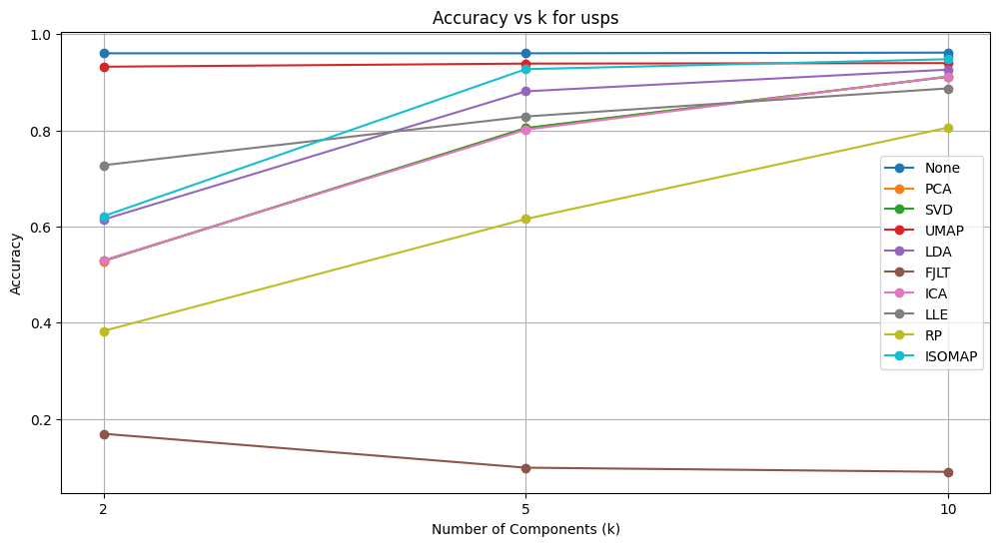

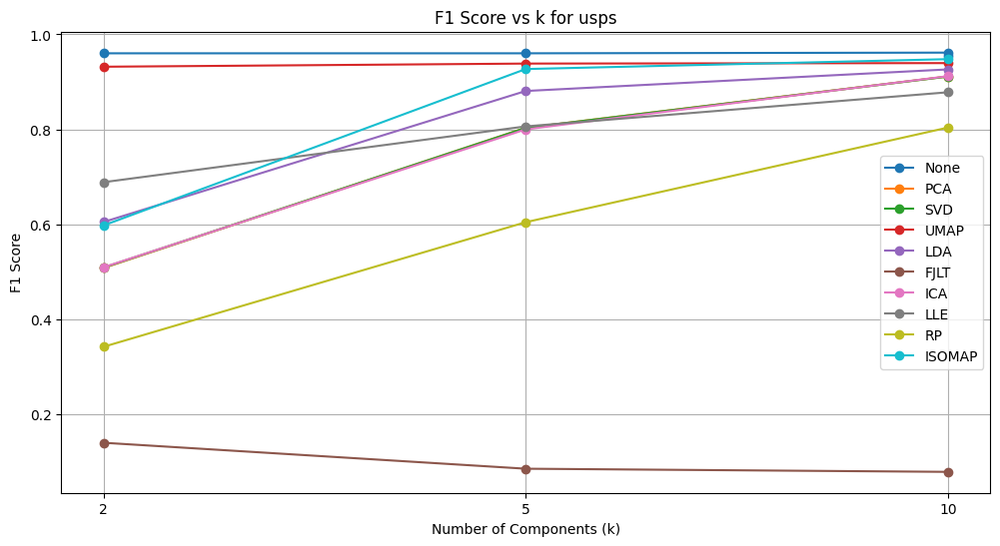

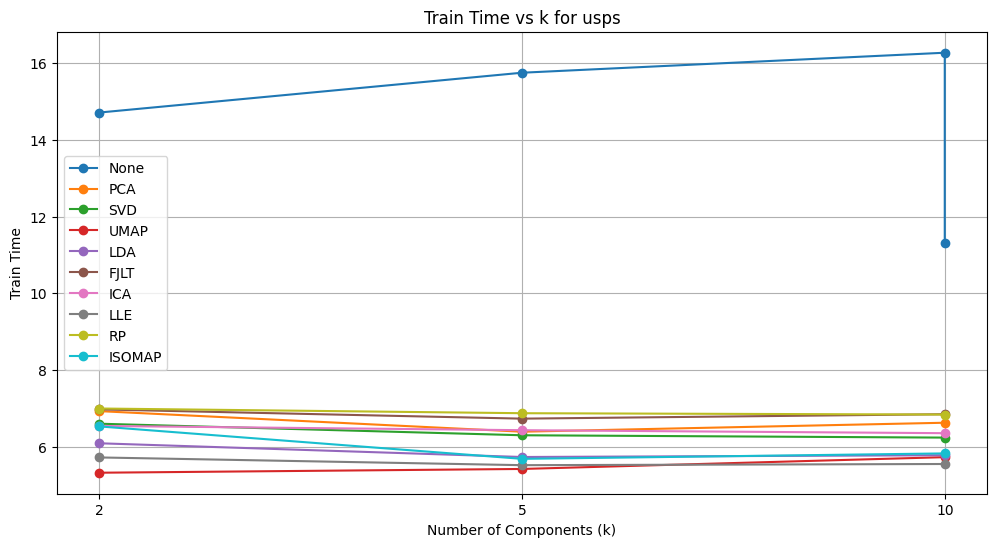

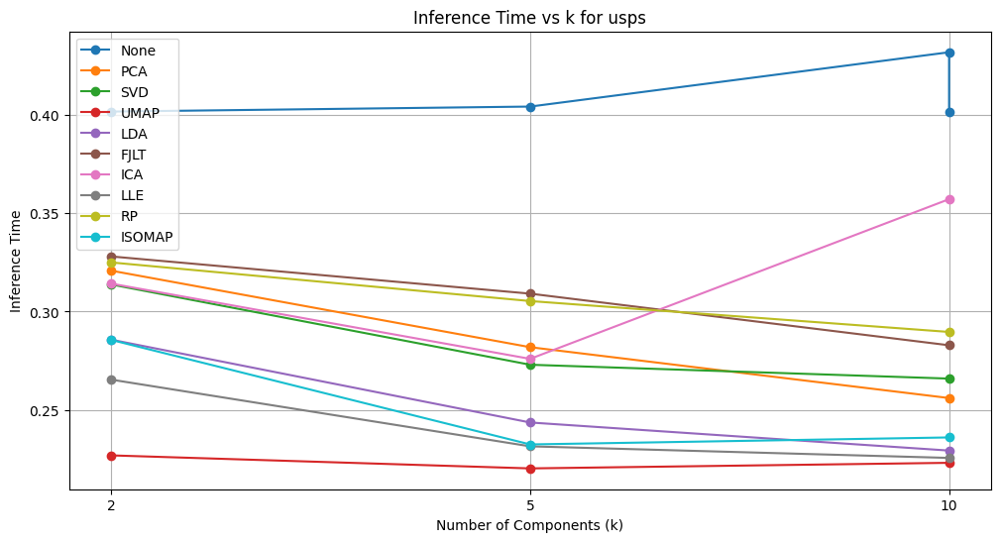

/usr/local/lib/python3.11/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


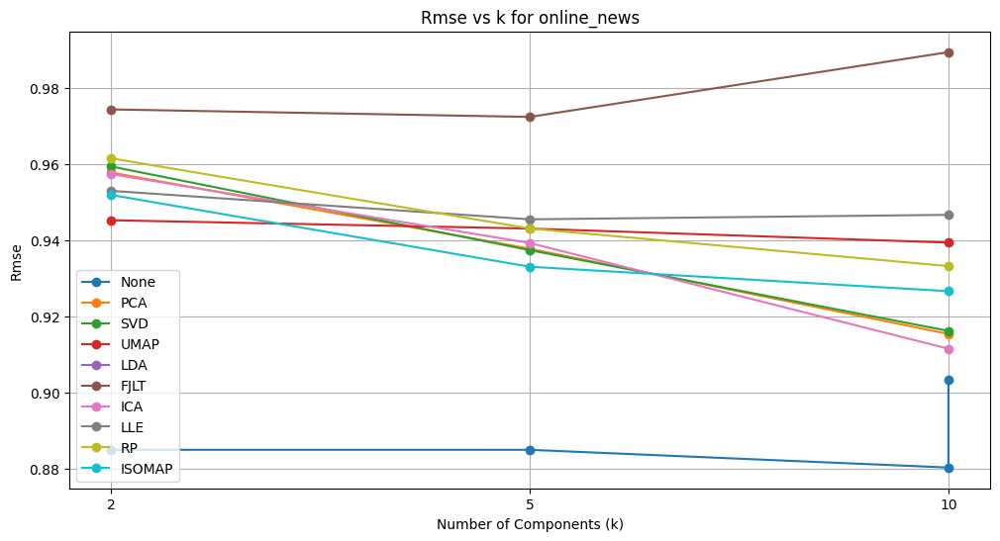

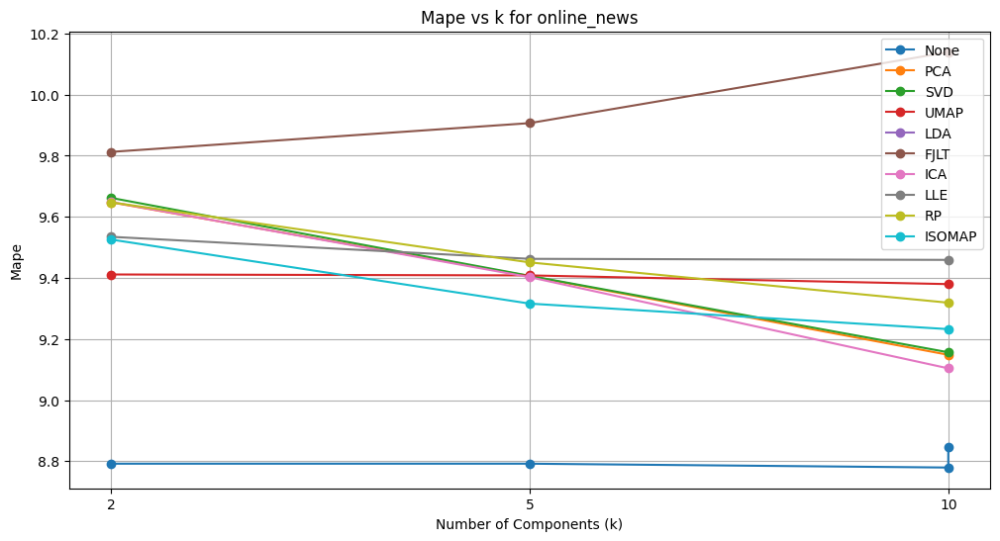

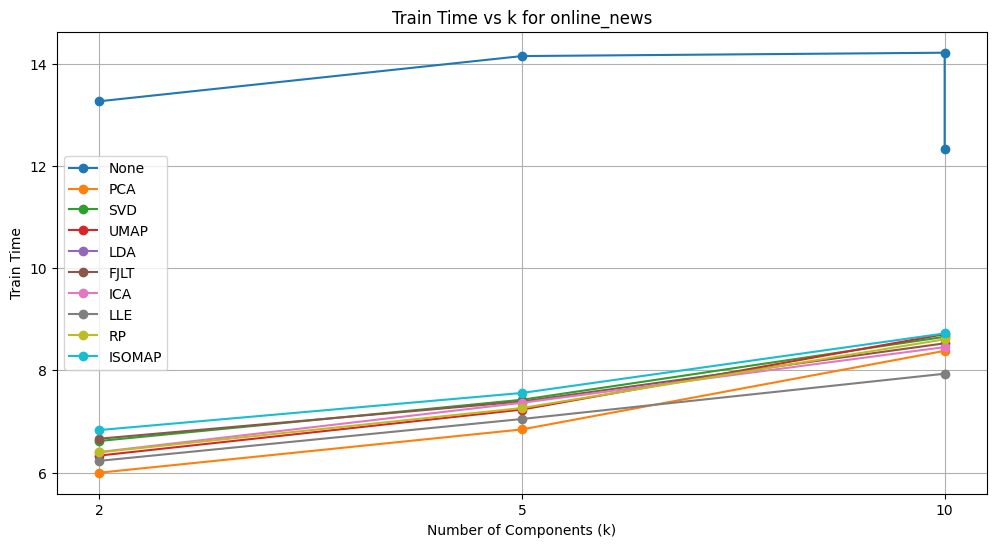

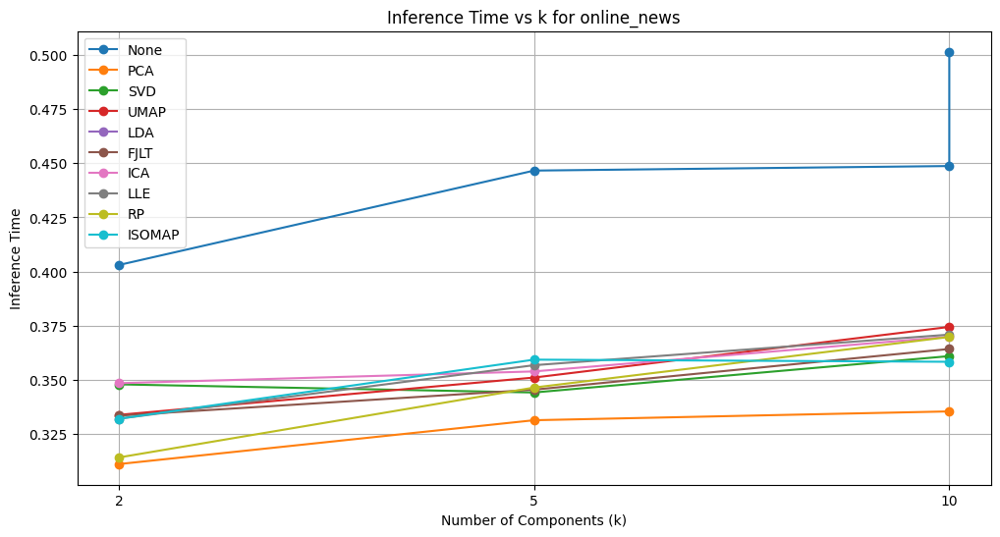

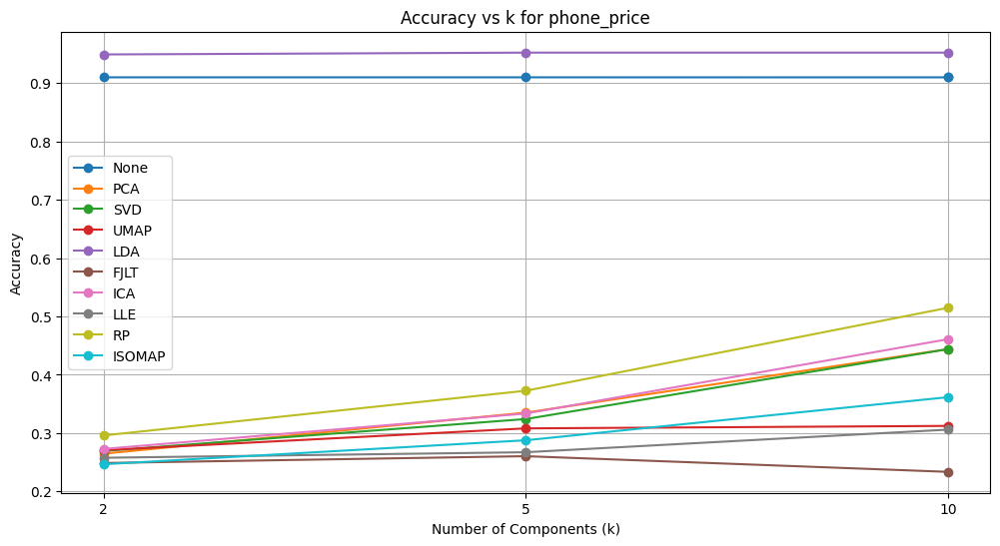

...

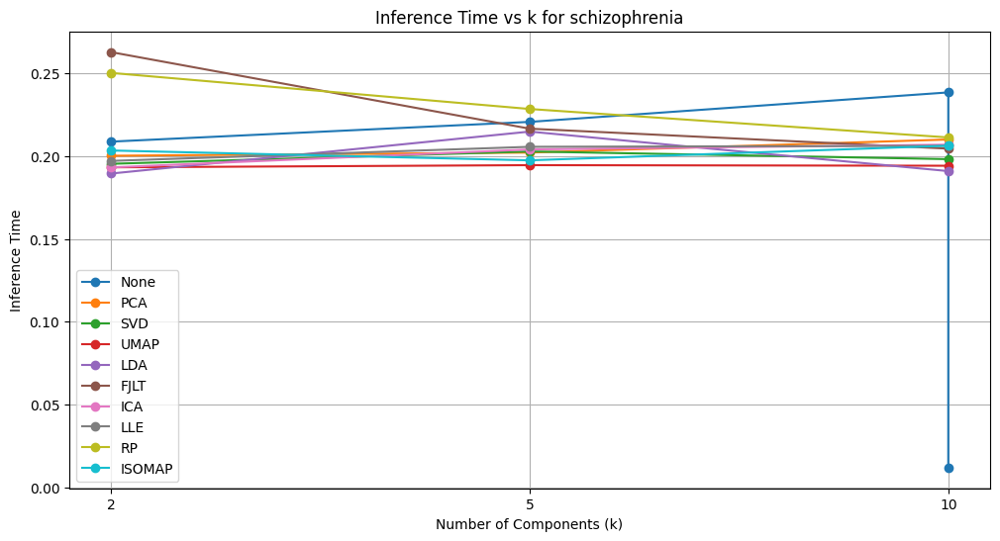

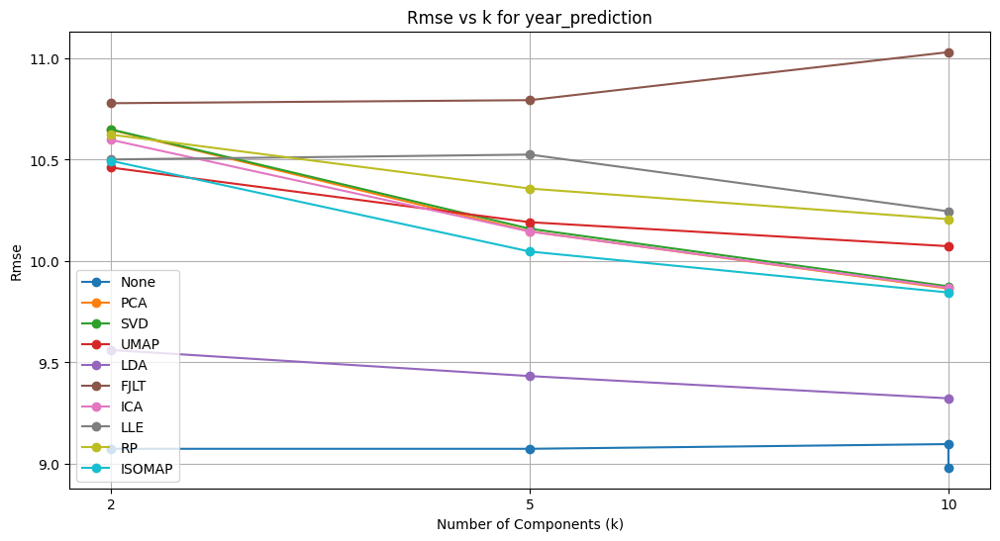

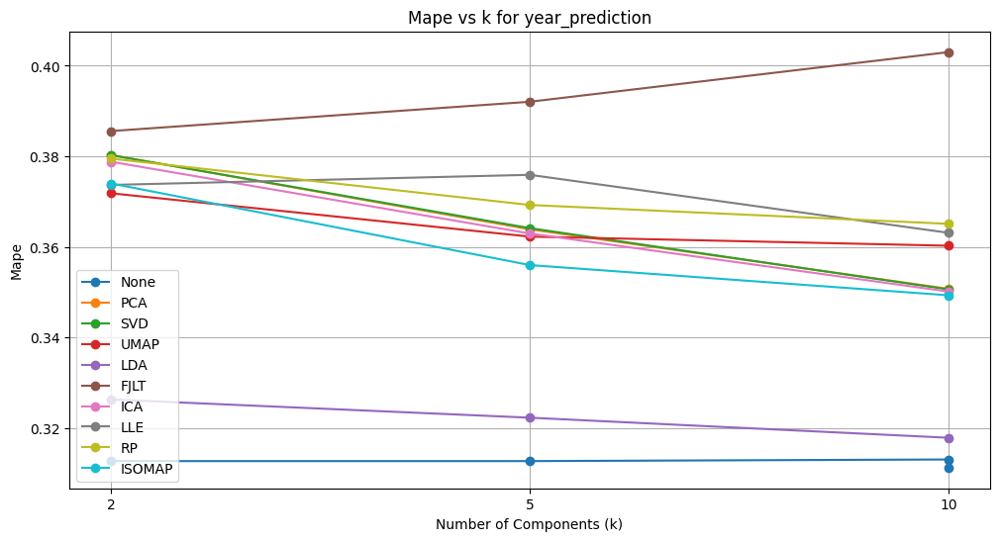

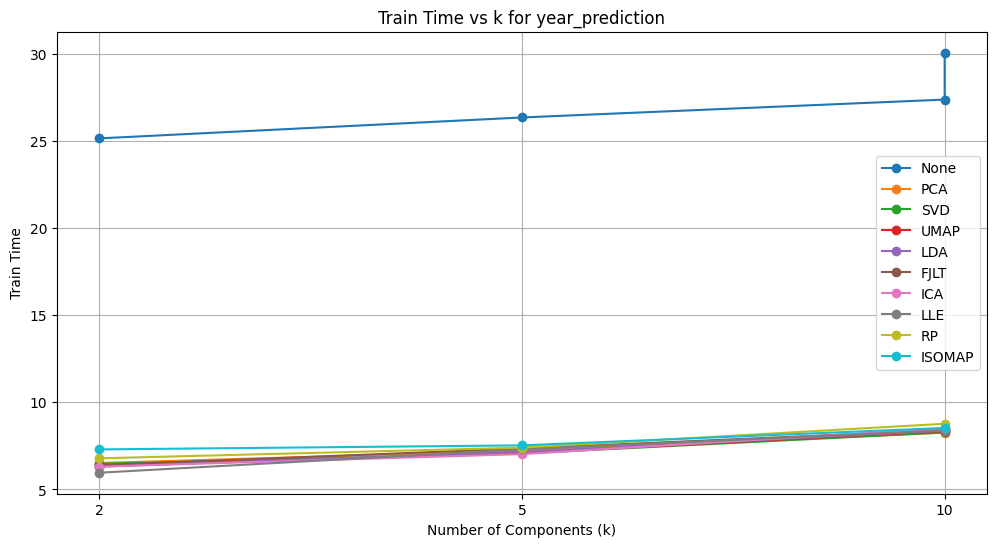

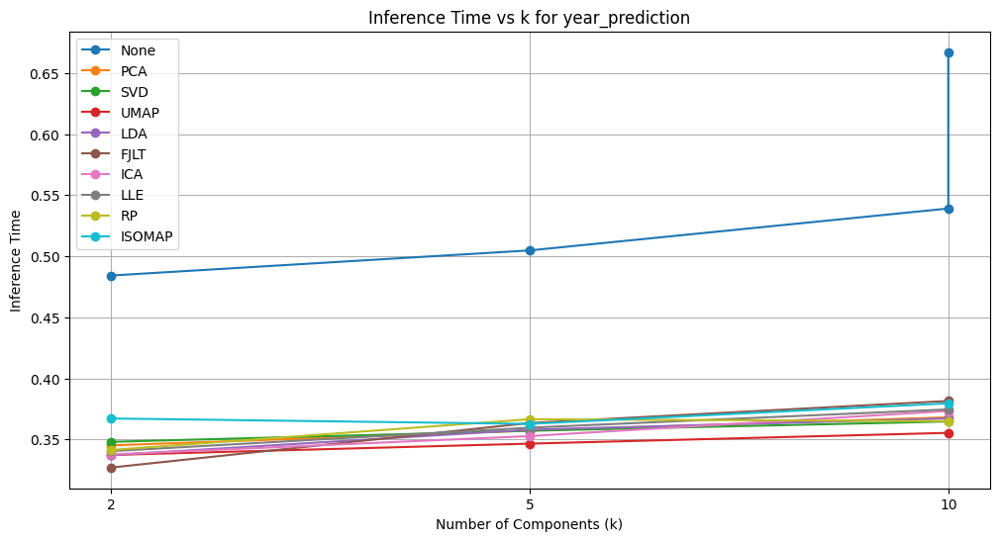

In [15]:

# Example usage:
dim_reduction_methods = ['None','PCA', 'SVD','UMAP', 'FJLT', 'ICA', 'LLE','RP', 'ISOMAP']
# dim_reduction_methods =  ['PCA']
k_values = [2, 5, 10]
results = run_experiments(datasets, dim_reduction_methods, k_values)
plot_results(results)

# Vizualization

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import re
import logging


# Set up logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)


In [17]:
def visualize_comparison_dashboard_by_k(results):
    """Create a consolidated dashboard for comparing methods and models for each k value"""
    try:
        # Convert results to DataFrame
        logger.info("Converting results to DataFrame...")
        df = convert_results_to_dataframe(results)

        if df.empty:
            logger.error("No valid data to visualize")
            return

        logger.info(f"Created DataFrame with {len(df)} rows")

        # Get unique values
        datasets = df['base_dataset'].unique()

        # For each dataset, create dashboards for each k value
        for dataset in datasets:
            logger.info(f"Processing dataset: {dataset}")
            dataset_df = df[df['base_dataset'] == dataset]

            # Identify performance metrics (classification vs regression)
            perf_metrics = [m for m in dataset_df['metric'].unique()
                           if m not in ['train_time', 'inference_time', 'reduction_time']]

            if 'accuracy' in perf_metrics or 'f1_score' in perf_metrics:
                metric_type = 'classification'
                main_metric = 'accuracy' if 'accuracy' in perf_metrics else 'f1_score'
                is_higher_better = True
            elif 'rmse' in perf_metrics or 'mape' in perf_metrics:
                metric_type = 'regression'
                main_metric = 'rmse' if 'rmse' in perf_metrics else 'mape'
                is_higher_better = False
            else:
                metric_type = 'unknown'
                main_metric = perf_metrics[0] if perf_metrics else None
                is_higher_better = True  # Default

            if main_metric is None:
                logger.warning(f"No performance metrics found for dataset {dataset}")
                continue

            logger.info(f"Identified metric type: {metric_type}, main metric: {main_metric}")

            # Get all k values for this dataset
            k_values = sorted(dataset_df['k'].unique())

            # Create a summary table to collect results across k values
            all_summary_rows = []

            # Process each k value
            for k in k_values:
                logger.info(f"Creating dashboard for k={k}")

                # Filter data for this k value
                k_df = dataset_df[dataset_df['k'] == k]

                # Create figure with 2x2 subplots
                fig, axes = plt.subplots(2, 2, figsize=(20, 16))
                plt.subplots_adjust(hspace=0.3, wspace=0.3)

                # 1. Top-left: Dimension reduction time comparison for this k
                plot_reduction_time_for_k(k_df, k, ax=axes[0, 0])

                # 2. Top-right: Best model for each method at this k
                plot_best_model_per_method_for_k(k_df, main_metric, is_higher_better, k, ax=axes[0, 1])

                # 3. Bottom-left: Performance across methods for this k
                plot_method_comparison_for_k(k_df, main_metric, is_higher_better, k, ax=axes[1, 0])

                # 4. Bottom-right: Training and inference time comparison for this k
                plot_time_comparison_for_k(k_df, k, ax=axes[1, 1])

                # Add overall title
                fig.suptitle(f'Performance Dashboard for {dataset} (k={k})', fontsize=20, y=0.98)

                # Adjust layout
                plt.tight_layout(rect=[0, 0, 1, 0.96])
                plt.show()


    except Exception as e:
        logger.error(f"Error in visualize_comparison_dashboard_by_k: {e}")
        raise

def plot_reduction_time_for_k(df, k, ax=None):
    """Plot dimension reduction time comparison for a specific k value"""
    try:
        if ax is None:
            fig, ax = plt.subplots(figsize=(10, 6))

        # Filter reduction time data for this k value
        reduction_df = df[(df['metric'] == 'reduction_time') & (df['model'] == 'N/A')]

        if reduction_df.empty:
            ax.text(0.5, 0.5, "No reduction time data available for this k value",
                   ha='center', va='center', fontsize=12)
            ax.set_title(f'Dimension Reduction Time Comparison (k={k})', fontsize=14)
            return

        # Sort by reduction time
        reduction_df = reduction_df.sort_values('value')

        # Plot
        bars = sns.barplot(x='method', y='value', data=reduction_df, ax=ax)

        # Add value labels
        for i, bar in enumerate(bars.patches):
            value = reduction_df.iloc[i]['value']
            ax.text(
                bar.get_x() + bar.get_width()/2.,
                bar.get_height() + 0.1,
                f'{value:.2f}s',
                ha='center', va='bottom',
                fontsize=9
            )

        # Customize plot
        ax.set_title(f'Dimension Reduction Time Comparison (k={k})', fontsize=14)
        ax.set_xlabel('Method', fontsize=12)
        ax.set_ylabel('Time (seconds)', fontsize=12)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        ax.grid(axis='y', linestyle='--', alpha=0.7)

    except Exception as e:
        logger.error(f"Error in plot_reduction_time_for_k: {e}")
        if ax is None:
            plt.close()

def plot_best_model_per_method_for_k(df, metric, is_higher_better, k, ax=None):
    """Plot the best model for each method at a specific k value"""
    try:
        if ax is None:
            fig, ax = plt.subplots(figsize=(10, 6))

        # Filter to specified metric and k value
        metric_df = df[(df['metric'] == metric) & (df['k'] == k)]

        if metric_df.empty:
            ax.text(0.5, 0.5, f"No {metric} data available for k={k}",
                   ha='center', va='center', fontsize=12)
            ax.set_title(f'Best Model for Each Method ({metric.replace("_", " ").title()}, k={k})', fontsize=14)
            return

        # For each method, find the best model
        method_model_data = []
        for method in metric_df['method'].unique():
            method_df = metric_df[metric_df['method'] == method]

            if method_df.empty:
                continue

            if is_higher_better:
                idx = method_df['value'].idxmax()
            else:
                idx = method_df['value'].idxmin()

            best_model = method_df.loc[idx]
            method_model_data.append(best_model)

        if not method_model_data:
            ax.text(0.5, 0.5, "No model data available",
                   ha='center', va='center', fontsize=12)
            ax.set_title(f'Best Model for Each Method ({metric.replace("_", " ").title()}, k={k})', fontsize=14)
            return

        method_model_df = pd.DataFrame(method_model_data)

        # Sort by performance
        if is_higher_better:
            method_model_df = method_model_df.sort_values('value', ascending=False)
        else:
            method_model_df = method_model_df.sort_values('value')

        # Create a new column combining method and model
        method_model_df['method_model'] = method_model_df['method'] + ' + ' + method_model_df['model']

        # Plot
        bars = sns.barplot(x='method_model', y='value', data=method_model_df, ax=ax)

        # Add value labels
        for i, bar in enumerate(bars.patches):
            value = method_model_df.iloc[i]['value']
            ax.text(
                bar.get_x() + bar.get_width()/2.,
                bar.get_height() * 0.97,
                f'{value:.3f}',
                ha='center', va='top',
                fontsize=9,
                color='white',
                fontweight='bold'
            )

        # Customize plot
        metric_name = metric.replace('_', ' ').title()
        ax.set_title(f'Best Model for Each Method ({metric_name}, k={k})', fontsize=14)
        ax.set_xlabel('Method + Model', fontsize=12)
        ax.set_ylabel(metric_name, fontsize=12)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        ax.grid(axis='y', linestyle='--', alpha=0.7)

    except Exception as e:
        logger.error(f"Error in plot_best_model_per_method_for_k: {e}")
        if ax is None:
            plt.close()

def plot_method_comparison_for_k(df, metric, is_higher_better, k, ax=None):
    """Plot performance of all methods for a specific model at a specific k value"""
    try:
        if ax is None:
            fig, ax = plt.subplots(figsize=(10, 6))

        # Filter to specified metric and k value
        metric_df = df[(df['metric'] == metric) & (df['k'] == k)]

        if metric_df.empty:
            ax.text(0.5, 0.5, f"No {metric} data available for k={k}",
                   ha='center', va='center', fontsize=12)
            ax.set_title(f'Method Comparison ({metric.replace("_", " ").title()}, k={k})', fontsize=14)
            return

        # Find the best model overall for this metric and k
        if is_higher_better:
            best_idx = metric_df['value'].idxmax()
        else:
            best_idx = metric_df['value'].idxmin()

        best_model = metric_df.loc[best_idx, 'model']

        # Filter to just this model across all methods
        model_df = metric_df[metric_df['model'] == best_model]

        if model_df.empty:
            ax.text(0.5, 0.5, f"No data available for best model with k={k}",
                   ha='center', va='center', fontsize=12)
            ax.set_title(f'Method Comparison ({metric.replace("_", " ").title()}, k={k})', fontsize=14)
            return

        # Sort by performance
        if is_higher_better:
            model_df = model_df.sort_values('value', ascending=False)
        else:
            model_df = model_df.sort_values('value')

        # Plot
        bars = sns.barplot(x='method', y='value', data=model_df, ax=ax)

        # Add value labels
        for i, bar in enumerate(bars.patches):
            value = model_df.iloc[i]['value']
            ax.text(
                bar.get_x() + bar.get_width()/2.,
                bar.get_height() * 0.97,
                f'{value:.3f}',
                ha='center', va='top',
                fontsize=9,
                color='white',
                fontweight='bold'
            )

        # Customize plot
        metric_name = metric.replace('_', ' ').title()
        ax.set_title(f'Method Comparison for {best_model} ({metric_name}, k={k})', fontsize=14)
        ax.set_xlabel('Method', fontsize=12)
        ax.set_ylabel(metric_name, fontsize=12)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        ax.grid(axis='y', linestyle='--', alpha=0.7)

    except Exception as e:
        logger.error(f"Error in plot_method_comparison_for_k: {e}")
        if ax is None:
            plt.close()

def plot_time_comparison_for_k(df, k, ax=None):
    """Plot training and inference time comparison for a specific k value"""
    try:
        if ax is None:
            fig, ax = plt.subplots(figsize=(10, 6))

        # Filter to time metrics for this k value
        time_df = df[(df['k'] == k) &
                    (df['metric'].isin(['train_time', 'inference_time']))]

        if time_df.empty:
            ax.text(0.5, 0.5, "No time data available for this k value",
                   ha='center', va='center', fontsize=12)
            ax.set_title(f'Training & Inference Time (k={k})', fontsize=14)
            return

        # Group by method, model, and metric to get average times
        grouped_df = time_df.groupby(['method', 'model', 'metric'])['value'].mean().reset_index()

        # Pivot data for stacked bar chart
        pivot_df = grouped_df.pivot_table(
            index=['method', 'model'],
            columns='metric',
            values='value'
        ).reset_index()

        # Add total time column
        pivot_df['total_time'] = pivot_df['train_time'] + pivot_df['inference_time']

        # Sort by total time
        pivot_df = pivot_df.sort_values('total_time')

        # Create bar chart
        bar_width = 0.8
        indices = np.arange(len(pivot_df))

        labels = [f"{row['method']} + {row['model']}" for _, row in pivot_df.iterrows()]

        # Plot stacked bars
        train_bars = ax.bar(indices, pivot_df['train_time'], bar_width, label='Training Time')
        inference_bars = ax.bar(indices, pivot_df['inference_time'], bar_width,
                               bottom=pivot_df['train_time'], label='Inference Time')

        # Add value labels
        for i, (train_bar, inf_bar) in enumerate(zip(train_bars, inference_bars)):
            train_time = pivot_df.iloc[i]['train_time']
            inf_time = pivot_df.iloc[i]['inference_time']

            # Only label if bar is tall enough
            if train_time > 0.5:
                ax.text(i, train_time/2, f'{train_time:.1f}s',
                       ha='center', va='center', fontsize=8, color='white', fontweight='bold')

            if inf_time > 0.2:
                ax.text(i, train_time + inf_time/2, f'{inf_time:.1f}s',
                       ha='center', va='center', fontsize=8, color='black', fontweight='bold')

        # Customize plot
        ax.set_title(f'Training & Inference Time (k={k})', fontsize=14)
        ax.set_ylabel('Time (seconds)', fontsize=12)
        ax.set_xticks(indices)
        ax.set_xticklabels(labels, rotation=45, ha='right')
        ax.legend()
        ax.grid(axis='y', linestyle='--', alpha=0.7)

    except Exception as e:
        logger.error(f"Error in plot_time_comparison_for_k: {e}")
        if ax is None:
            plt.close()


# Main function to run visualizations by k
def visualize_results_by_k(results):
    """Main function to visualize results for each k value"""
    try:
        # Create dashboards for each dataset and k value
        visualize_comparison_dashboard_by_k(results)

    except Exception as e:
        logger.error(f"Error in visualize_results_by_k: {e}")


In [18]:
visualize_results_by_k(results)

ERROR:__main__:Error in visualize_comparison_dashboard_by_k: name 'convert_results_to_dataframe' is not defined
ERROR:__main__:Error in visualize_results_by_k: name 'convert_results_to_dataframe' is not defined


## Heatmap


In [19]:


# Set up logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

def create_performance_heatmap_by_k(df, datasets, dataset_types, title_prefix):
    """Create separate heatmaps for each k value in specified datasets"""
    try:
        # Get all methods and models
        methods = sorted(df['method'].unique())
        models = sorted(df[df['model'] != 'N/A']['model'].unique())

        # Process each dataset
        for dataset in datasets:
            if dataset not in dataset_types:
                logger.warning(f"No metric type information for dataset {dataset}")
                continue

            metric = dataset_types[dataset]['metric']
            is_higher_better = metric in ['accuracy', 'f1_score']

            metric_df = df[(df['base_dataset'] == dataset) & (df['metric'] == metric)]

            if metric_df.empty:
                logger.warning(f"No metric data for dataset {dataset}")
                continue

            # Get all k values for this dataset
            k_values = sorted(metric_df['k'].unique())

            # Create a heatmap for each k value
            for k in k_values:
                data_rows = []
                k_df = metric_df[metric_df['k'] == k]

                for method in methods:
                    for model in models:
                        combo_df = k_df[(k_df['method'] == method) & (k_df['model'] == model)]

                        if not combo_df.empty:
                            value = combo_df['value'].values[0]
                            # No normalization needed - we'll use the actual value
                            data_rows.append({
                                'dataset': dataset,
                                'method': method,
                                'model': model,
                                'k': k,
                                'value': value
                            })

                if not data_rows:
                    logger.warning(f"No data for {dataset} with k={k}")
                    continue

                heatmap_df = pd.DataFrame(data_rows)

                # Create pivot table
                dataset_pivot = heatmap_df.pivot_table(
                    index='model',
                    columns='method',
                    values='value'
                )

                if dataset_pivot.empty:
                    continue

                # Plot heatmap
                plt.figure(figsize=(12, 8))

                # Determine appropriate colormap and formatting
                if is_higher_better:
                    cmap = 'viridis'  # Yellow is high (good), dark blue is low (bad)
                    vmin = max(0, dataset_pivot.min().min() * 0.95)  # Set minimum to handle outliers
                    vmax = min(1, dataset_pivot.max().max() * 1.05)  # Set maximum to handle outliers
                else:
                    # For metrics where lower is better, invert the colormap
                    cmap = 'viridis_r'  # Dark blue is low (good), yellow is high (bad)
                    vmin = None
                    vmax = None

                # Create heatmap with actual values
                ax = sns.heatmap(
                    dataset_pivot,
                    annot=True,
                    cmap=cmap,
                    fmt='.3f',
                    vmin=vmin,
                    vmax=vmax
                )

                metric_name = metric.replace('_', ' ').title()

                plt.title(f'{title_prefix}: {dataset} ({metric_name}) - k={k}', fontsize=16)
                plt.tight_layout()
                plt.show()

    except Exception as e:
        logger.error(f"Error in create_performance_heatmap_by_k: {e}")
        raise

def create_method_model_heatmap_by_k(results):
    """Create heatmaps showing method-model performance for each k value across datasets"""
    try:
        # Convert results to DataFrame
        df = convert_results_to_dataframe(results)

        if df.empty:
            logger.error("No valid data to visualize")
            return

        # Identify which datasets are classification vs regression
        datasets = df['base_dataset'].unique()
        dataset_types = {}

        for dataset in datasets:
            dataset_df = df[df['base_dataset'] == dataset]
            metrics = dataset_df['metric'].unique()

            if 'accuracy' in metrics:
                dataset_types[dataset] = {
                    'type': 'classification',
                    'metric': 'accuracy'
                }
            elif 'f1_score' in metrics:
                dataset_types[dataset] = {
                    'type': 'classification',
                    'metric': 'f1_score'
                }
            elif 'rmse' in metrics:
                dataset_types[dataset] = {
                    'type': 'regression',
                    'metric': 'rmse'
                }
            elif 'mape' in metrics:
                dataset_types[dataset] = {
                    'type': 'regression',
                    'metric': 'mape'
                }

        # Separate classification and regression datasets
        classification_datasets = [d for d in datasets if d in dataset_types and dataset_types[d]['type'] == 'classification']
        regression_datasets = [d for d in datasets if d in dataset_types and dataset_types[d]['type'] == 'regression']

        # Create heatmaps
        if classification_datasets:
            create_performance_heatmap_by_k(df, classification_datasets, dataset_types, 'Classification')

        if regression_datasets:
            create_performance_heatmap_by_k(df, regression_datasets, dataset_types, 'Regression')

    except Exception as e:
        logger.error(f"Error in create_method_model_heatmap_by_k: {e}")

# Helper function for data conversion
def convert_results_to_dataframe(results):
    """Convert nested results structure to a flat dataframe for easier visualization"""
    data_rows = []

    for dataset in results:
        base_dataset = dataset.split('_')[0] if '_' in dataset else dataset  # Remove seed number

        for method in results[dataset]:
            for k in results[dataset][method]:
                # Add reduction time
                data_rows.append({
                    'dataset': dataset,
                    'base_dataset': base_dataset,
                    'method': method,
                    'k': int(k),
                    'model': 'N/A',
                    'metric': 'reduction_time',
                    'value': results[dataset][method][k].get('reduction_time', 0)
                })

                # Add model metrics
                if 'models' in results[dataset][method][k]:
                    for model in results[dataset][method][k]['models']:
                        for metric, value in results[dataset][method][k]['models'][model].items():
                            if value is not None and not np.isnan(value) and not np.isinf(value):
                                data_rows.append({
                                    'dataset': dataset,
                                    'base_dataset': base_dataset,
                                    'method': method,
                                    'k': int(k),
                                    'model': model,
                                    'metric': metric,
                                    'value': value
                                })

    return pd.DataFrame(data_rows)


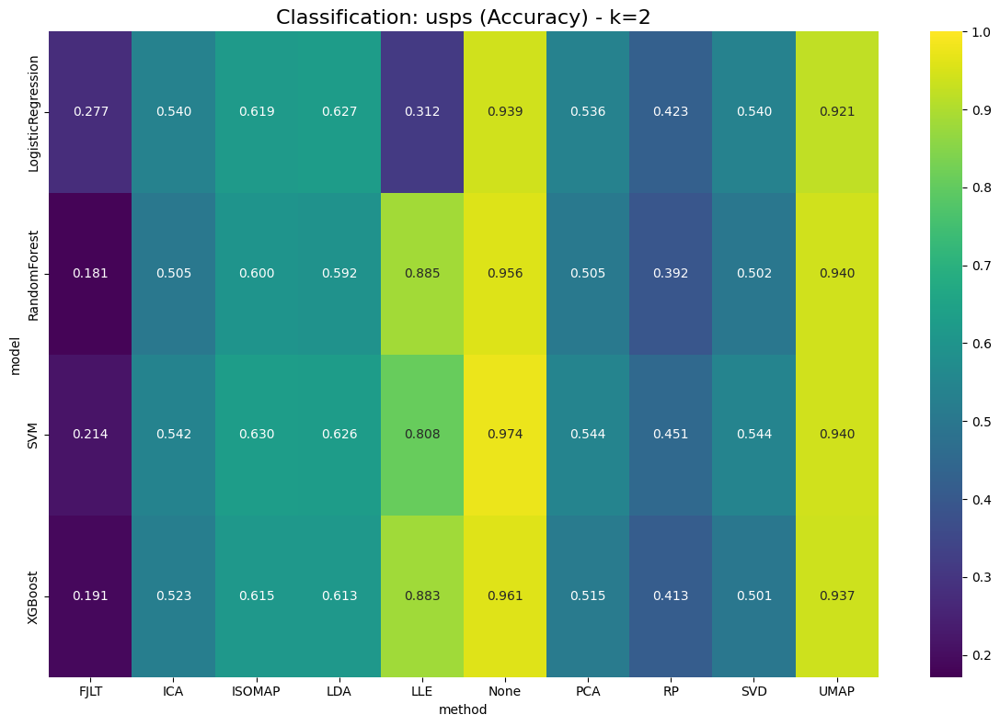

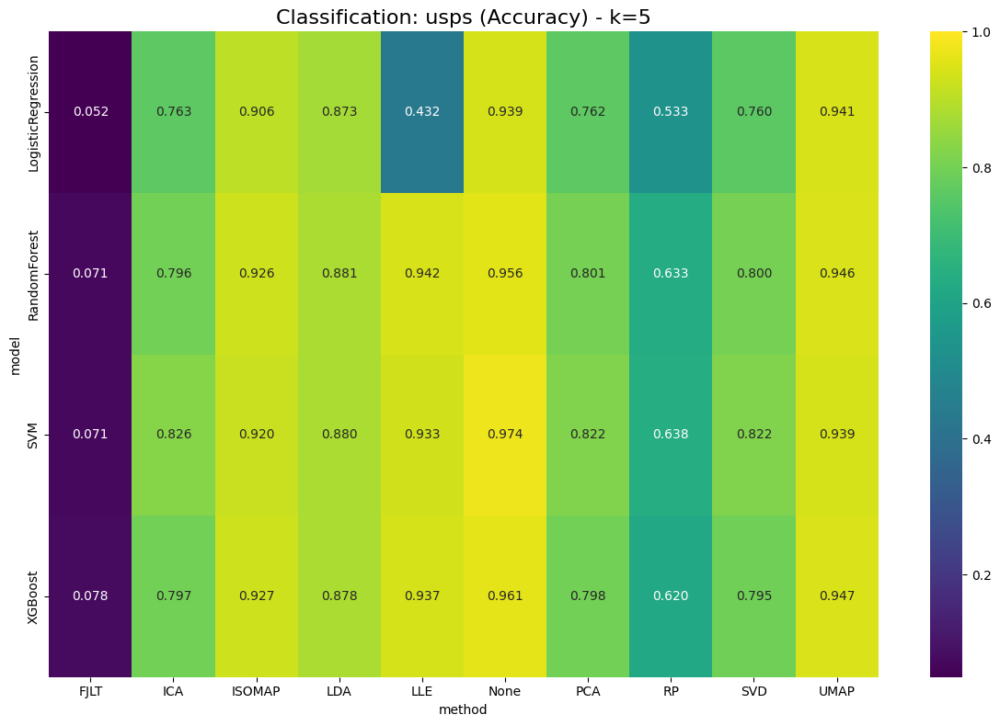

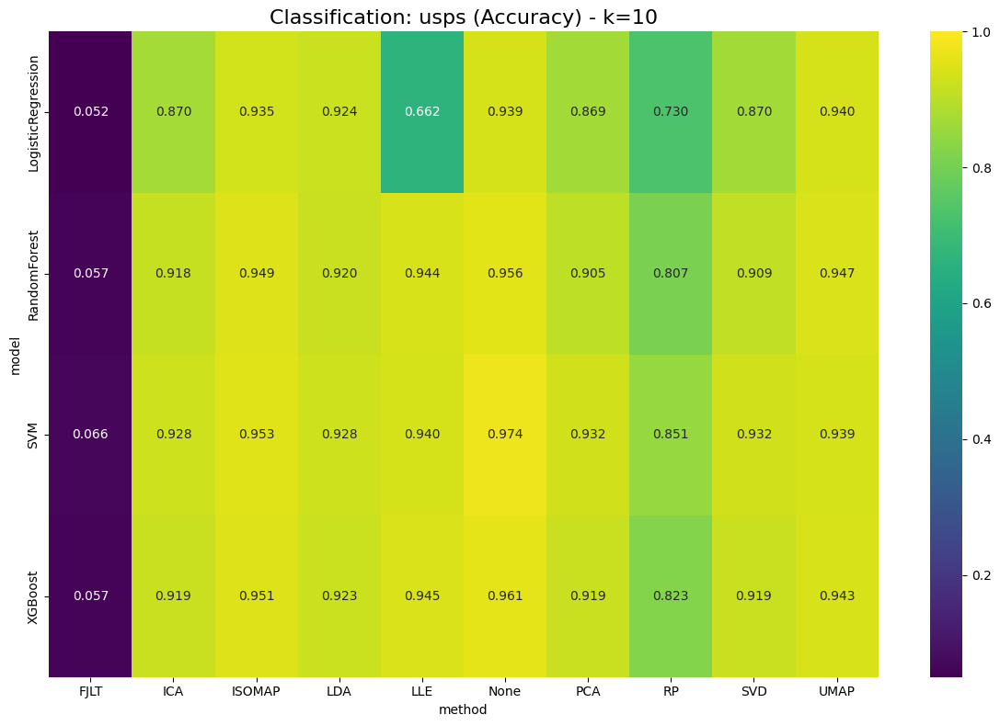

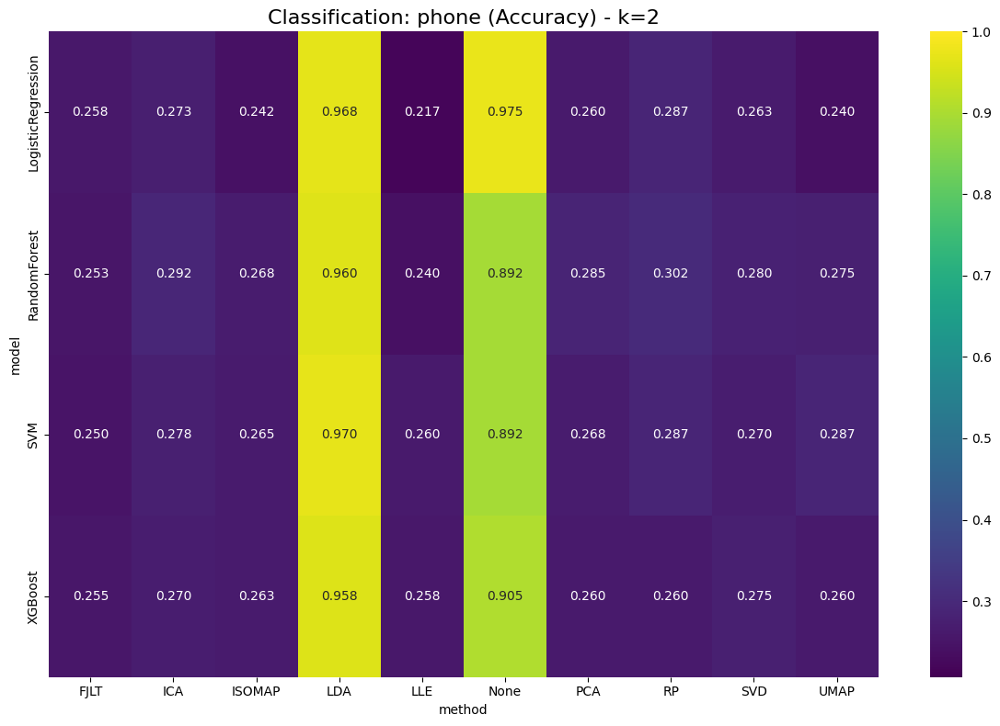

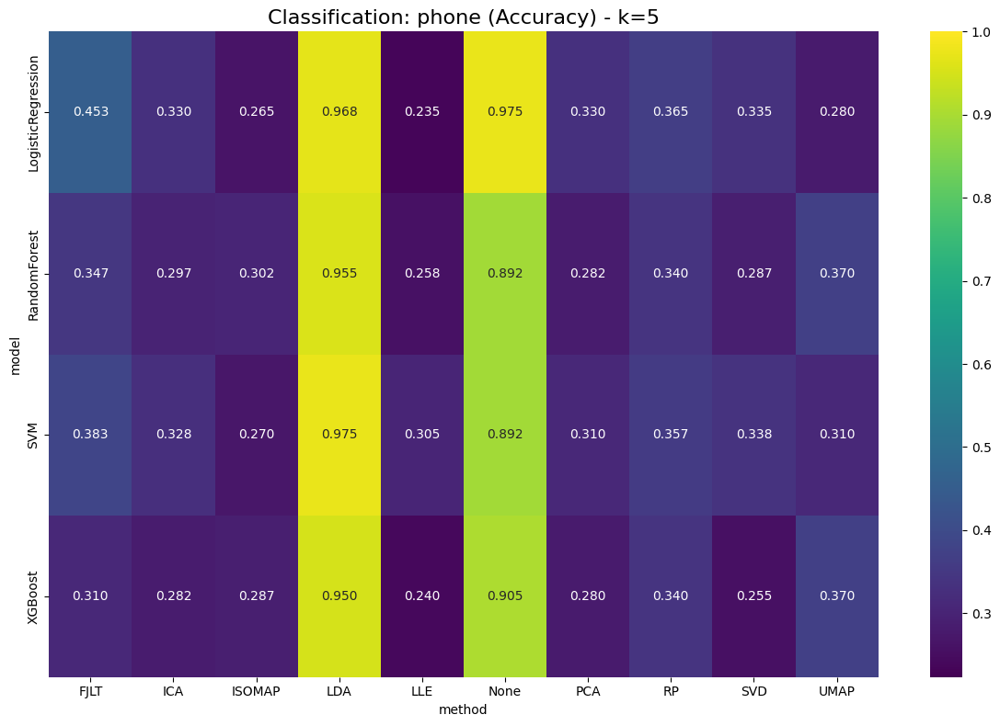

...

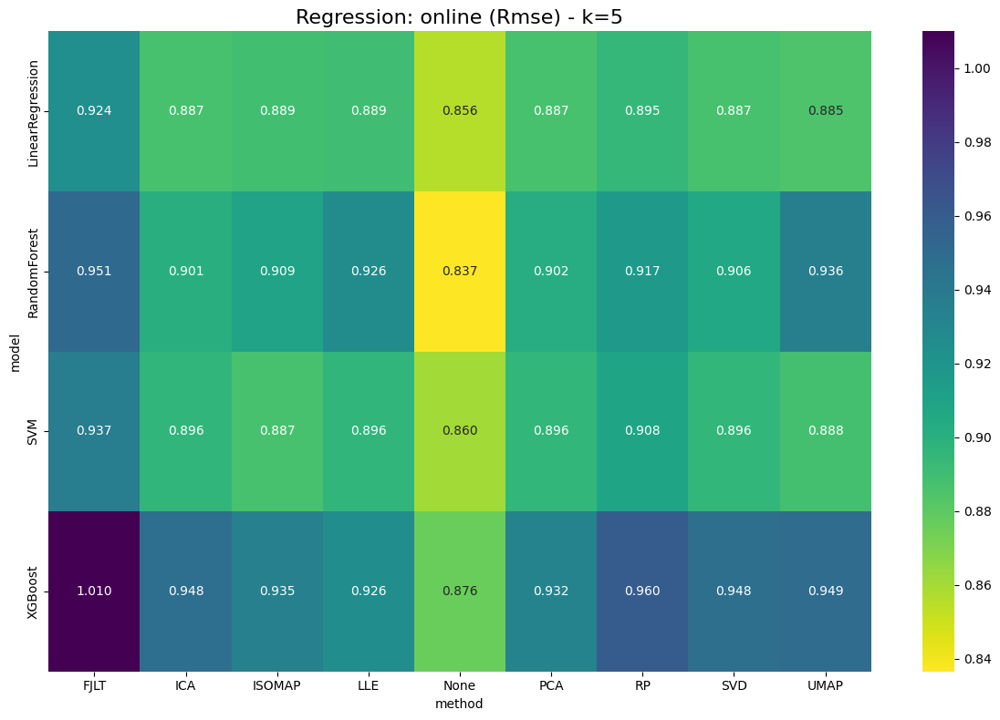

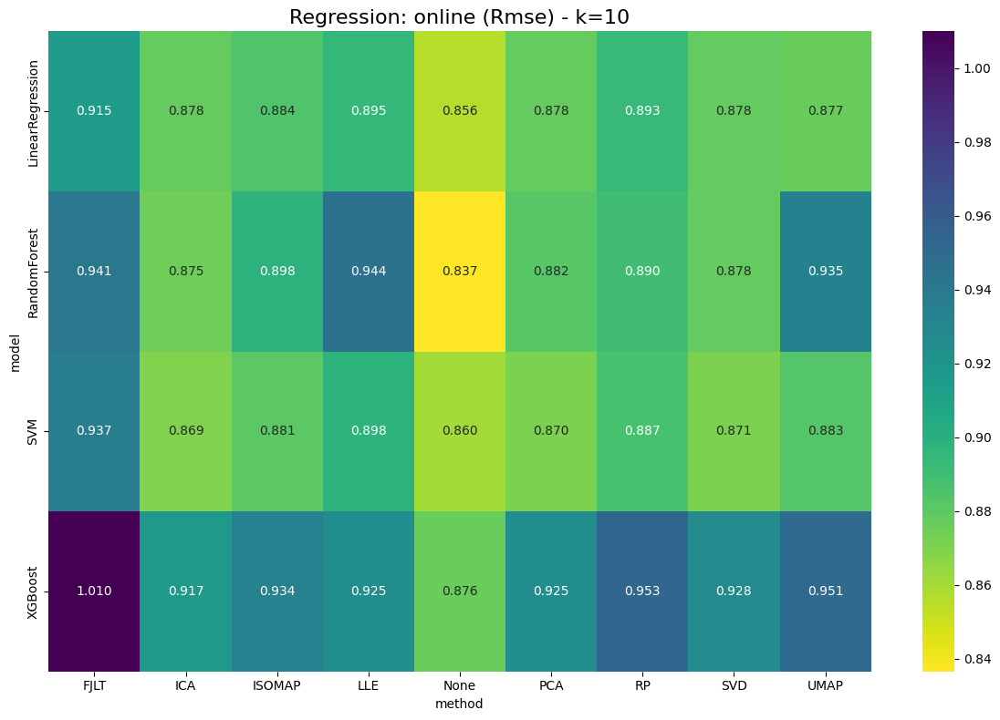

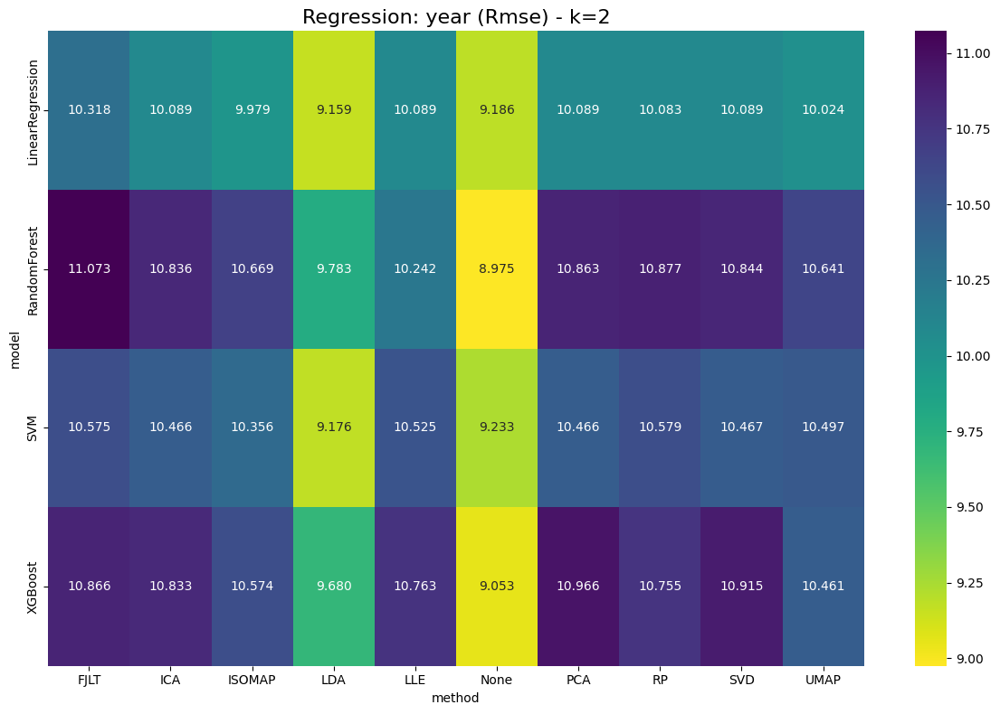

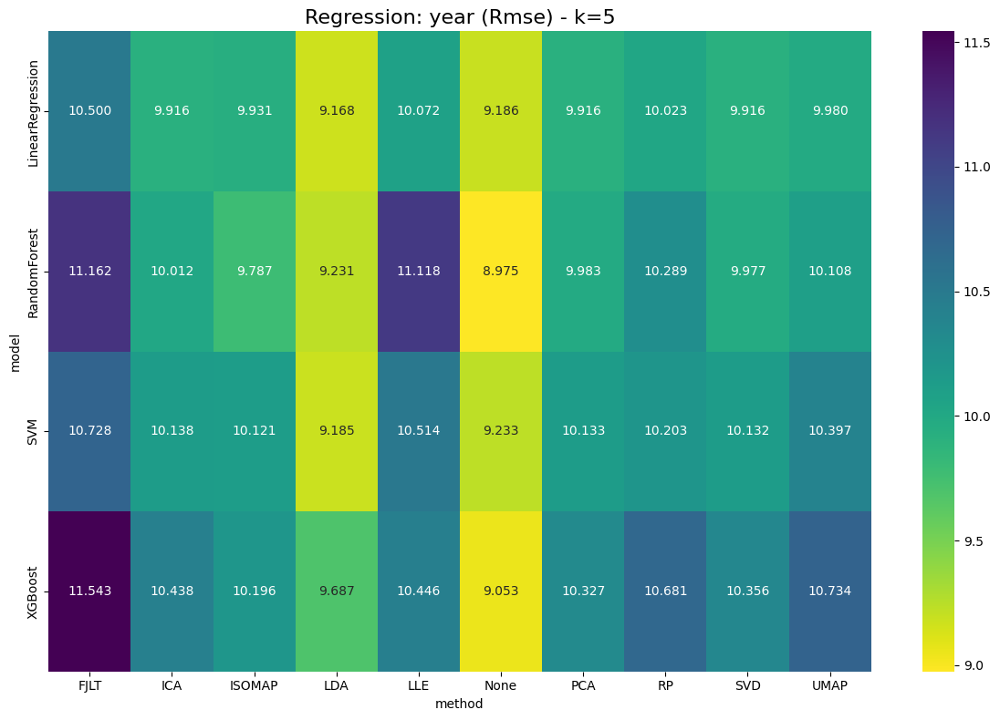

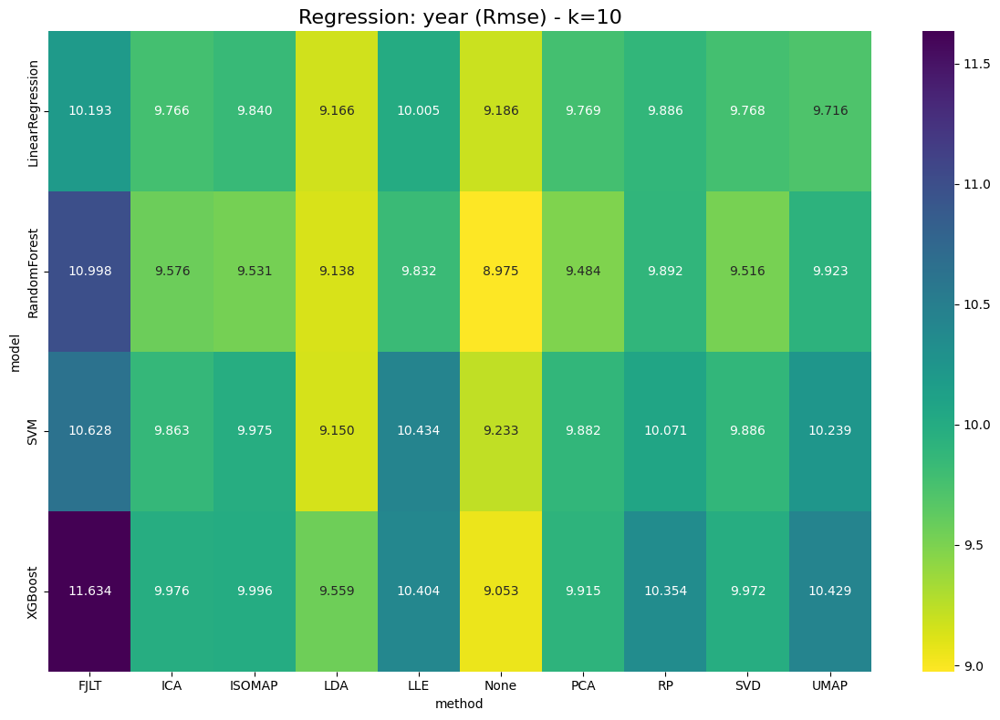

In [20]:
create_method_model_heatmap_by_k(results)

## FJLT vs RP

In [21]:


def compare_fjlt_vs_rp(results):
    """Create specialized comparison between FJLT and RP methods"""
    # Convert nested results to flat structure
    data_rows = []

    for dataset in results:
        base_dataset = dataset.split('_')[0]  # Remove seed number

        # Check if both methods exist for this dataset
        if 'FJLT' not in results[dataset] or 'RP' not in results[dataset]:
            continue

        # Process each k value
        k_values = set(results[dataset]['FJLT'].keys()) & set(results[dataset]['RP'].keys())

        for k in k_values:
            # Add reduction time
            for method in ['FJLT', 'RP']:
                if 'reduction_time' in results[dataset][method][k]:
                    data_rows.append({
                        'dataset': dataset,
                        'base_dataset': base_dataset,
                        'method': method,
                        'k': int(k),
                        'model': 'N/A',
                        'metric': 'reduction_time',
                        'value': results[dataset][method][k]['reduction_time']
                    })

            # Process all models that exist in both methods
            if 'models' in results[dataset]['FJLT'][k] and 'models' in results[dataset]['RP'][k]:
                common_models = set(results[dataset]['FJLT'][k]['models'].keys()) & set(results[dataset]['RP'][k]['models'].keys())

                for model in common_models:
                    # Get all metrics that exist in both
                    fjlt_metrics = set(results[dataset]['FJLT'][k]['models'][model].keys())
                    rp_metrics = set(results[dataset]['RP'][k]['models'][model].keys())
                    common_metrics = fjlt_metrics & rp_metrics

                    for metric in common_metrics:
                        fjlt_value = results[dataset]['FJLT'][k]['models'][model][metric]
                        rp_value = results[dataset]['RP'][k]['models'][model][metric]

                        # Add FJLT data
                        data_rows.append({
                            'dataset': dataset,
                            'base_dataset': base_dataset,
                            'method': 'FJLT',
                            'k': int(k),
                            'model': model,
                            'metric': metric,
                            'value': fjlt_value
                        })

                        # Add RP data
                        data_rows.append({
                            'dataset': dataset,
                            'base_dataset': base_dataset,
                            'method': 'RP',
                            'k': int(k),
                            'model': model,
                            'metric': metric,
                            'value': rp_value
                        })

    # Convert to DataFrame
    df = pd.DataFrame(data_rows)

    if df.empty:
        print("No comparable data found for FJLT and RP")
        return

    # Create visualizations

    # 1. Reduction Time Comparison
    plt.figure(figsize=(12, 6))

    reduction_df = df[df['metric'] == 'reduction_time'].copy()
    reduction_pivot = reduction_df.pivot_table(
        index=['base_dataset', 'k'],
        columns='method',
        values='value'
    ).reset_index()

    # Calculate speedup
    reduction_pivot['Speedup'] = reduction_pivot['RP'] / reduction_pivot['FJLT']

    # Sort by average speedup
    avg_speedup = reduction_pivot.groupby('base_dataset')['Speedup'].mean().sort_values(ascending=False)
    sorted_datasets = avg_speedup.index.tolist()

    # Set up grouped bar chart
    x = np.arange(len(sorted_datasets))
    width = 0.35

    fig, ax = plt.subplots(figsize=(14, 7))

    # Group by dataset and get average across k values
    fjlt_times = []
    rp_times = []
    for dataset in sorted_datasets:
        fjlt_times.append(reduction_pivot[reduction_pivot['base_dataset'] == dataset]['FJLT'].mean())
        rp_times.append(reduction_pivot[reduction_pivot['base_dataset'] == dataset]['RP'].mean())

    # Plot bars
    rects1 = ax.bar(x - width/2, fjlt_times, width, label='FJLT')
    rects2 = ax.bar(x + width/2, rp_times, width, label='RP')

    # Add some text for labels, title and axes ticks
    ax.set_ylabel('Reduction Time (seconds)')
    ax.set_title('FJLT vs RP: Average Dimension Reduction Time by Dataset')
    ax.set_xticks(x)
    ax.set_xticklabels(sorted_datasets)
    ax.legend()

    # Add value labels
    def add_labels(rects):
        for rect in rects:
            height = rect.get_height()
            ax.annotate(f'{height:.2f}',
                        xy=(rect.get_x() + rect.get_width()/2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom')

    add_labels(rects1)
    add_labels(rects2)

    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # 2. Performance Metric Comparison

    # Identify classification vs regression datasets
    metric_types = {}
    for dataset in df['base_dataset'].unique():
        metrics = df[df['base_dataset'] == dataset]['metric'].unique()
        if 'accuracy' in metrics:
            metric_types[dataset] = {'type': 'classification', 'metric': 'accuracy', 'better': 'higher'}
        elif 'f1_score' in metrics:
            metric_types[dataset] = {'type': 'classification', 'metric': 'f1_score', 'better': 'higher'}
        elif 'rmse' in metrics:
            metric_types[dataset] = {'type': 'regression', 'metric': 'rmse', 'better': 'lower'}
        elif 'mape' in metrics:
            metric_types[dataset] = {'type': 'regression', 'metric': 'mape', 'better': 'lower'}

    # Process classification datasets
    class_datasets = [d for d in df['base_dataset'].unique() if d in metric_types
                     and metric_types[d]['type'] == 'classification']

    if class_datasets:
        plt.figure(figsize=(14, 7))

        # Choose metric based on availability
        for dataset in class_datasets:
            metric = metric_types[dataset]['metric']

            # Filter data
            dataset_df = df[(df['base_dataset'] == dataset) & (df['metric'] == metric)]

            if dataset_df.empty:
                continue

            # Find highest k value
            max_k = dataset_df['k'].max()

            # Filter to highest k
            max_k_df = dataset_df[dataset_df['k'] == max_k]

            # Create plot with models on x-axis and methods as different bars
            plt.figure(figsize=(12, 6))

            # Pivot for plotting
            plot_df = max_k_df.pivot_table(
                index='model',
                columns='method',
                values='value'
            )

            # Sort by average performance
            plot_df['avg'] = plot_df.mean(axis=1)
            plot_df = plot_df.sort_values('avg', ascending=False)
            plot_df = plot_df.drop('avg', axis=1)

            # Plot
            ax = plot_df.plot(kind='bar', figsize=(12, 6))

            plt.title(f'FJLT vs RP: {metric.replace("_", " ").title()} for {dataset} (k={max_k})')
            plt.xlabel('Model')
            plt.ylabel(metric.replace("_", " ").title())
            plt.grid(axis='y', linestyle='--', alpha=0.7)
            plt.legend(title='Method')
            plt.tight_layout()
            plt.show()

    # Process regression datasets
    reg_datasets = [d for d in df['base_dataset'].unique() if d in metric_types
                   and metric_types[d]['type'] == 'regression']

    if reg_datasets:
        for dataset in reg_datasets:
            metric = metric_types[dataset]['metric']

            # Filter data
            dataset_df = df[(df['base_dataset'] == dataset) & (df['metric'] == metric)]

            if dataset_df.empty:
                continue

            # Find highest k value
            max_k = dataset_df['k'].max()

            # Filter to highest k
            max_k_df = dataset_df[dataset_df['k'] == max_k]

            # Create plot with models on x-axis and methods as different bars
            plt.figure(figsize=(12, 6))

            # Pivot for plotting
            plot_df = max_k_df.pivot_table(
                index='model',
                columns='method',
                values='value'
            )

            # For regression, lower is better, so sort ascending
            plot_df['avg'] = plot_df.mean(axis=1)
            plot_df = plot_df.sort_values('avg', ascending=True)
            plot_df = plot_df.drop('avg', axis=1)

            # Plot
            ax = plot_df.plot(kind='bar', figsize=(12, 6))

            plt.title(f'FJLT vs RP: {metric.replace("_", " ").title()} for {dataset} (k={max_k})')
            plt.xlabel('Model')
            plt.ylabel(metric.replace("_", " ").title())
            plt.grid(axis='y', linestyle='--', alpha=0.7)
            plt.legend(title='Method')
            plt.tight_layout()
            plt.show()

    # 3. Performance across k values

    # For each dataset and model, compare performance across k values
    for dataset in df['base_dataset'].unique():
        if dataset not in metric_types:
            continue

        metric = metric_types[dataset]['metric']
        better = metric_types[dataset]['better']

        dataset_df = df[(df['base_dataset'] == dataset) & (df['metric'] == metric)]

        if dataset_df.empty:
            continue

        for model in dataset_df['model'].unique():
            if model == 'N/A':
                continue

            model_df = dataset_df[dataset_df['model'] == model]

            # Check if we have enough data points
            fjlt_count = model_df[model_df['method'] == 'FJLT']['k'].nunique()
            rp_count = model_df[model_df['method'] == 'RP']['k'].nunique()

            if fjlt_count < 2 or rp_count < 2:
                continue

            # Create plot
            plt.figure(figsize=(10, 6))

            # Plot each method
            for method in ['FJLT', 'RP']:
                method_df = model_df[model_df['method'] == method].sort_values('k')
                plt.plot(method_df['k'], method_df['value'], 'o-', label=method)

            plt.title(f'{metric.replace("_", " ").title()} vs k for {dataset} - {model}')
            plt.xlabel('Number of Components (k)')
            plt.ylabel(metric.replace("_", " ").title())
            plt.grid(True, alpha=0.7)
            plt.legend()
            plt.tight_layout()
            plt.show()

    # 4. Create summary table
    print("\nFJLT vs RP Summary:\n")

    summary_rows = []
    for dataset in df['base_dataset'].unique():
        if dataset not in metric_types:
            continue

        metric = metric_types[dataset]['metric']
        better = metric_types[dataset]['better']

        dataset_df = df[(df['base_dataset'] == dataset) & (df['metric'] == metric)]

        if dataset_df.empty:
            continue

        # Get reduction time comparison
        red_df = df[(df['base_dataset'] == dataset) & (df['metric'] == 'reduction_time')]

        if not red_df.empty:
            fjlt_red = red_df[red_df['method'] == 'FJLT']['value'].mean()
            rp_red = red_df[red_df['method'] == 'RP']['value'].mean()
            red_diff = rp_red - fjlt_red
            red_pct = (red_diff / fjlt_red) * 100 if fjlt_red > 0 else 0
        else:
            fjlt_red = None
            rp_red = None
            red_diff = None
            red_pct = None

        # Get performance comparison at highest k
        max_k = dataset_df['k'].max()
        max_k_df = dataset_df[dataset_df['k'] == max_k]

        for model in max_k_df['model'].unique():
            if model == 'N/A':
                continue

            model_df = max_k_df[max_k_df['model'] == model]

            fjlt_perf = model_df[model_df['method'] == 'FJLT']['value'].values
            rp_perf = model_df[model_df['method'] == 'RP']['value'].values

            if len(fjlt_perf) == 0 or len(rp_perf) == 0:
                continue

            fjlt_perf = fjlt_perf[0]
            rp_perf = rp_perf[0]

            # Calculate difference (direction depends on whether higher or lower is better)
            if better == 'higher':
                perf_diff = rp_perf - fjlt_perf
                better_method = 'RP' if perf_diff > 0 else 'FJLT'
            else:  # lower is better
                perf_diff = fjlt_perf - rp_perf
                better_method = 'RP' if perf_diff > 0 else 'FJLT'

            # Calculate percentage difference
            base = fjlt_perf if better == 'higher' else fjlt_perf
            perf_pct = (abs(perf_diff) / base) * 100 if base > 0 else 0

            # Add to summary
            summary_rows.append({
                'Dataset': dataset,
                'Model': model,
                'Metric': metric,
                'k': max_k,
                'FJLT Value': fjlt_perf,
                'RP Value': rp_perf,
                'Better Method': better_method,
                'Performance Diff %': perf_pct,
                'FJLT Red. Time': fjlt_red,
                'RP Red. Time': rp_red,
                'Reduction Diff %': red_pct
            })

    if summary_rows:
        summary_df = pd.DataFrame(summary_rows)

        # Format for display
        pd.set_option('display.max_rows', None)
        pd.set_option('display.max_columns', None)
        pd.set_option('display.width', 1000)
        pd.set_option('display.precision', 2)

        print(summary_df.to_string(index=False))

        # Reset display options
        pd.reset_option('display.max_rows')
        pd.reset_option('display.max_columns')
        pd.reset_option('display.width')
        pd.reset_option('display.precision')
    else:
        print("No summary data available")

<Figure size 1200x600 with 0 Axes>

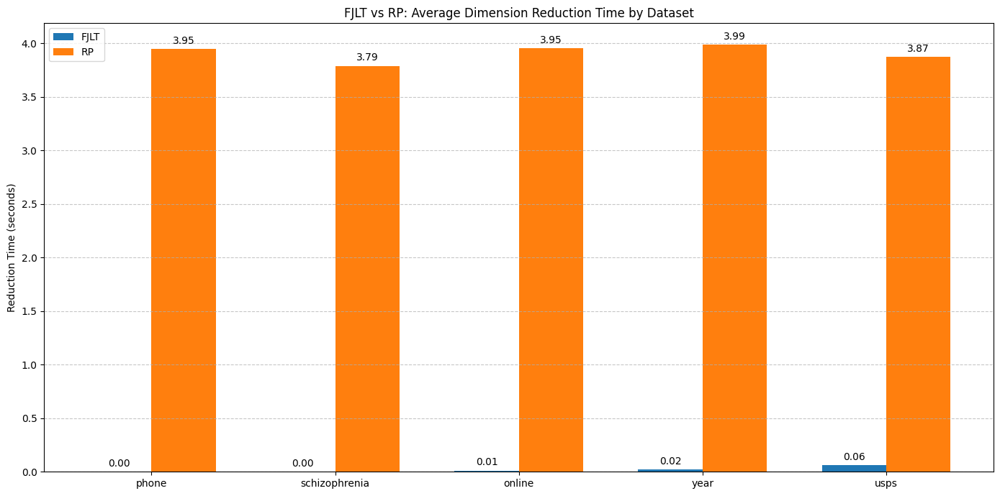

<Figure size 1400x700 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

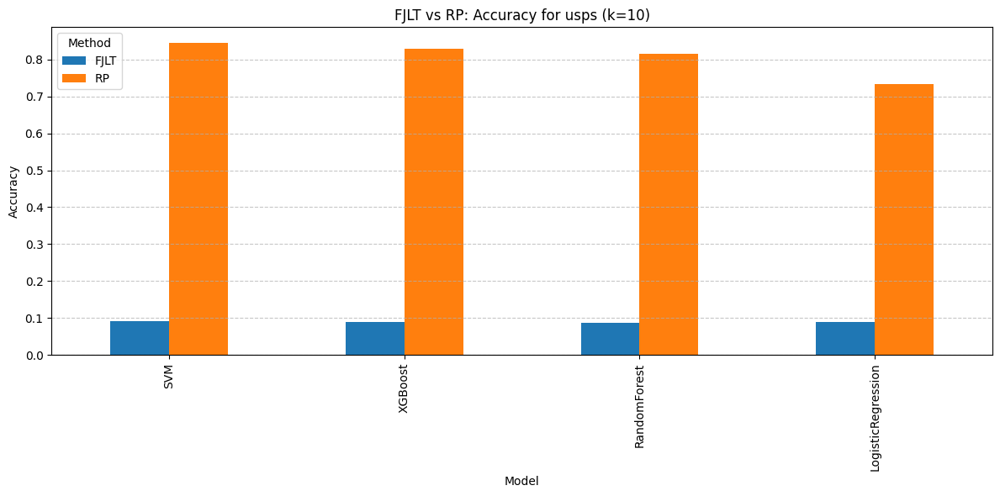

<Figure size 1200x600 with 0 Axes>

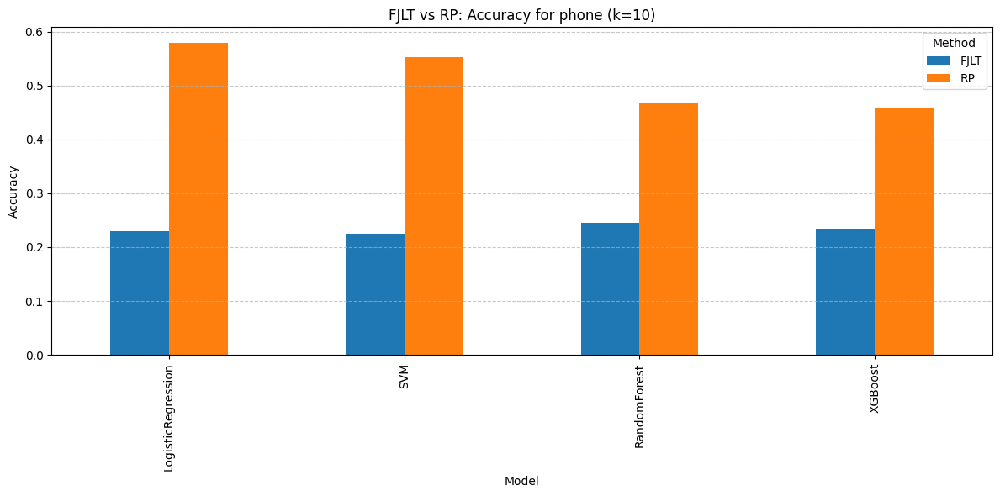

<Figure size 1200x600 with 0 Axes>

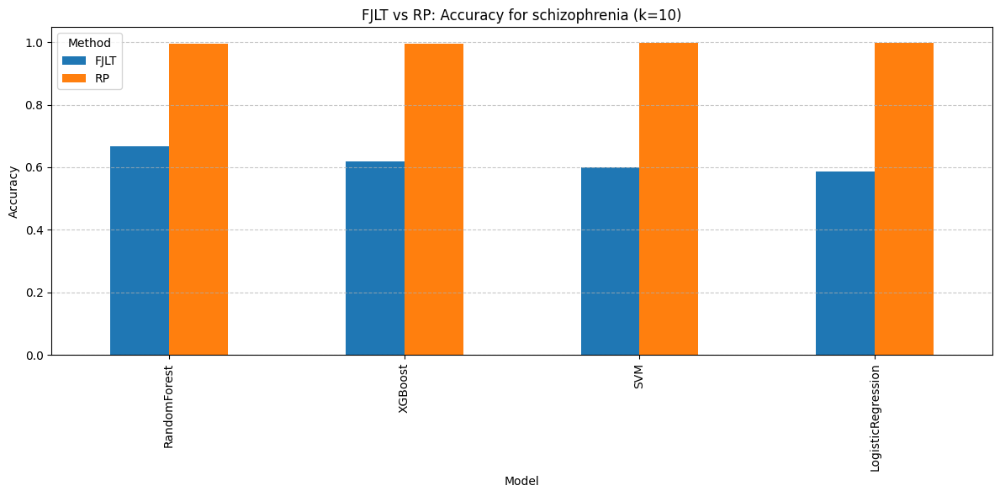

<Figure size 1200x600 with 0 Axes>

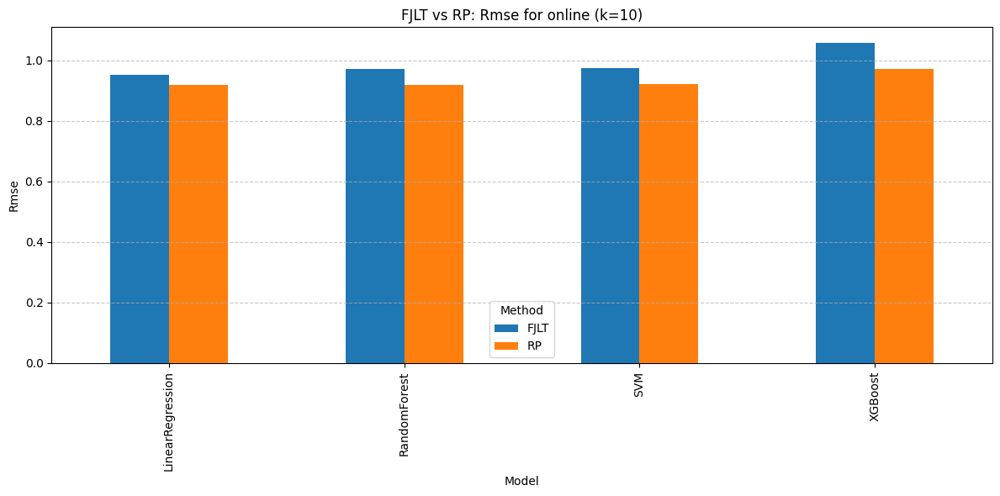

<Figure size 1200x600 with 0 Axes>

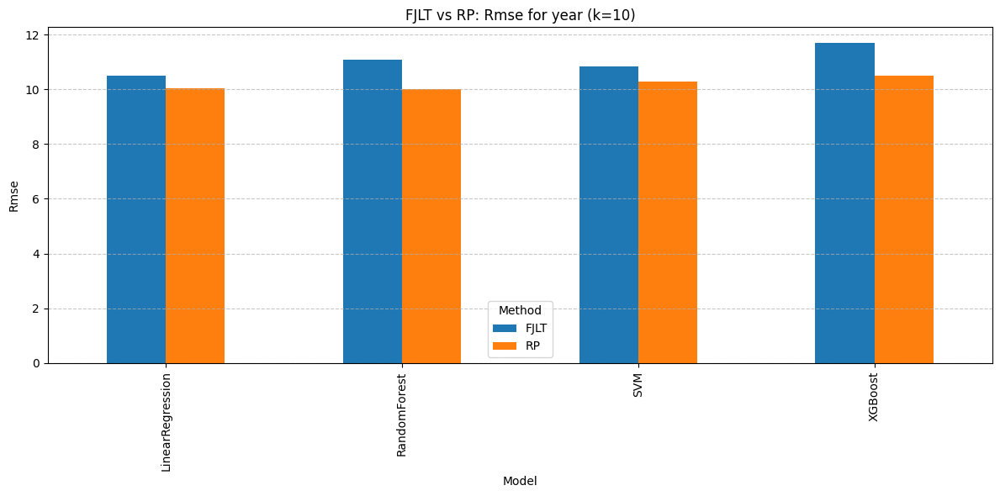

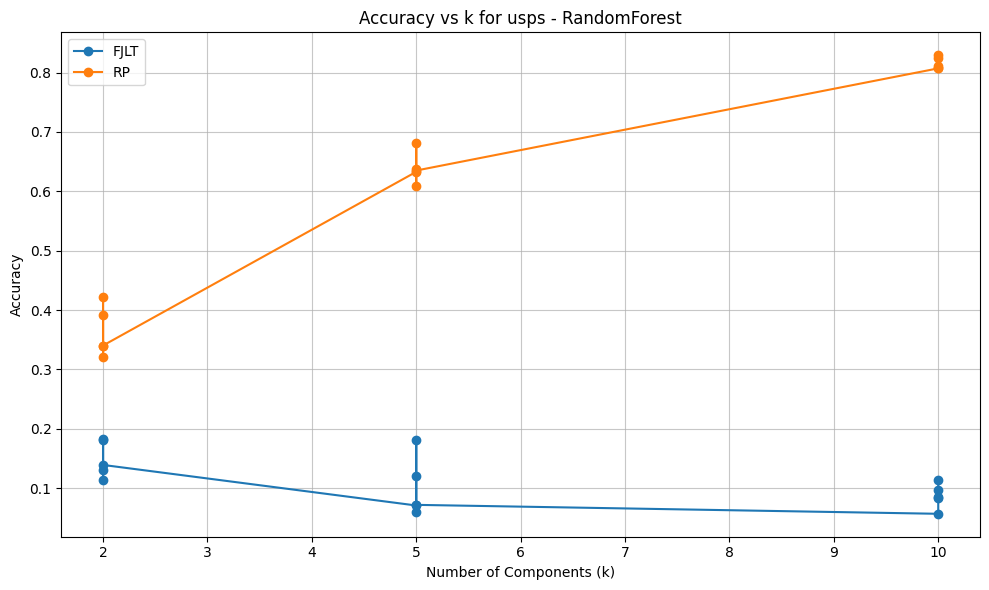

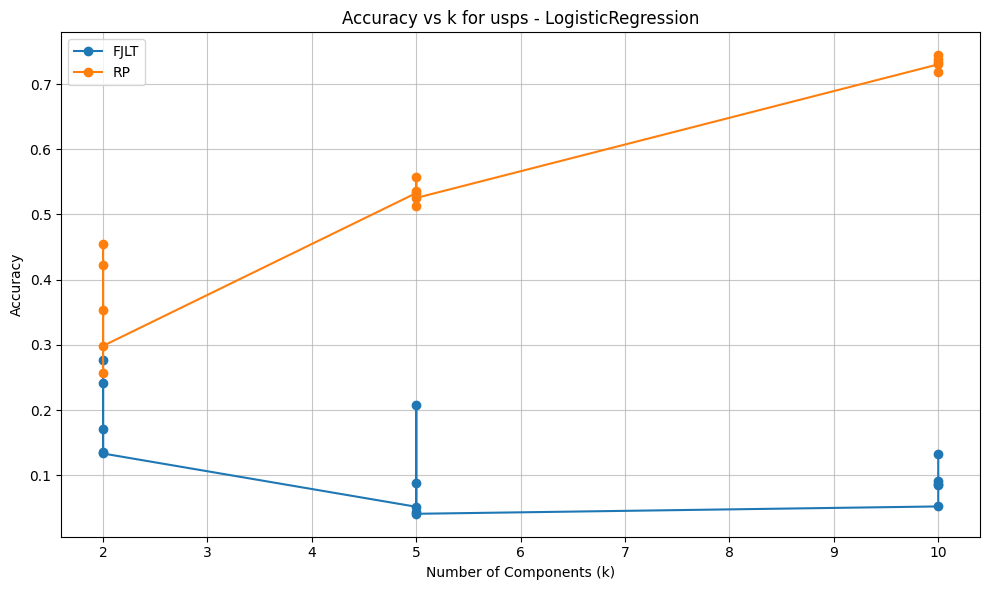

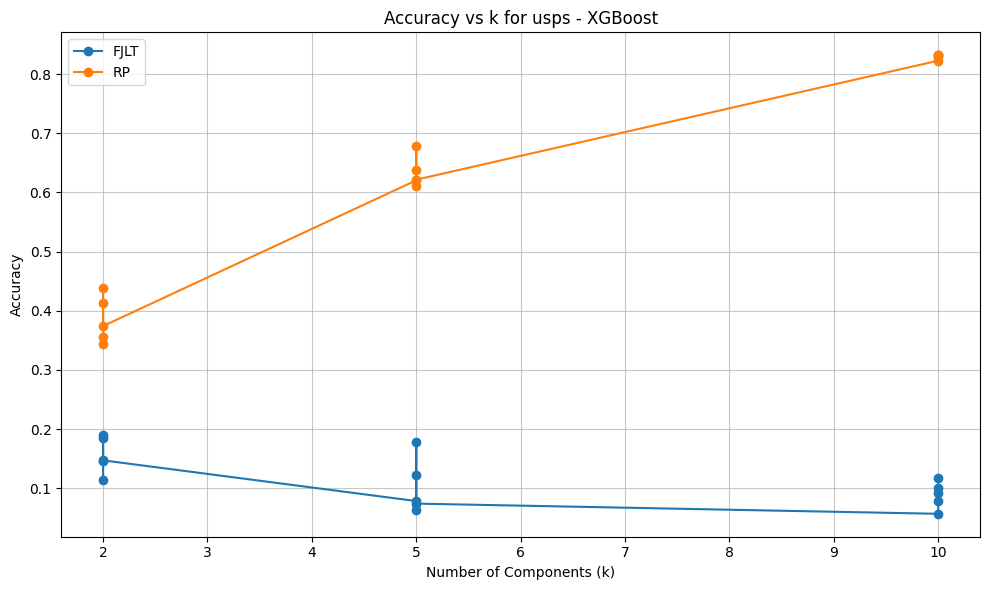

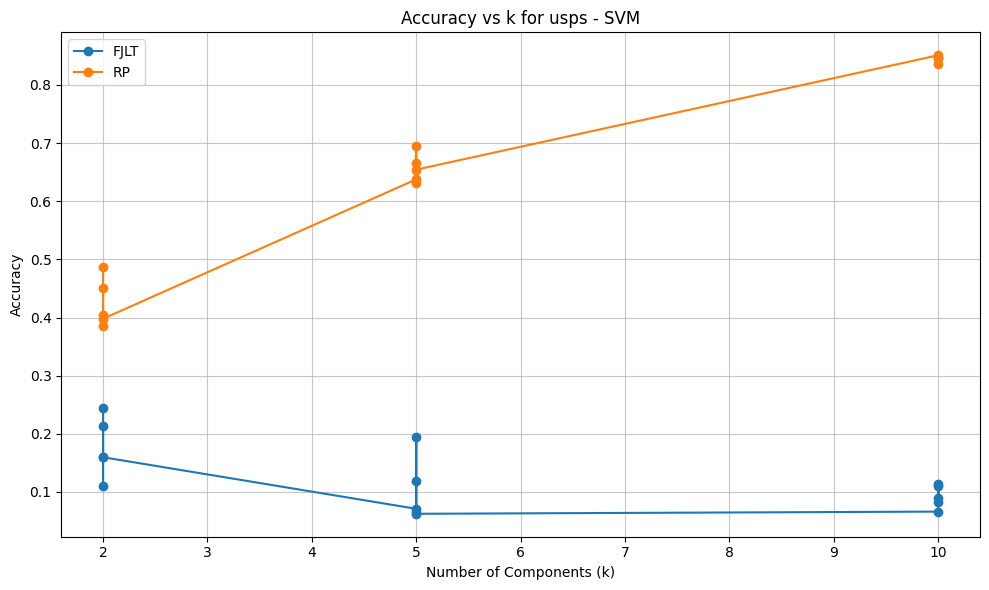

...

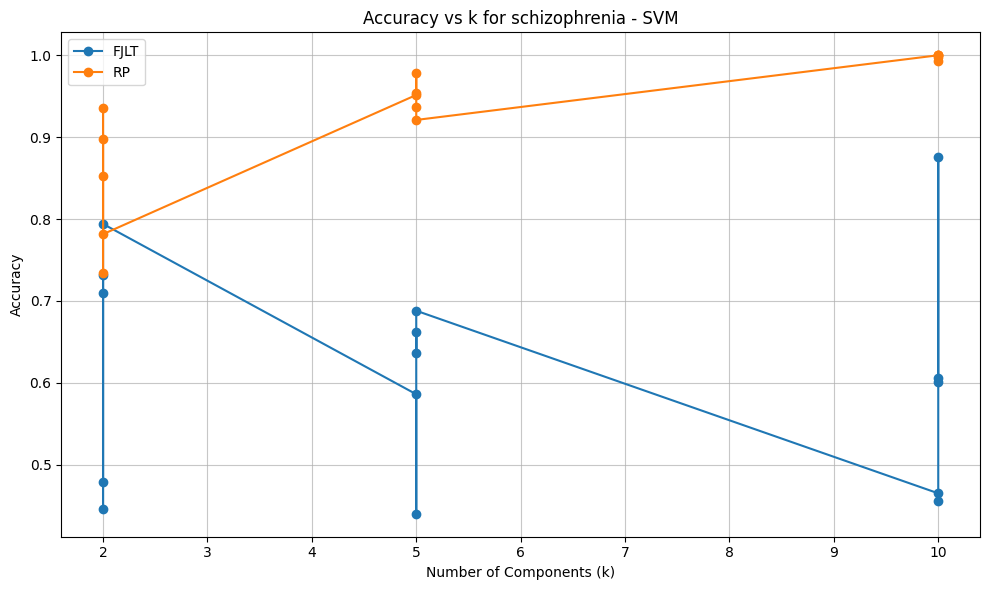

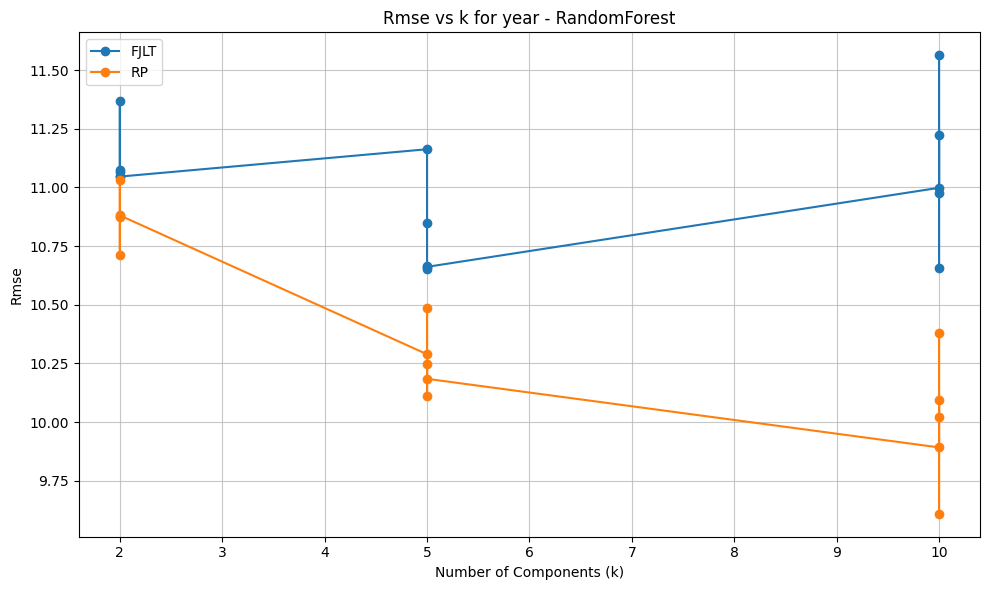

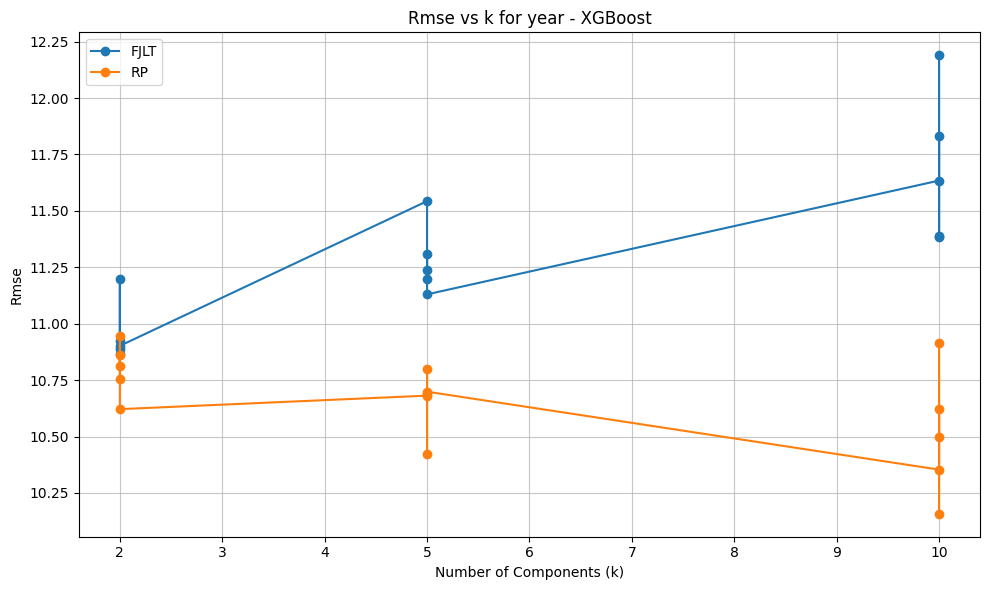

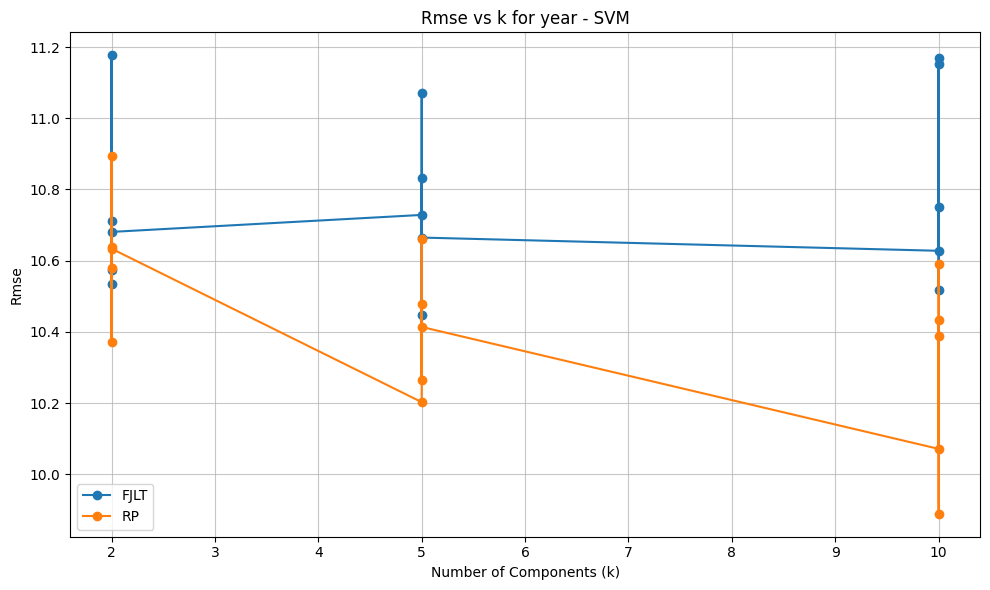

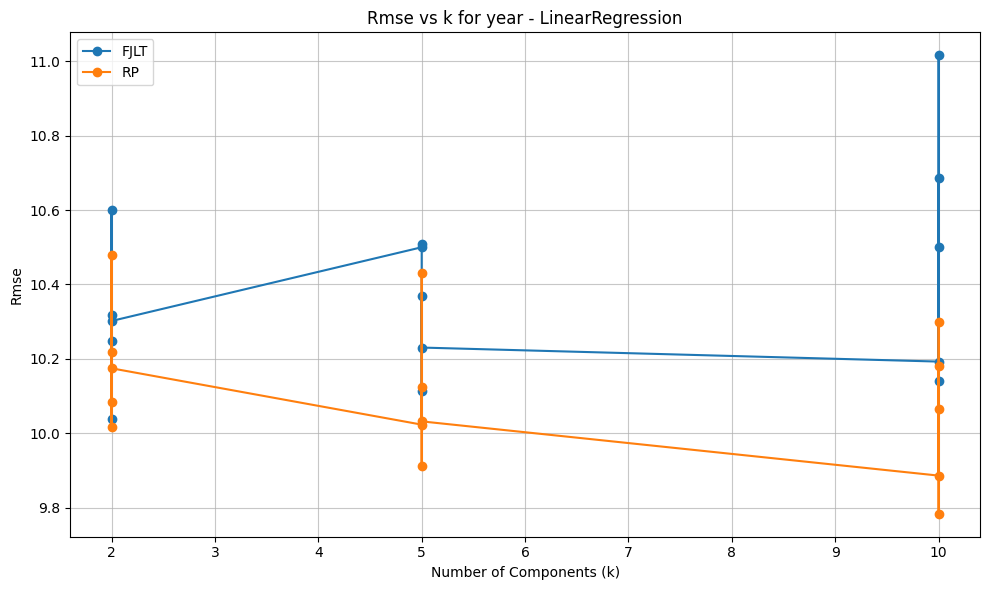


FJLT vs RP Summary:

      Dataset              Model   Metric  k  FJLT Value  RP Value Better Method  Performance Diff %  FJLT Red. Time  RP Red. Time  Reduction Diff %
         usps       RandomForest accuracy 10        0.06      0.81            RP             1316.04        6.32e-02          3.87           6026.62
         usps LogisticRegression accuracy 10        0.05      0.73            RP             1300.00        6.32e-02          3.87           6026.62
         usps            XGBoost accuracy 10        0.06      0.82            RP             1343.40        6.32e-02          3.87           6026.62
         usps                SVM accuracy 10        0.07      0.85            RP             1186.99        6.32e-02          3.87           6026.62
       online       RandomForest     rmse 10        0.94      0.89            RP                5.45        1.15e-02          3.95          34189.60
       online            XGBoost     rmse 10        1.01      0.95            RP    

In [22]:
compare_fjlt_vs_rp(results)

## Time-Performance Tradeoff

In [23]:
def plot_time_performance_tradeoff(results):
    """
    Create clearer visualizations showing the tradeoff between reduction time and model performance.

    Improvements:
    - Separate plots for different k values
    - Simplified labeling
    - Larger point sizes with consistent scaling
    - Better color differentiation
    - Focus on the best performing methods
    """
    import matplotlib.pyplot as plt
    import pandas as pd
    import numpy as np
    import matplotlib.colors as mcolors
    import matplotlib.cm as cm
    import seaborn as sns

    # Set seaborn style for better aesthetics
    sns.set_style("whitegrid")

    # Convert results to DataFrame
    df = convert_results_to_dataframe(results)

    if df.empty:
        print("No data to visualize")
        return

    # Get unique datasets
    datasets = df['base_dataset'].unique()

    # Process each dataset
    for dataset in datasets:
        dataset_df = df[df['base_dataset'] == dataset]

        # Identify performance metrics (classification vs regression)
        perf_metrics = [m for m in dataset_df['metric'].unique()
                       if m not in ['train_time', 'inference_time', 'reduction_time']]

        if 'accuracy' in perf_metrics or 'f1_score' in perf_metrics:
            metric_type = 'classification'
            main_metric = 'accuracy' if 'accuracy' in perf_metrics else 'f1_score'
            is_higher_better = True
        elif 'rmse' in perf_metrics or 'mape' in perf_metrics:
            metric_type = 'regression'
            main_metric = 'rmse' if 'rmse' in perf_metrics else 'mape'
            is_higher_better = False
        else:
            metric_type = 'unknown'
            main_metric = perf_metrics[0] if perf_metrics else None
            is_higher_better = True  # Default

        if main_metric is None:
            print(f"No performance metrics found for dataset {dataset}")
            continue

        # Get unique models and methods
        models = dataset_df[dataset_df['model'] != 'N/A']['model'].unique()
        methods = dataset_df['method'].unique()
        k_values = sorted(dataset_df['k'].unique())

        # APPROACH 1: One plot per k value per model
        # =====================================================
        for model in models:
            for k in k_values:
                # Create a new figure
                plt.figure(figsize=(12, 8))

                # Prepare data for the plot
                plot_data = []

                # Filter to this k value
                k_df = dataset_df[dataset_df['k'] == k]

                for method in methods:
                    # Get performance for this method, model and k
                    perf_df = k_df[(k_df['metric'] == main_metric) &
                                 (k_df['model'] == model) &
                                 (k_df['method'] == method)]

                    # Get reduction time for this method and k
                    time_df = k_df[(k_df['metric'] == 'reduction_time') &
                                 (k_df['method'] == method)]

                    if not perf_df.empty and not time_df.empty:
                        perf_value = perf_df['value'].values[0]
                        time_value = time_df['value'].values[0]

                        plot_data.append({
                            'method': method,
                            'performance': perf_value,
                            'red_time': time_value
                        })

                if not plot_data:
                    plt.close()
                    continue

                # Convert to DataFrame for plotting
                plot_df = pd.DataFrame(plot_data)

                # Get a distinct color palette - use a clearer colormap
                methods_list = plot_df['method'].unique()
                palette = sns.color_palette("tab20", len(methods_list))

                # Set point size - make it larger for better visibility
                point_size = 150

                # Create scatter plot
                scatter = sns.scatterplot(
                    data=plot_df,
                    x='red_time',
                    y='performance',
                    hue='method',
                    palette=palette,
                    s=point_size,
                    alpha=0.8,
                    edgecolor='black'
                )

                # For regression metrics (like RMSE), lower is better - flip the y-axis
                if not is_higher_better:
                    plt.gca().invert_yaxis()

                # Set log scale for x-axis
                plt.xscale('log')

                # Format the plot
                metric_name = main_metric.replace('_', ' ').title()
                plt.title(f'{dataset} with {model} (k={k})', fontsize=16, pad=20)
                plt.xlabel('Dimension Reduction Time (seconds, log scale)', fontsize=14)
                plt.ylabel(f'{metric_name} ({"higher is better" if is_higher_better else "lower is better"})', fontsize=14)

                # Use a separate legend to avoid overcrowding
                plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Method")

                # Add method labels directly on the points instead of k value annotations
                for i, row in plot_df.iterrows():
                    # Only label the top and bottom performers to reduce clutter
                    if i < 3 or i >= len(plot_df) - 3:  # Label top 3 and bottom 3
                        plt.annotate(
                            row['method'],
                            (row['red_time'], row['performance']),
                            xytext=(5, 0),
                            textcoords='offset points',
                            fontsize=10,
                            fontweight='bold'
                        )

                plt.tight_layout()
                plt.show()

        # APPROACH 2: Performance vs Time for all models at fixed k
        # =====================================================
        # Use the highest k value for a summary plot
        max_k = max(k_values)

        plt.figure(figsize=(14, 10))

        # Prepare data for all models at max k
        all_models_data = []

        for model in models:
            for method in methods:
                # Get performance for this method, model at max k
                perf_df = dataset_df[(dataset_df['metric'] == main_metric) &
                                   (dataset_df['model'] == model) &
                                   (dataset_df['method'] == method) &
                                   (dataset_df['k'] == max_k)]

                # Get reduction time for this method at max k
                time_df = dataset_df[(dataset_df['metric'] == 'reduction_time') &
                                   (dataset_df['method'] == method) &
                                   (dataset_df['k'] == max_k)]

                if not perf_df.empty and not time_df.empty:
                    perf_value = perf_df['value'].values[0]
                    time_value = time_df['value'].values[0]

                    all_models_data.append({
                        'method': method,
                        'model': model,
                        'performance': perf_value,
                        'red_time': time_value
                    })

        if not all_models_data:
            continue

        # Convert to DataFrame for plotting
        all_models_df = pd.DataFrame(all_models_data)

        # Create model-method combinations for better visualization
        all_models_df['model_method'] = all_models_df['model'] + ' + ' + all_models_df['method']

        # Sort by performance to identify the best combinations
        if is_higher_better:
            all_models_df = all_models_df.sort_values('performance', ascending=False)
        else:
            all_models_df = all_models_df.sort_values('performance', ascending=True)

        # Take only the top 15 performers to avoid clutter
        top_df = all_models_df.head(15)

        # Create a custom palette that varies by model and method
        unique_models = top_df['model'].unique()
        model_colors = dict(zip(unique_models, sns.color_palette("tab10", len(unique_models))))

        # Create scatter plot with custom color mapping
        plt.figure(figsize=(14, 10))

        # Create scatter plot
        for model in unique_models:
            model_data = top_df[top_df['model'] == model]

            # Different alpha for different methods
            for i, method in enumerate(model_data['method'].unique()):
                method_data = model_data[model_data['method'] == method]

                # Calculate alpha based on method (to differentiate methods of same model)
                alpha = 0.5 + (0.5 * i / len(model_data['method'].unique()))

                plt.scatter(
                    method_data['red_time'],
                    method_data['performance'],
                    s=200,  # Larger point size
                    color=model_colors[model],
                    alpha=alpha,
                    edgecolor='black',
                    label=f"{model} + {method}"
                )

                # Label each point with its model-method combination
                for _, row in method_data.iterrows():
                    plt.annotate(
                        f"{model} + {method}",
                        (row['red_time'], row['performance']),
                        xytext=(5, 0),
                        textcoords='offset points',
                        fontsize=10,
                        fontweight='bold'
                    )

        # For regression metrics (like RMSE), lower is better - flip the y-axis
        if not is_higher_better:
            plt.gca().invert_yaxis()

        # Set log scale for x-axis
        plt.xscale('log')

        # Format the plot
        metric_name = main_metric.replace('_', ' ').title()
        plt.title(f'Top Performers: {dataset} (k={max_k})', fontsize=16, pad=20)
        plt.xlabel('Dimension Reduction Time (seconds, log scale)', fontsize=14)
        plt.ylabel(f'{metric_name} ({"higher is better" if is_higher_better else "lower is better"})', fontsize=14)
        plt.grid(True, alpha=0.3)

        # Legend outside of plot
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

        plt.tight_layout()
        plt.show()

        # APPROACH 3: Comparative matrix visualization
        # =====================================================

        # Create a matrix showing the performance and time trade-off
        matrix_data = {}

        # Use the highest k value
        k = max_k

        # For each method, collect performance and time
        for method in methods:
            # Get performance for each model with this method
            for model in models:
                perf_df = dataset_df[(dataset_df['metric'] == main_metric) &
                                   (dataset_df['model'] == model) &
                                   (dataset_df['method'] == method) &
                                   (dataset_df['k'] == k)]

                # Get reduction time for this method
                time_df = dataset_df[(dataset_df['metric'] == 'reduction_time') &
                                   (dataset_df['method'] == method) &
                                   (dataset_df['k'] == k)]

                if not perf_df.empty and not time_df.empty:
                    perf_value = perf_df['value'].values[0]
                    time_value = time_df['value'].values[0]

                    if method not in matrix_data:
                        matrix_data[method] = {
                            'time': time_value,
                            'models': {}
                        }

                    matrix_data[method]['models'][model] = perf_value

        # Create a dataframe for the heatmap
        heatmap_rows = []

        for method, data in matrix_data.items():
            for model, perf in data['models'].items():
                heatmap_rows.append({
                    'Method': method,
                    'Model': model,
                    'Performance': perf,
                    'Time': data['time']
                })

        if not heatmap_rows:
            continue

        heatmap_df = pd.DataFrame(heatmap_rows)

        # Pivot the data for the heatmap
        pivot_df = heatmap_df.pivot_table(
            values='Performance',
            index='Method',
            columns='Model'
        )

        # Sort methods by time
        time_sorted_methods = heatmap_df.groupby('Method')['Time'].mean().sort_values().index
        pivot_df = pivot_df.reindex(time_sorted_methods)

        # Create a figure large enough for the heatmap
        plt.figure(figsize=(16, 10))

        # Create heatmap
        if is_higher_better:
            cmap = "viridis"  # Higher values (yellows) are better
        else:
            cmap = "viridis_r"  # Lower values (blues) are better

        ax = sns.heatmap(
            pivot_df,
            annot=True,
            fmt=".3f",
            cmap=cmap,
            linewidths=0.5,
            cbar_kws={'label': f'{main_metric.replace("_", " ").title()}'}
        )

        # Add method time information
        method_times = {method: data['time'] for method, data in matrix_data.items()}

        # Add time labels to y-axis
        plt.yticks(
            [i + 0.5 for i in range(len(pivot_df.index))],
            [f"{method} ({method_times[method]:.2f}s)" for method in pivot_df.index],
            rotation=0
        )

        plt.title(f'Method-Model Performance Comparison: {dataset} (k={k})', fontsize=16, pad=20)
        plt.tight_layout()
        plt.show()

        # Create a time-sorted bar chart showing the best model for each method
        best_model_per_method = {}

        for method, data in matrix_data.items():
            model_perfs = data['models']
            if is_higher_better:
                best_model = max(model_perfs.items(), key=lambda x: x[1])
            else:
                best_model = min(model_perfs.items(), key=lambda x: x[1])

            best_model_per_method[method] = {
                'model': best_model[0],
                'performance': best_model[1],
                'time': data['time']
            }

        # Convert to dataframe for plotting
        best_df = pd.DataFrame([
            {
                'Method': method,
                'Best Model': data['model'],
                'Performance': data['performance'],
                'Time': data['time']
            }
            for method, data in best_model_per_method.items()
        ])

        # Sort by time
        best_df = best_df.sort_values('Time')

        # Create figure
        plt.figure(figsize=(12, 8))

        # Create bar chart
        bars = plt.bar(
            best_df['Method'],
            best_df['Performance'],
            color=sns.color_palette("tab20", len(best_df))
        )

        # Add best model labels on top of bars
        for i, bar in enumerate(bars):
            plt.text(
                bar.get_x() + bar.get_width()/2,
                bar.get_height() * 1.01,
                best_df.iloc[i]['Best Model'],
                ha='center',
                va='bottom',
                fontsize=10,
                fontweight='bold',
                rotation=45
            )

            # Add time labels below x-axis
            plt.text(
                bar.get_x() + bar.get_width()/2,
                0,
                f"{best_df.iloc[i]['Time']:.2f}s",
                ha='center',
                va='top',
                fontsize=9,
                rotation=45
            )

        # If lower is better (e.g., RMSE), invert y-axis
        if not is_higher_better:
            plt.gca().invert_yaxis()

        plt.title(f'Best Model per Method: {dataset} (k={k})', fontsize=16, pad=20)
        plt.xlabel('Dimension Reduction Method', fontsize=14)
        plt.ylabel(f'{main_metric.replace("_", " ").title()}', fontsize=14)
        plt.xticks(rotation=45, ha='right')
        plt.grid(axis='y', alpha=0.3)
        plt.tight_layout()
        plt.show()


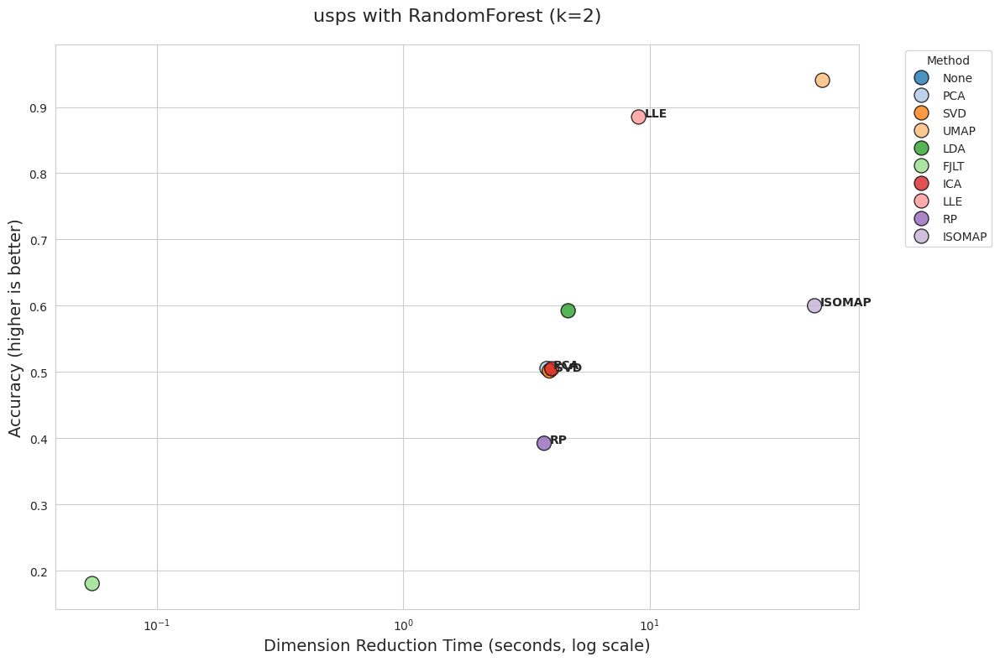

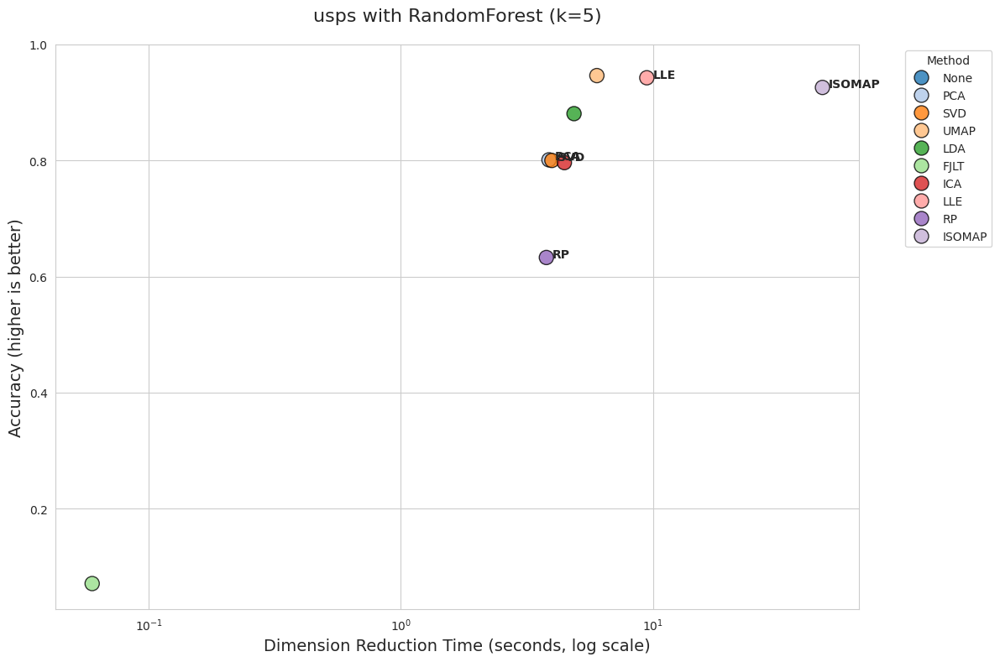

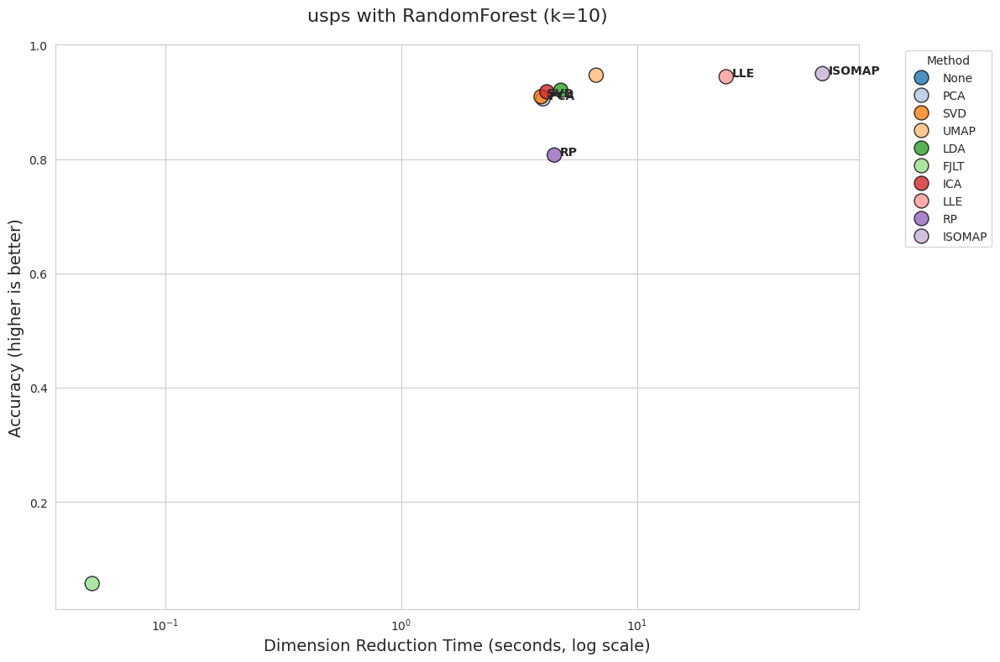

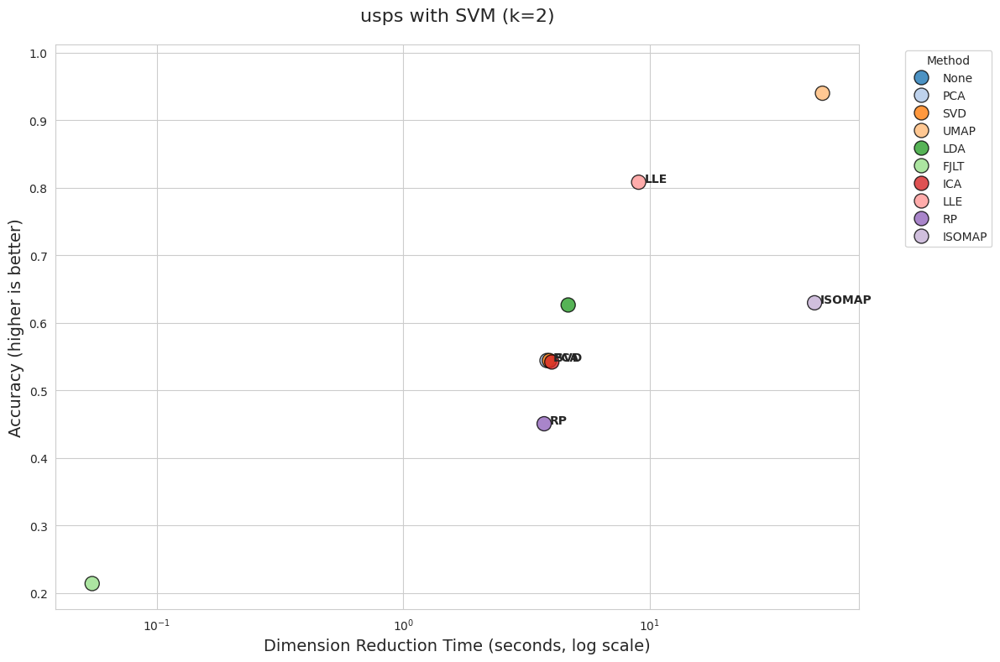

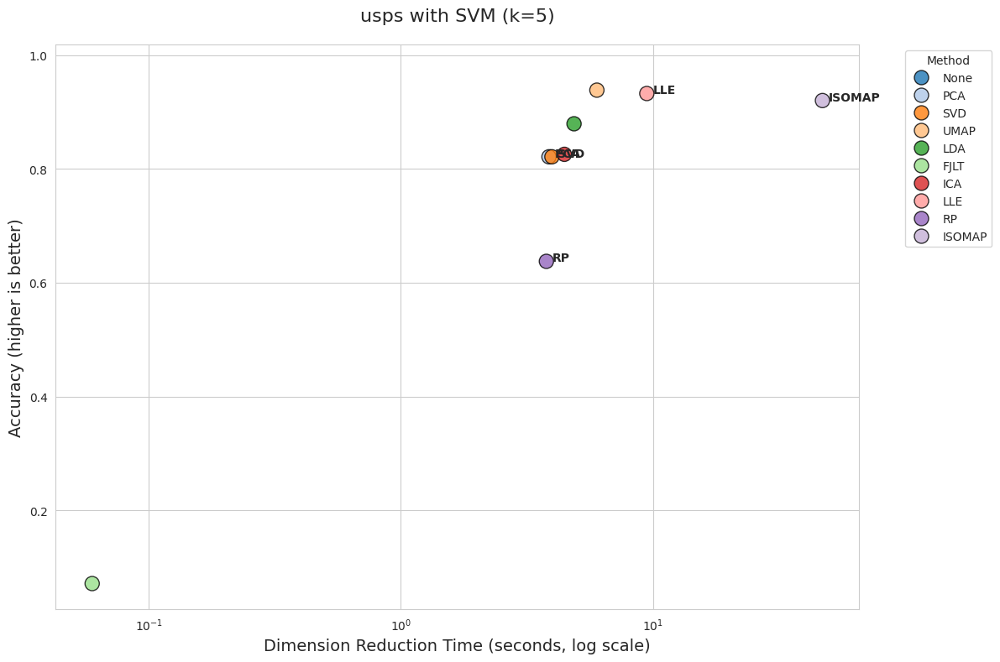

...

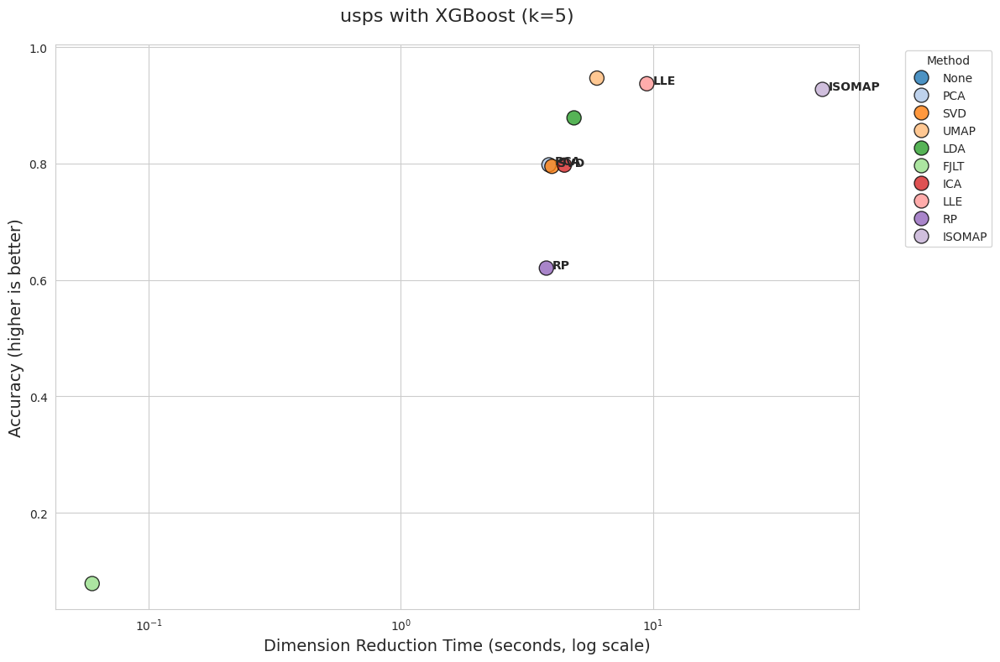

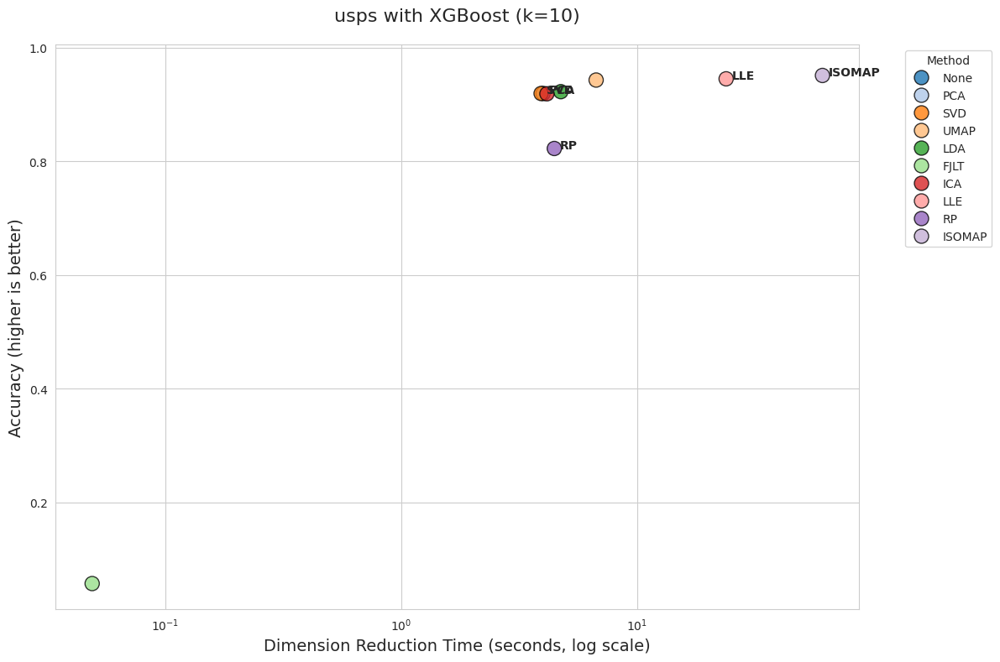

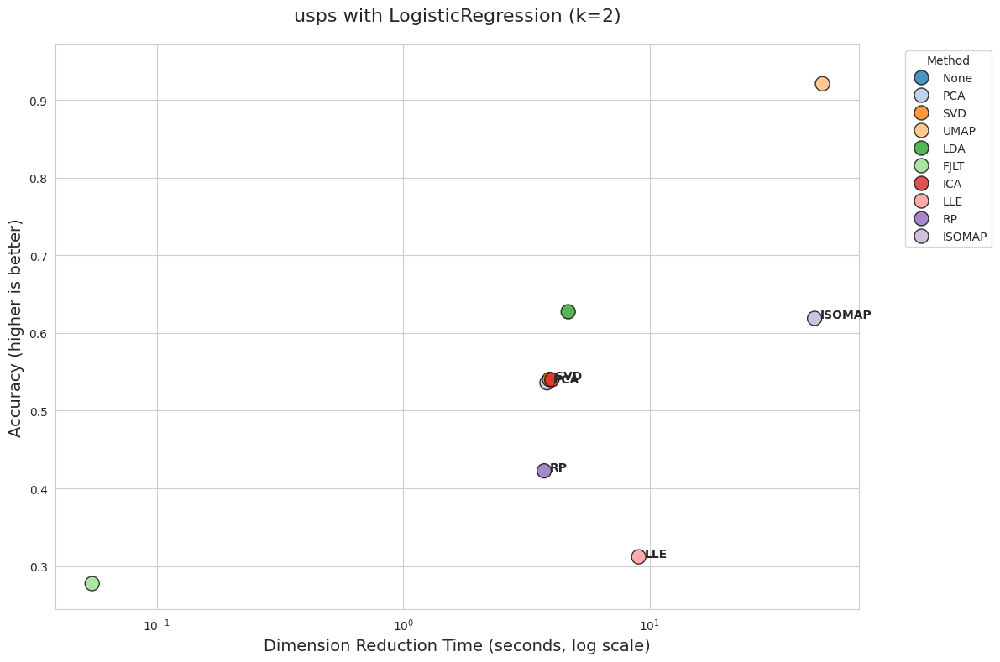

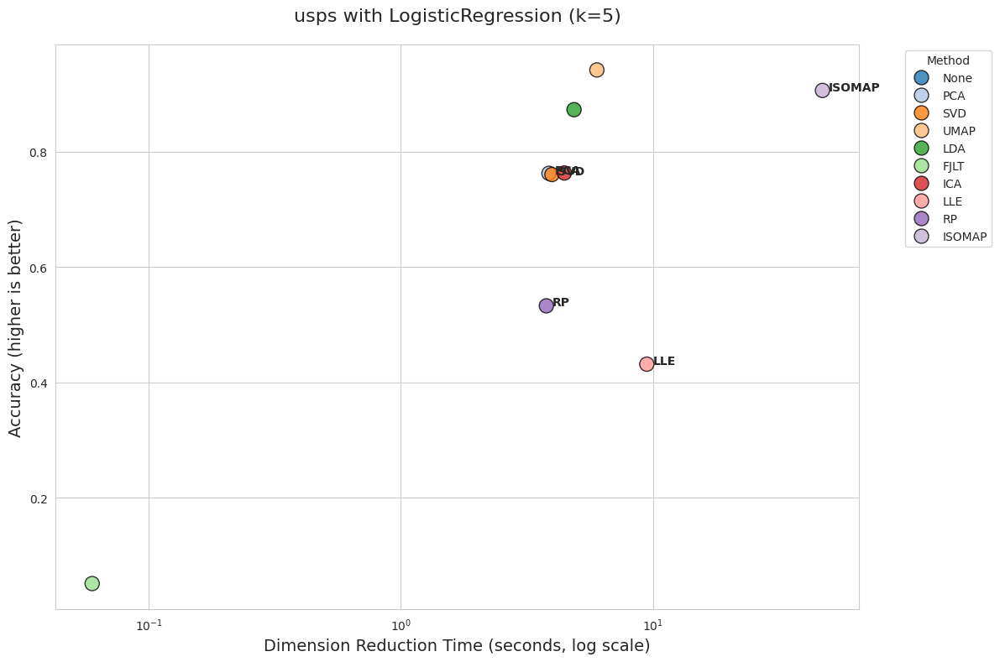

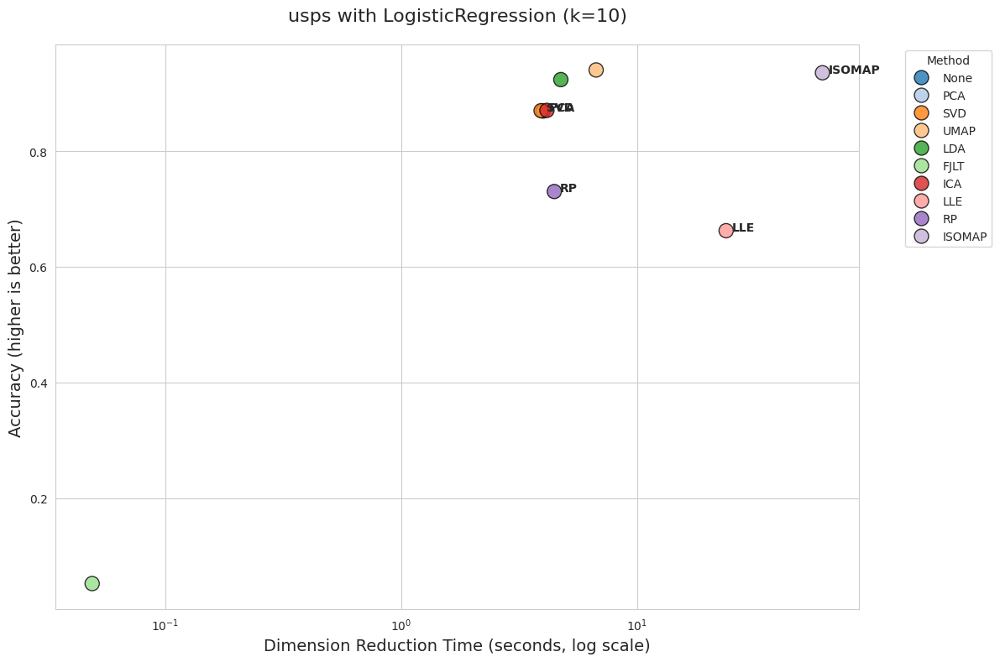

<Figure size 1400x1000 with 0 Axes>

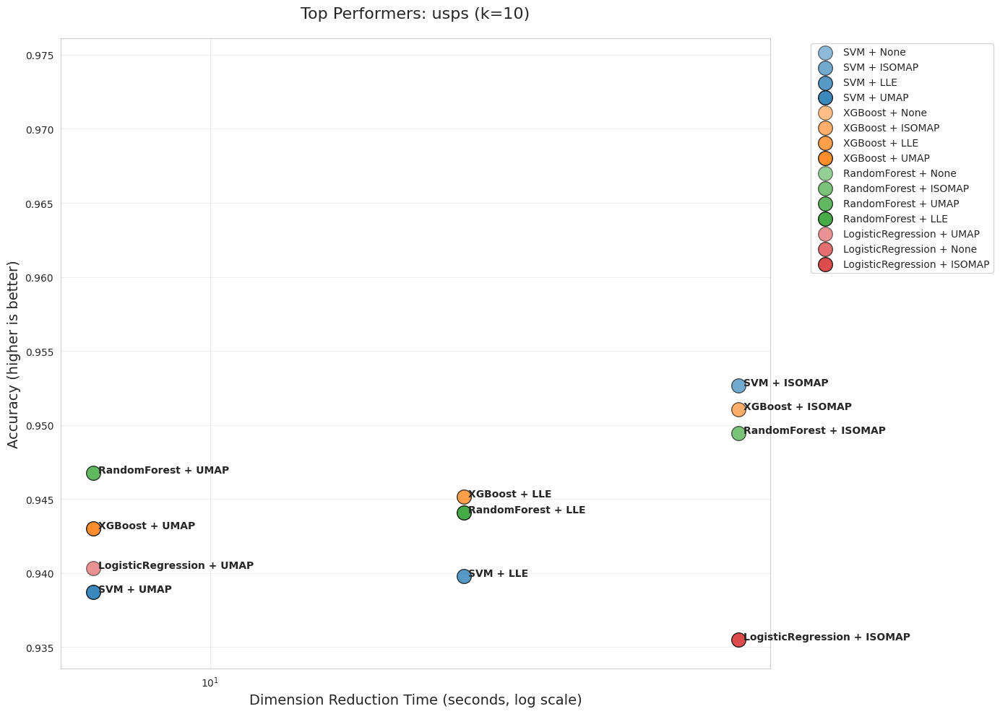

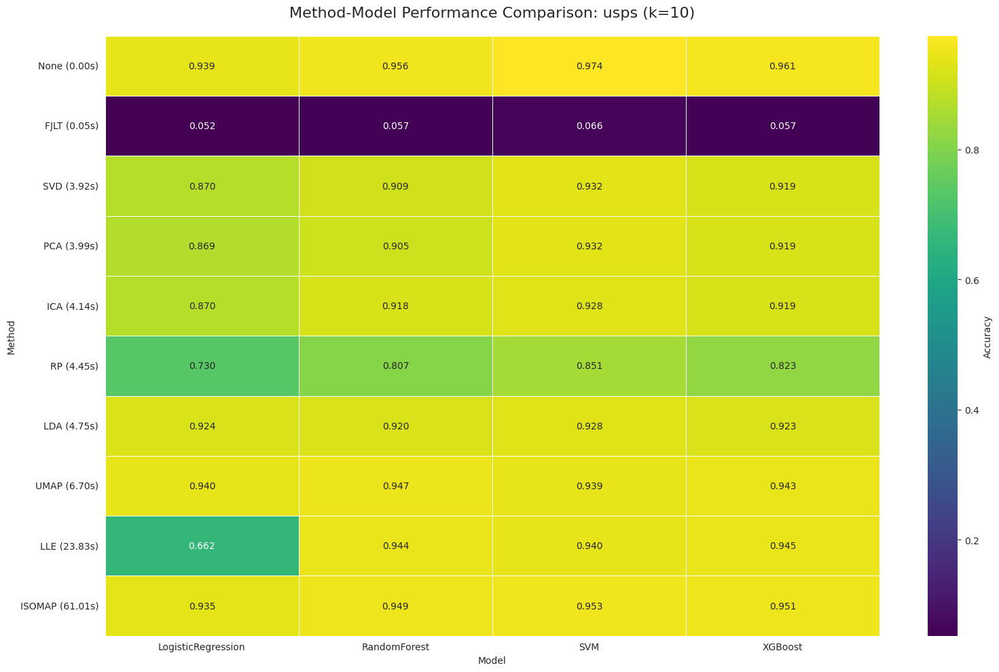

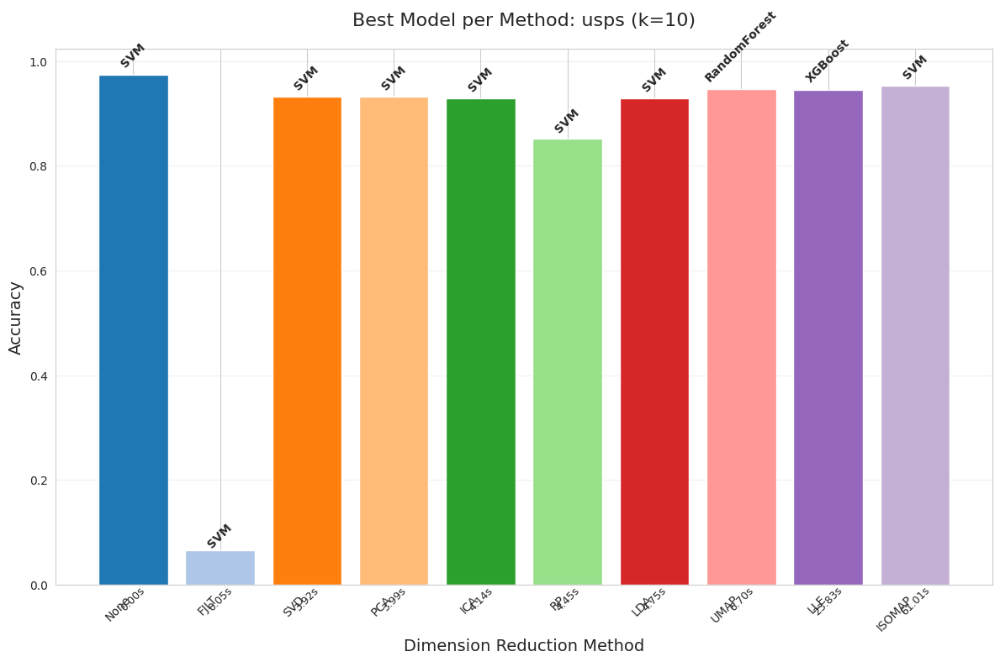

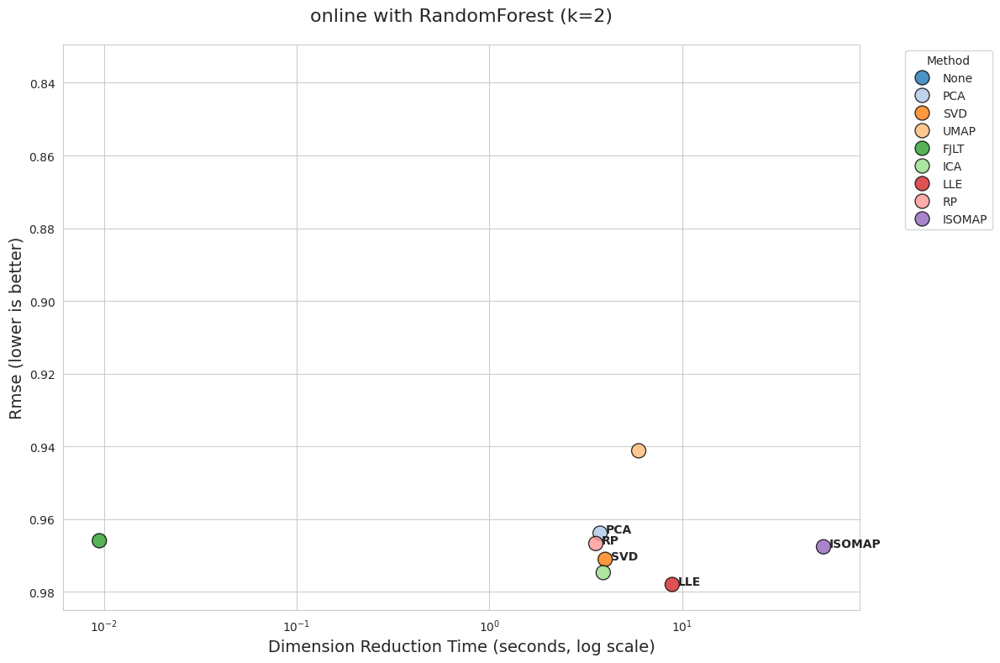

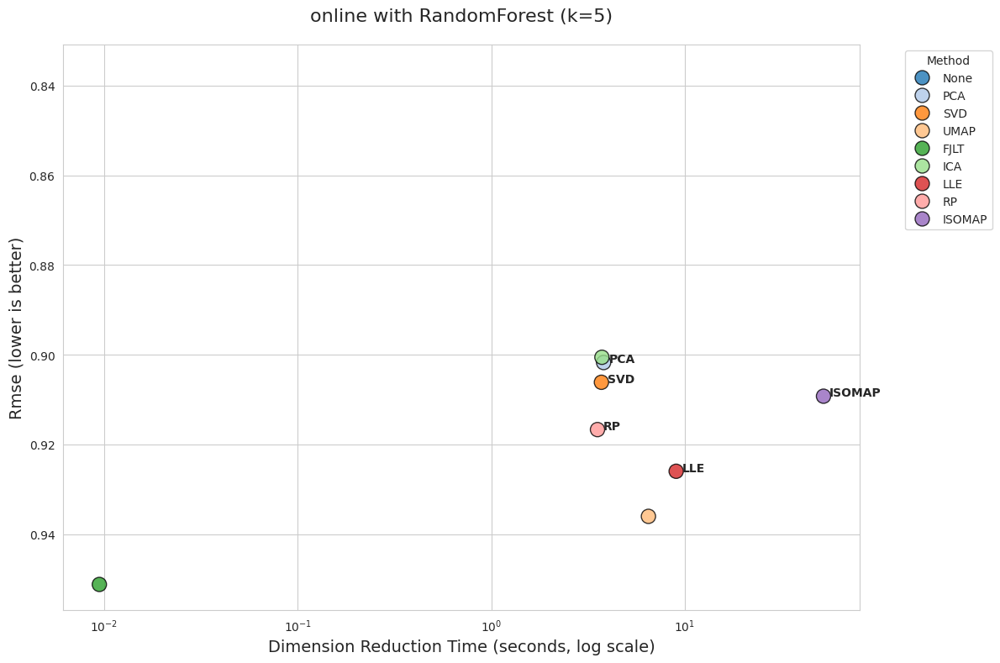

...

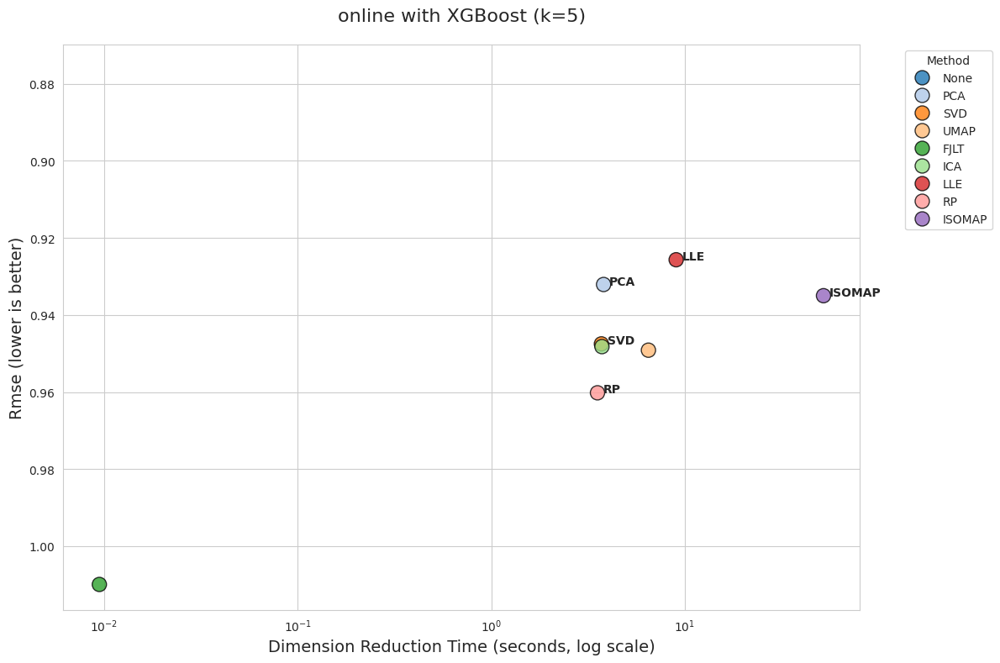

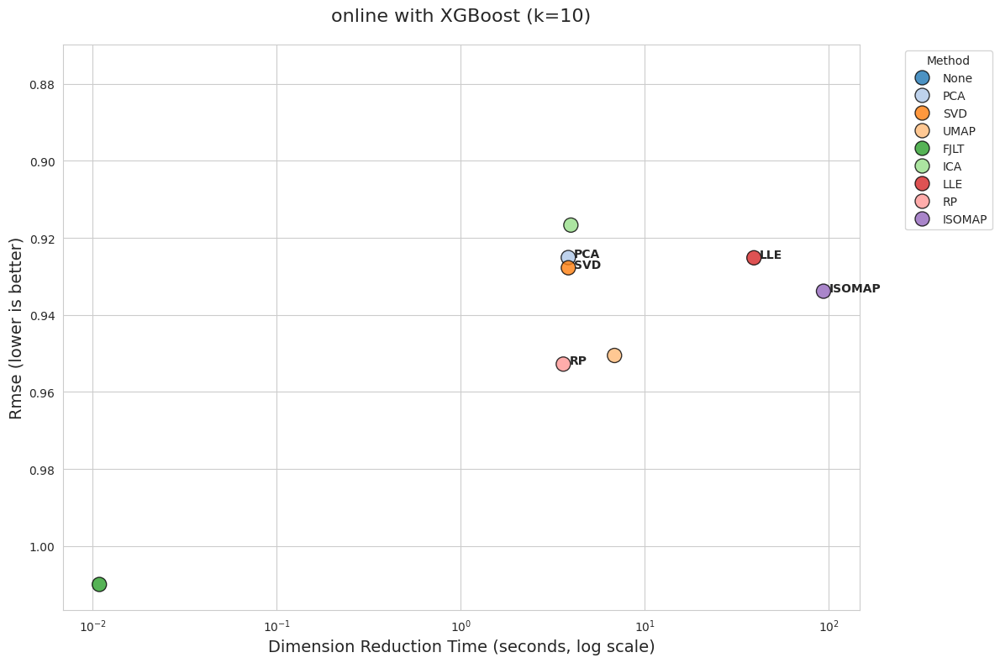

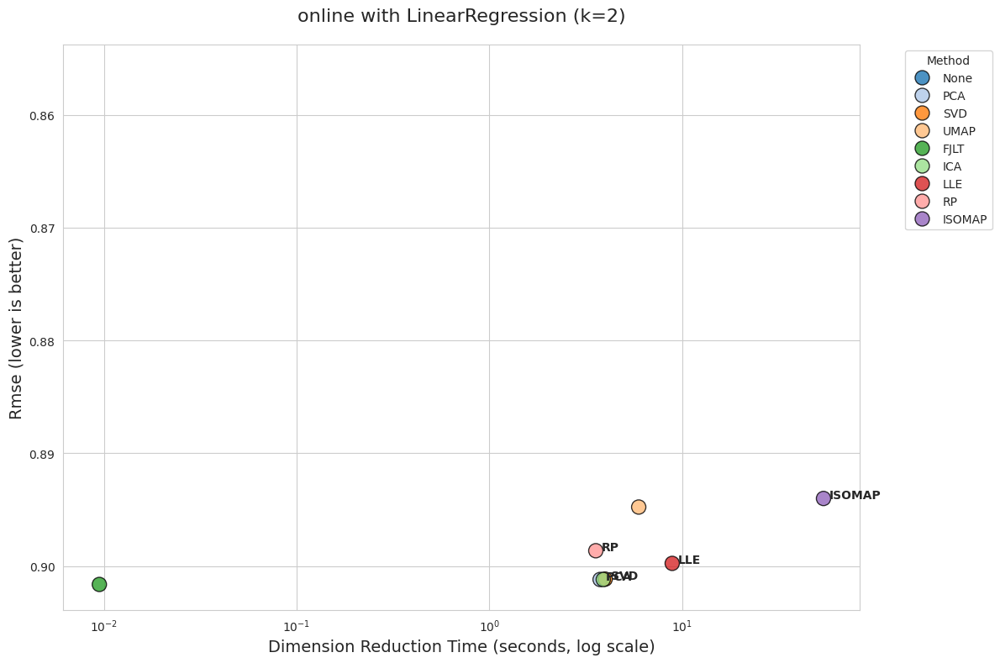

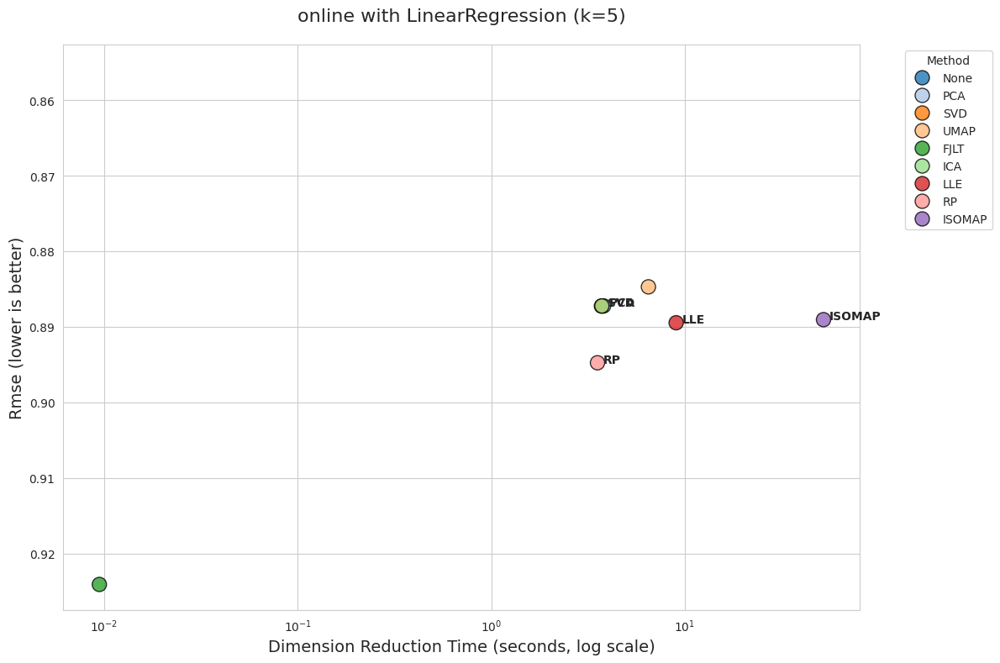

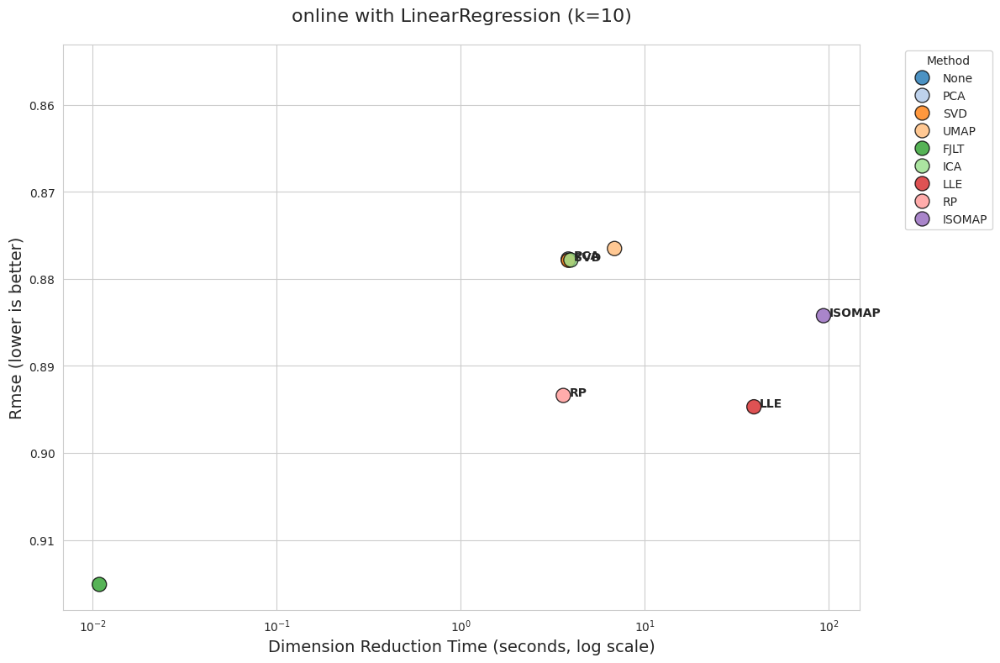

<Figure size 1400x1000 with 0 Axes>

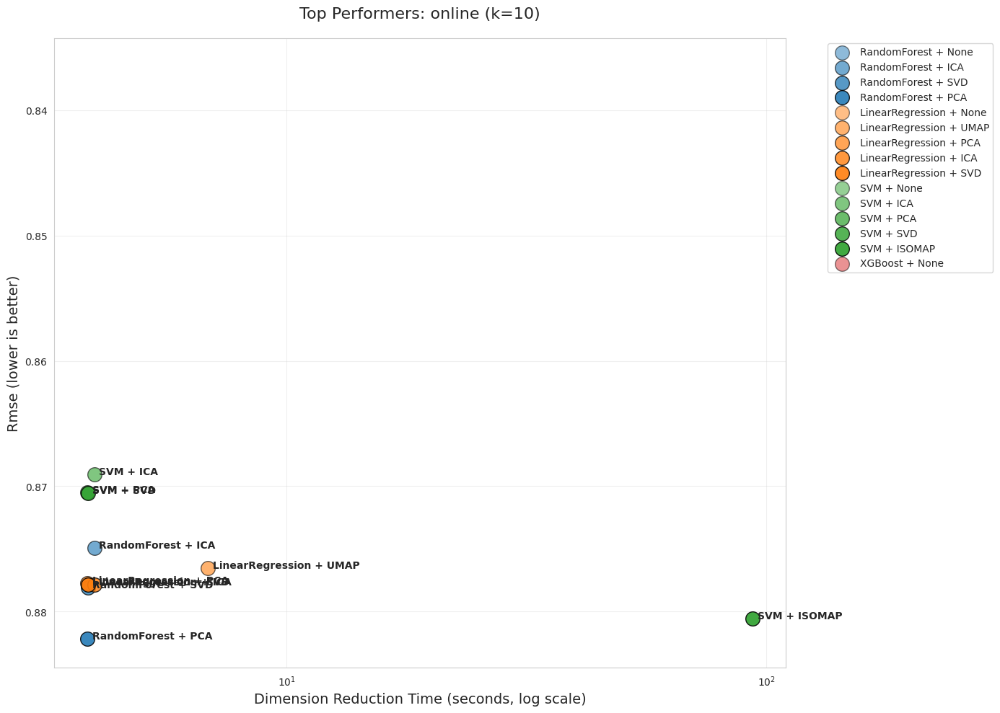

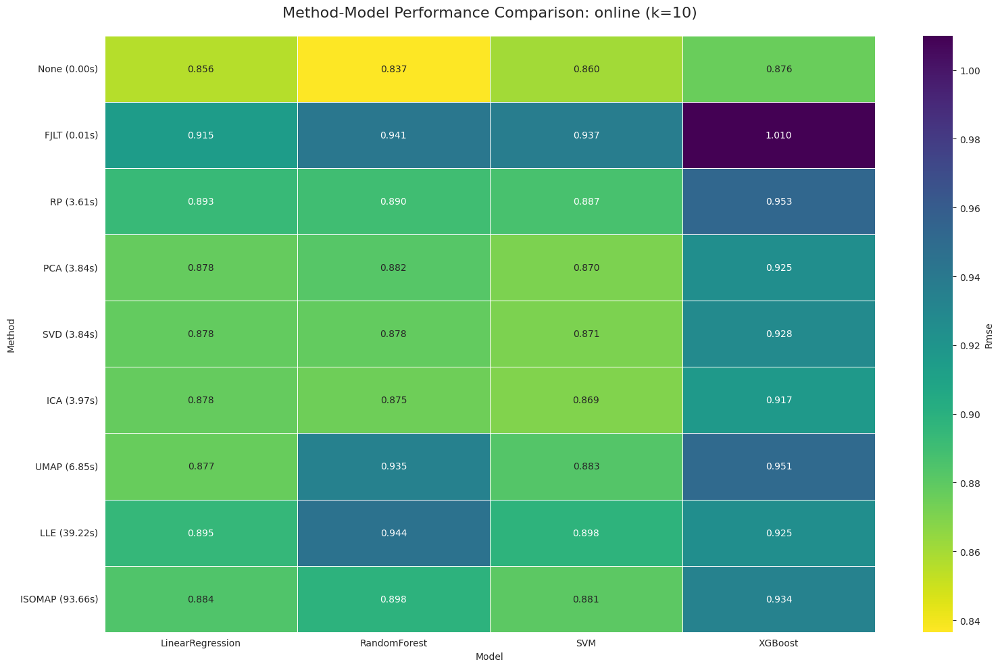

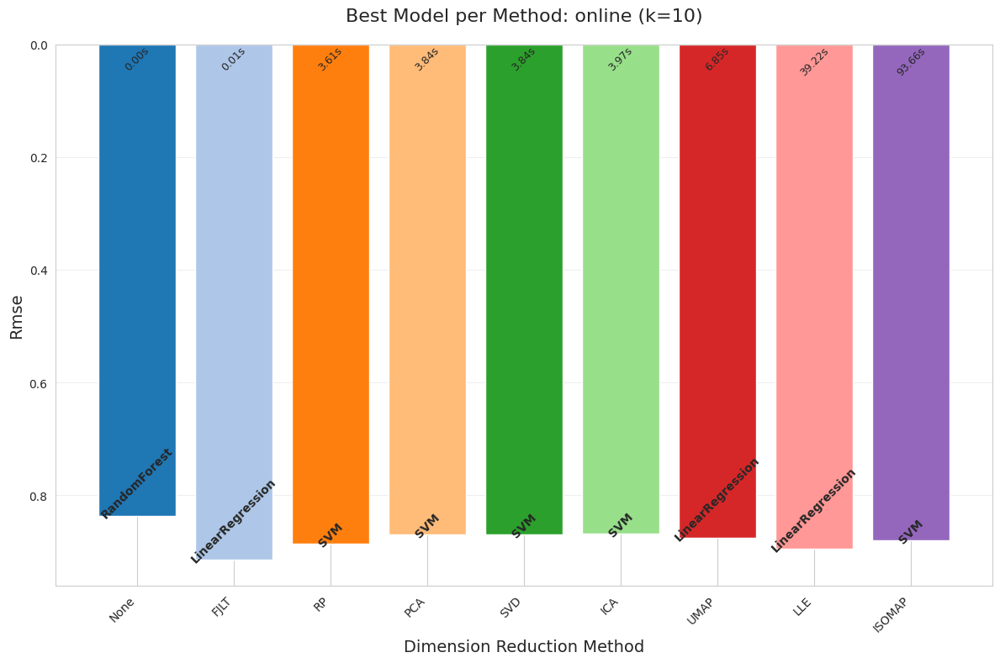

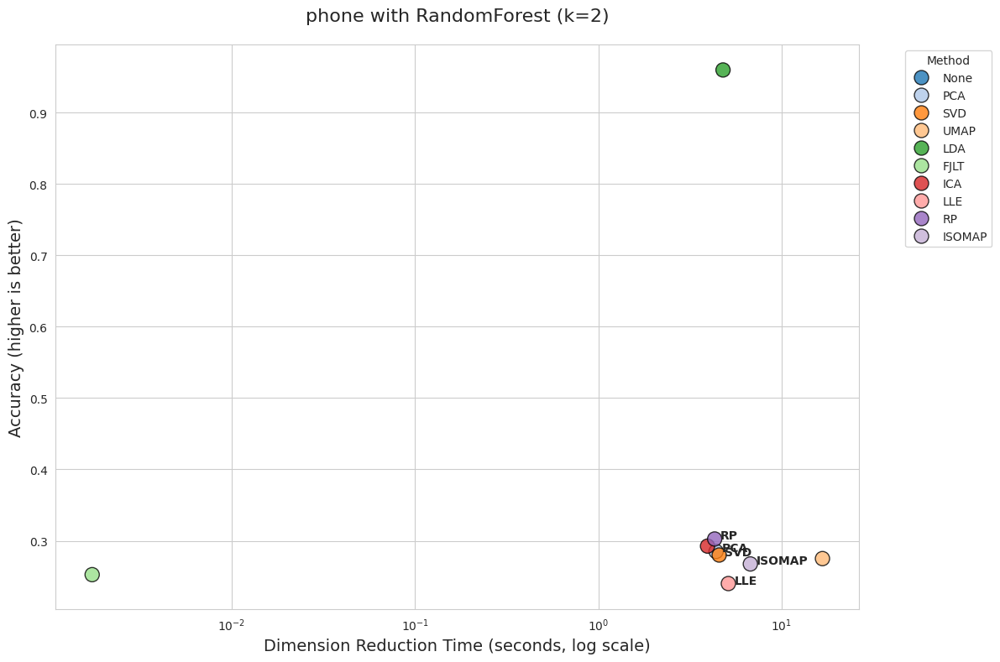

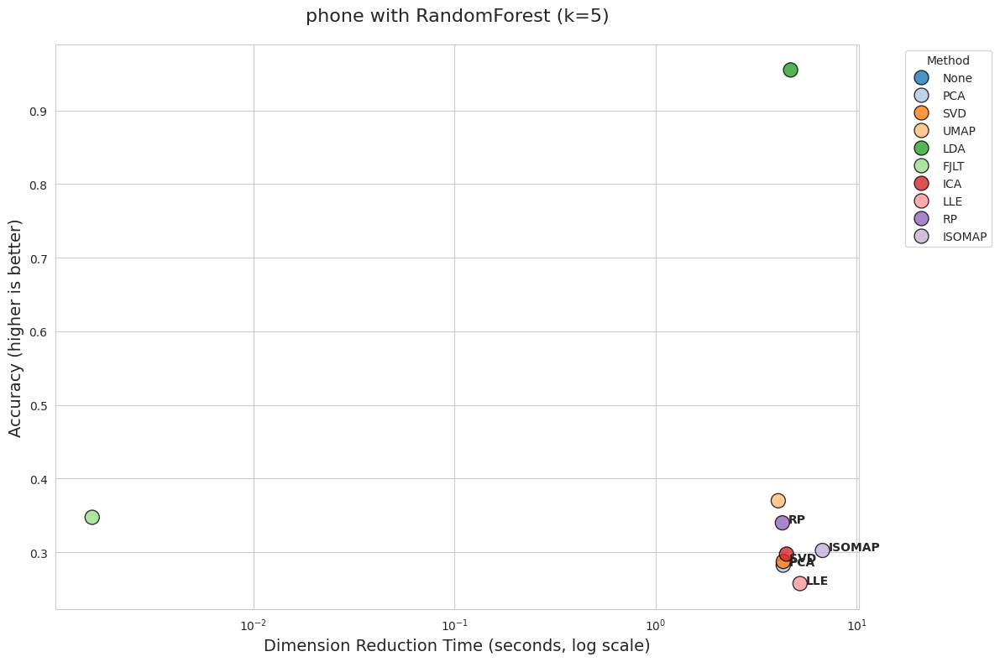

...

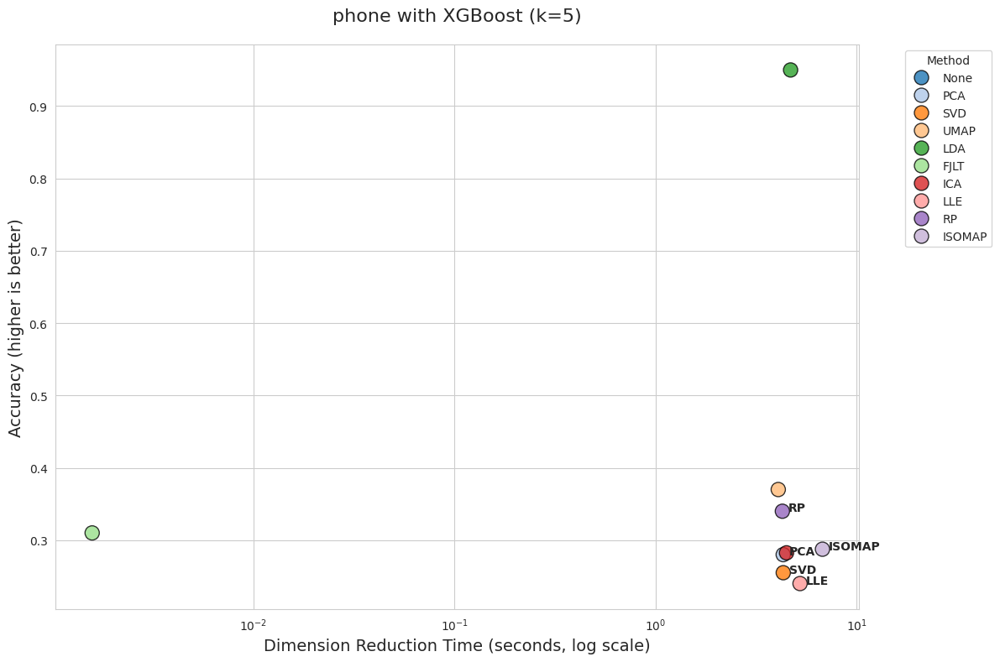

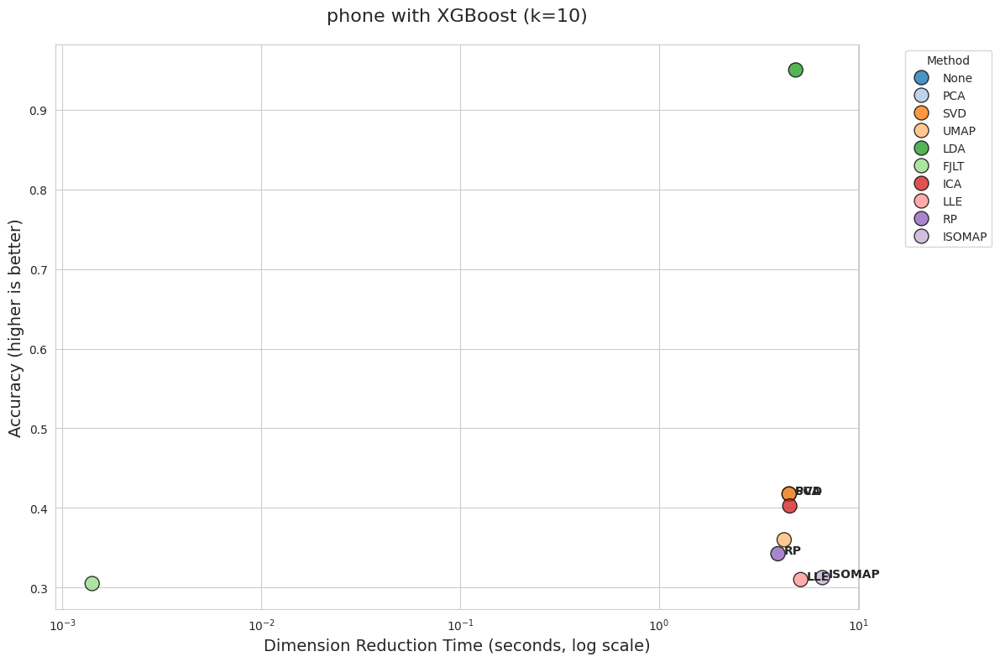

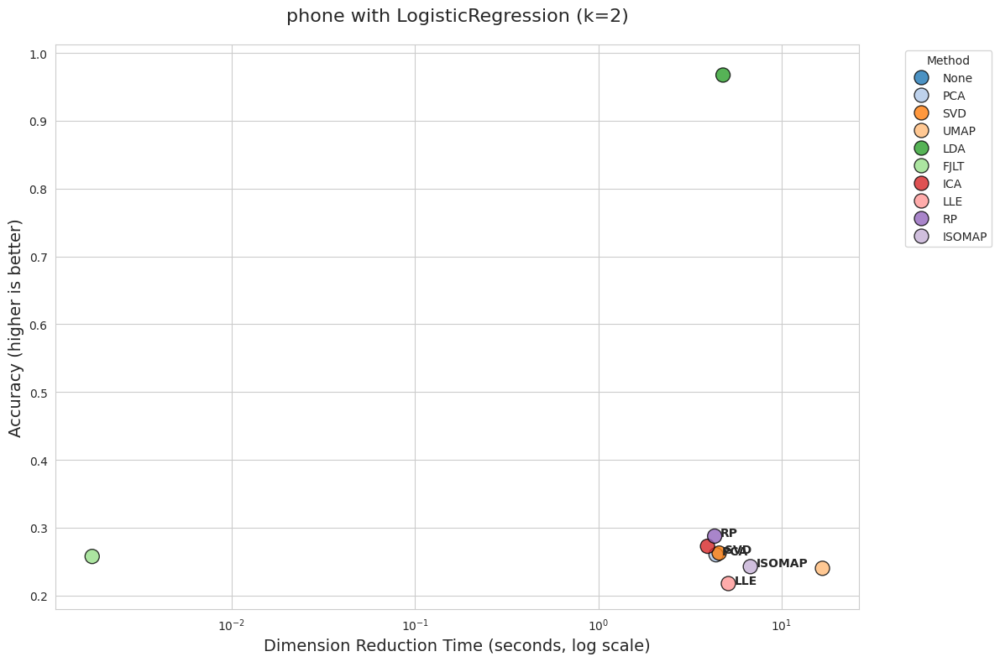

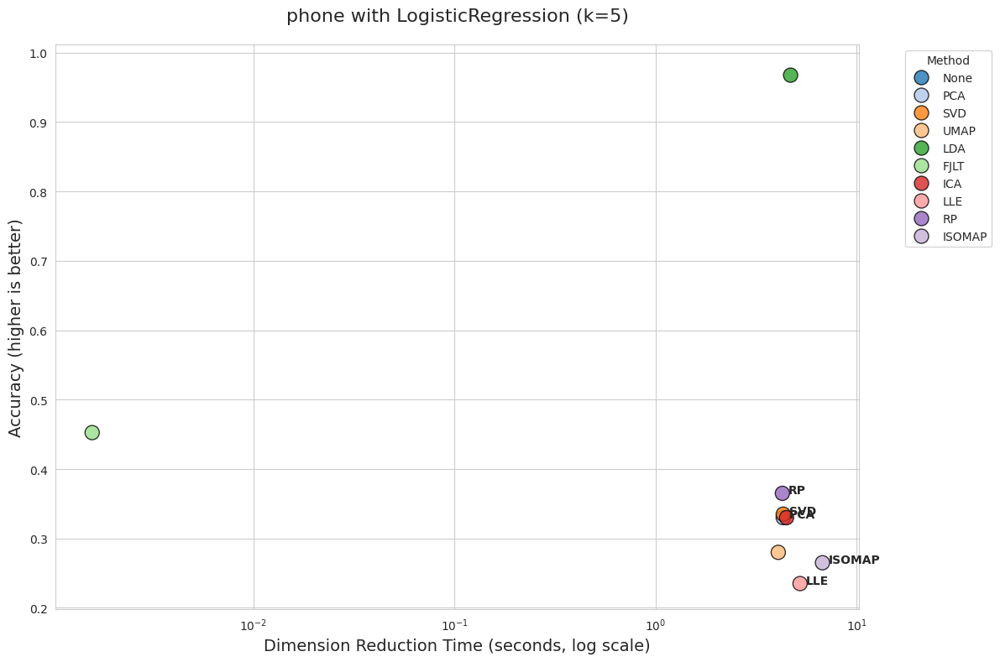

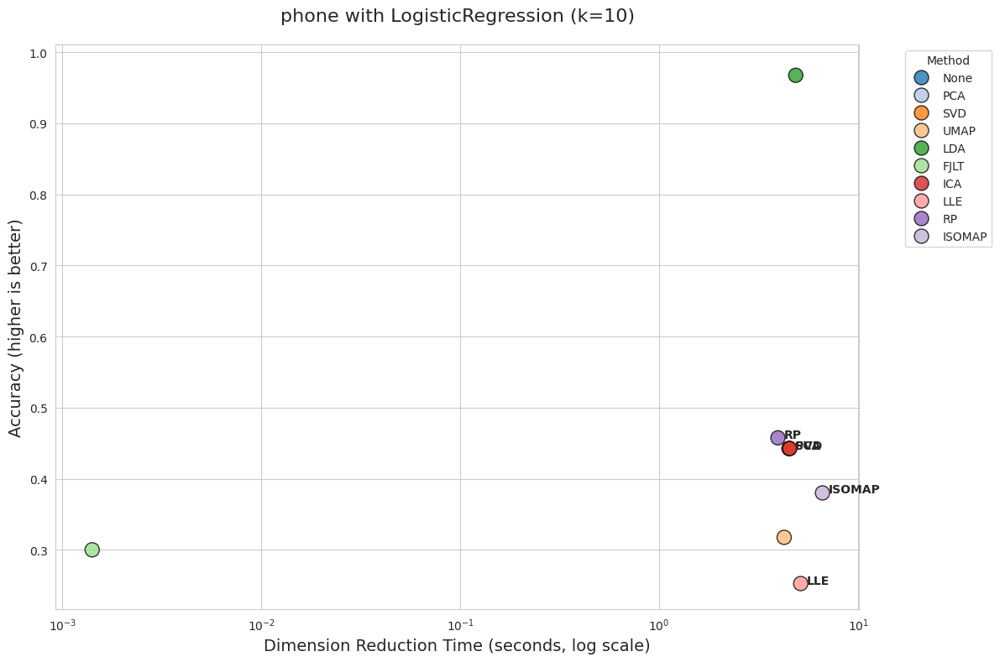

<Figure size 1400x1000 with 0 Axes>

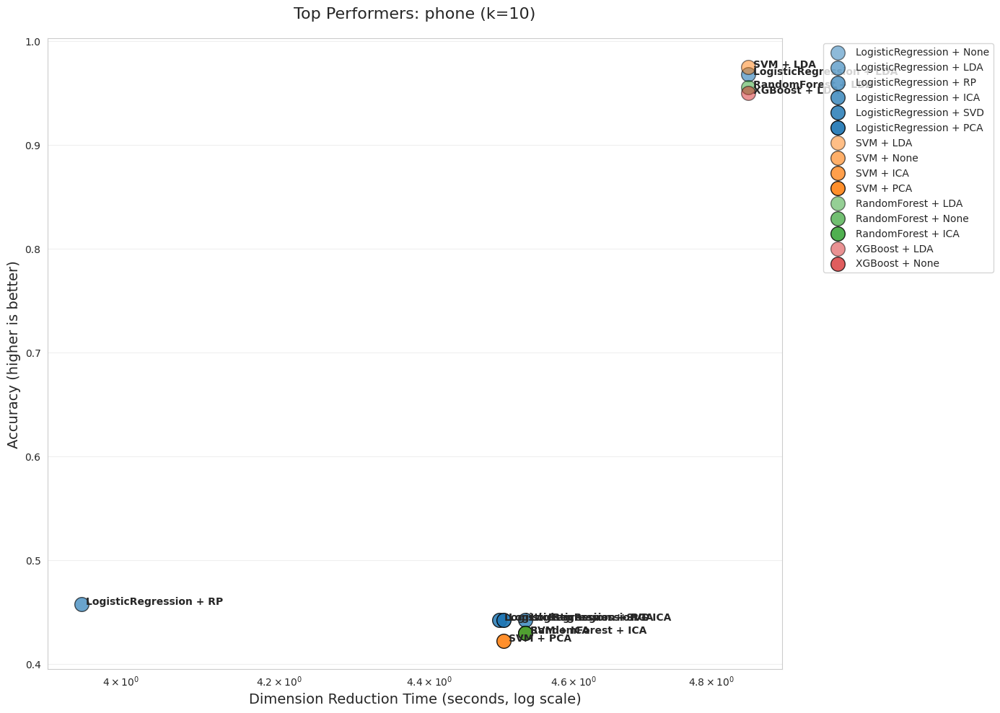

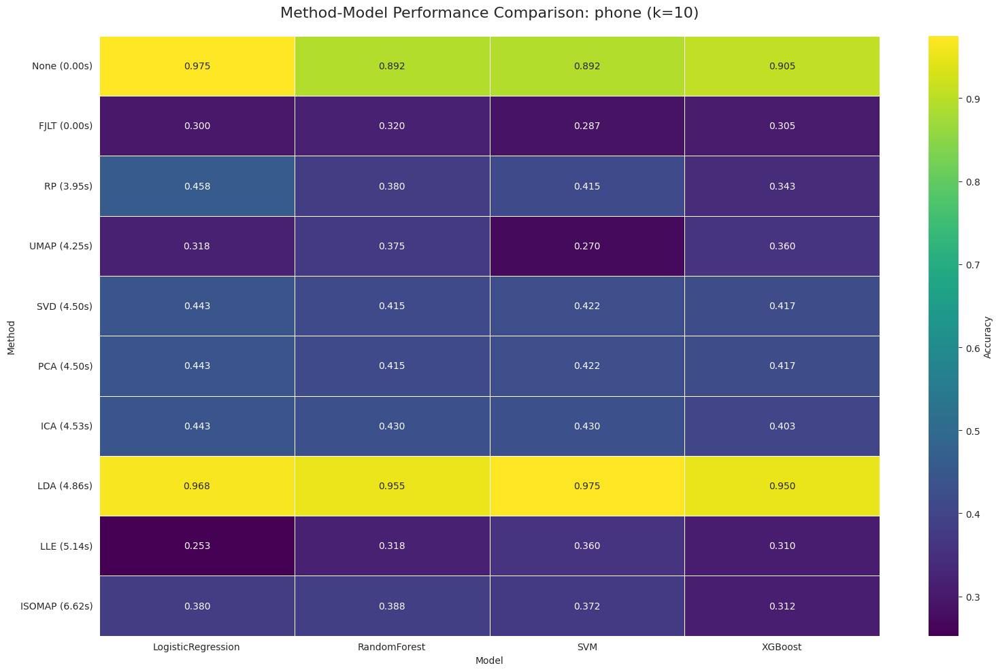

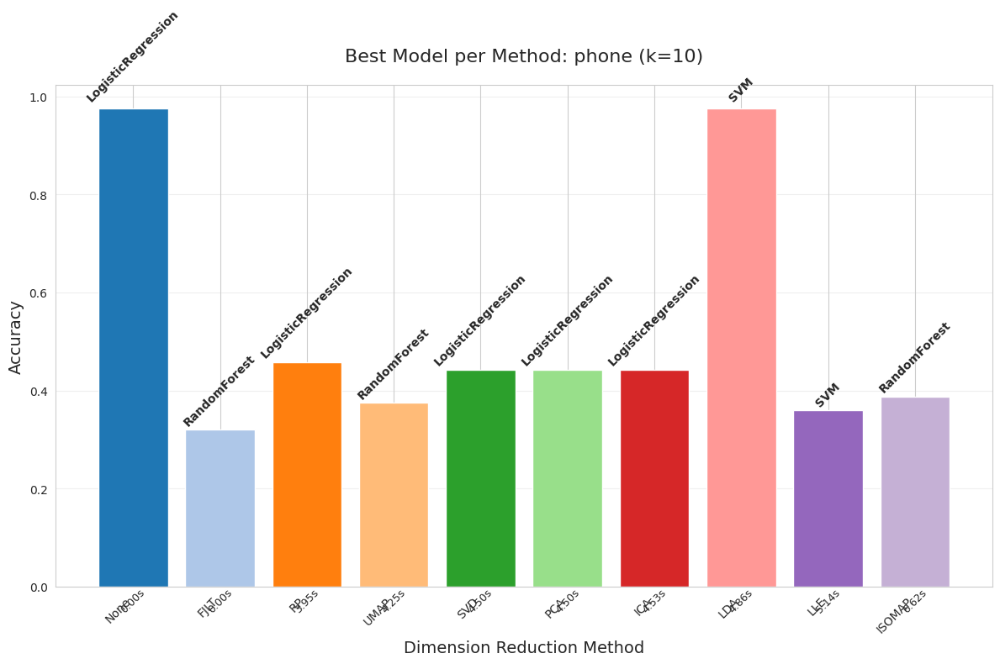

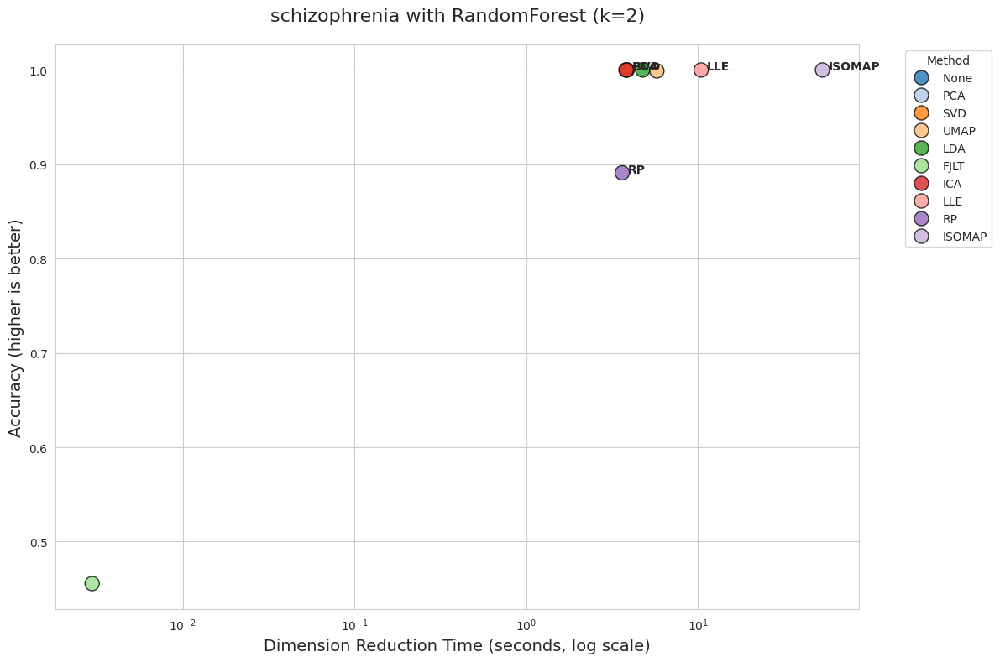

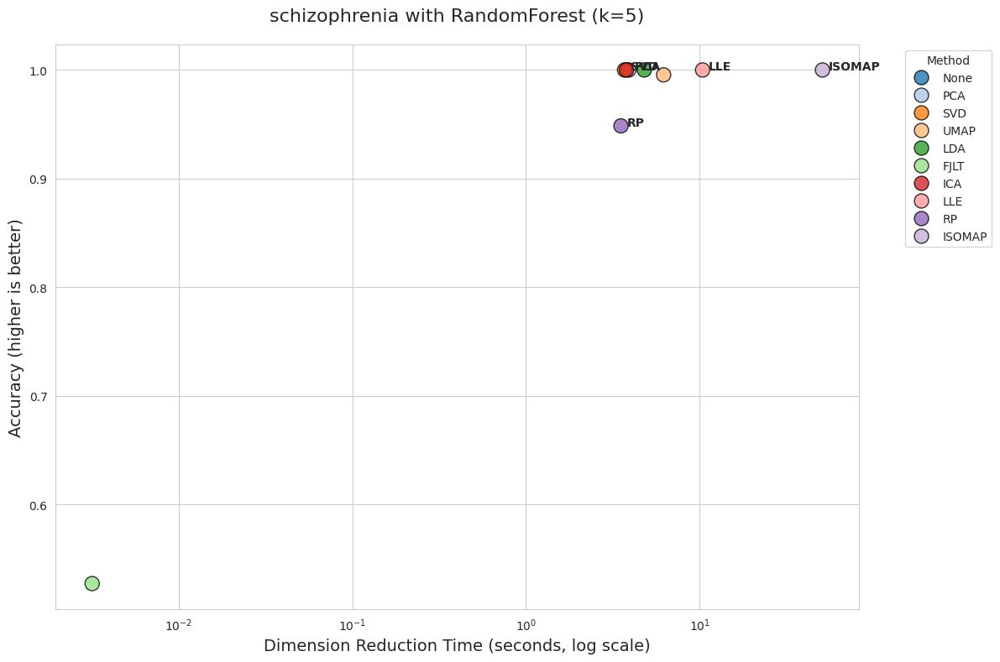

...

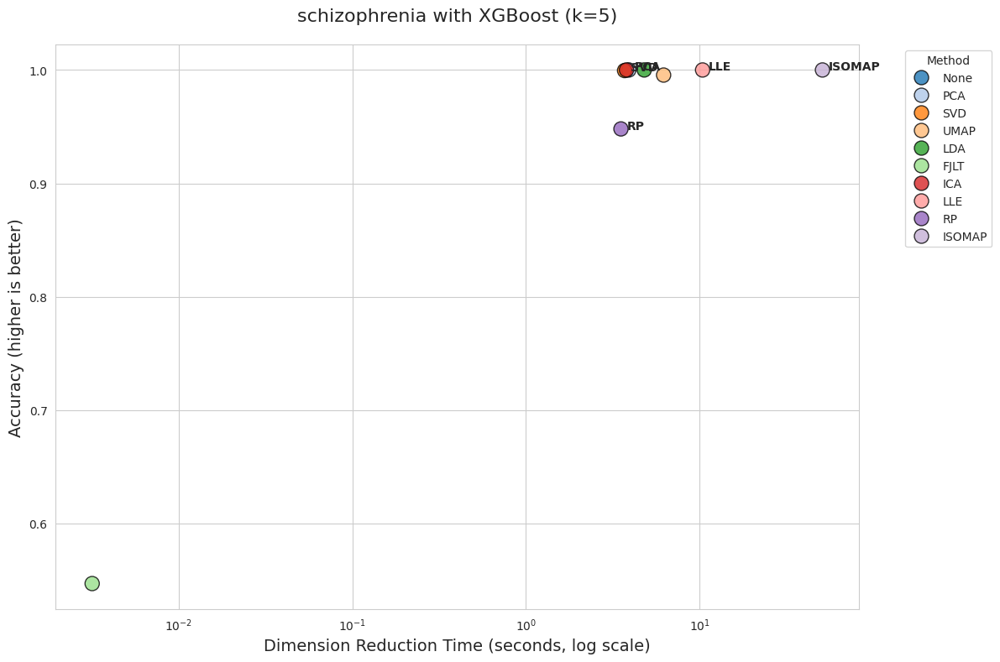

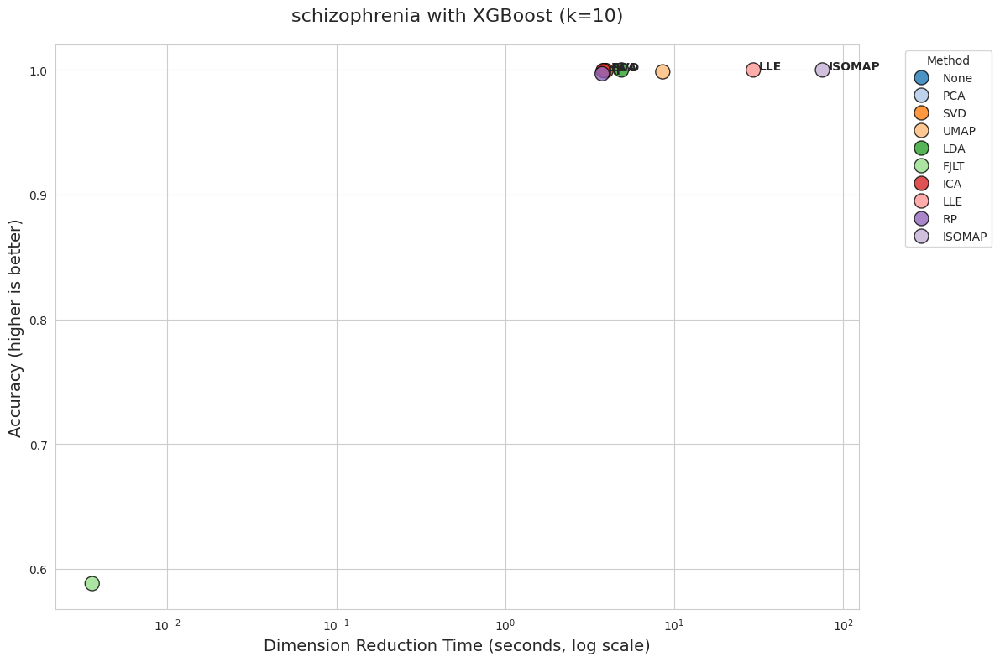

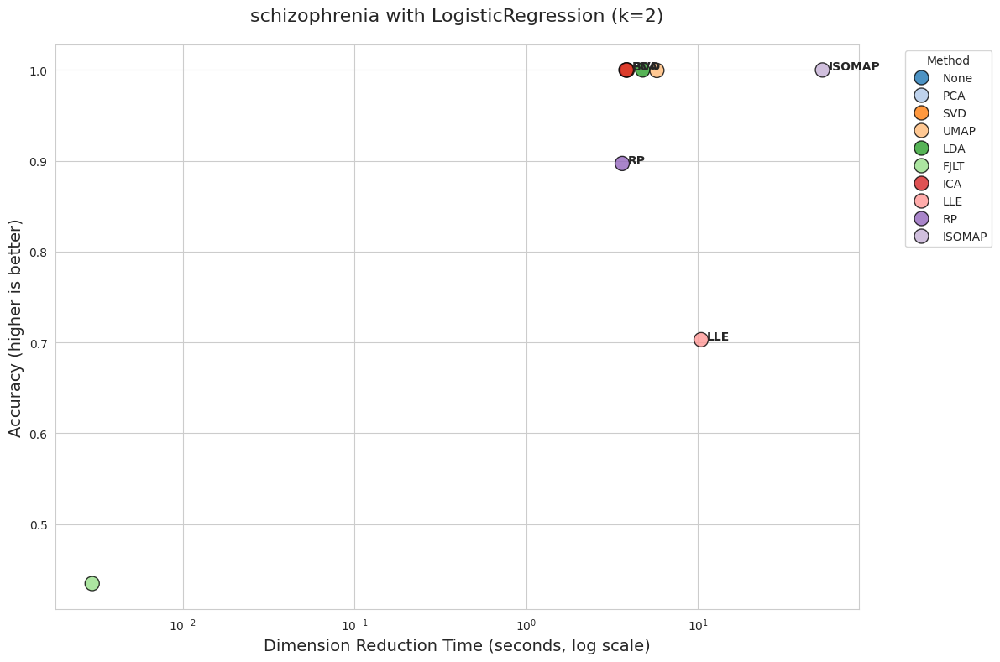

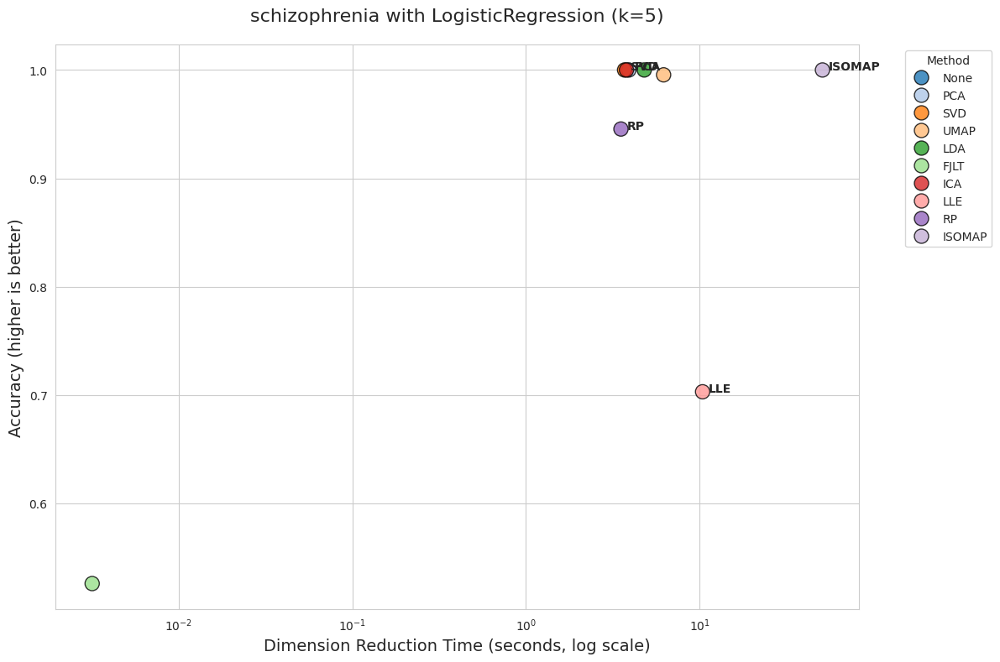

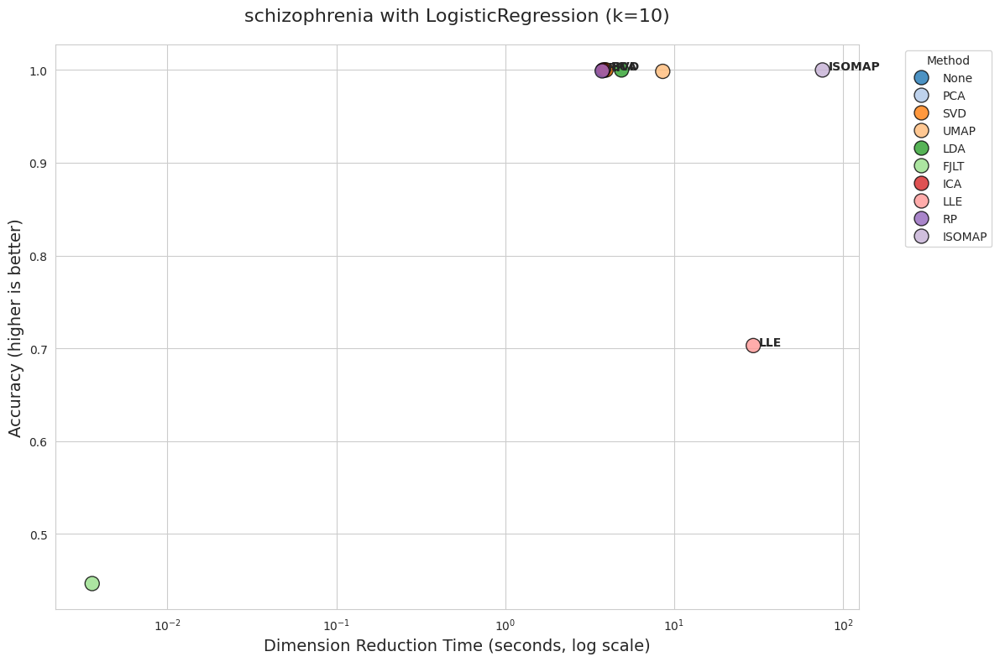

<Figure size 1400x1000 with 0 Axes>

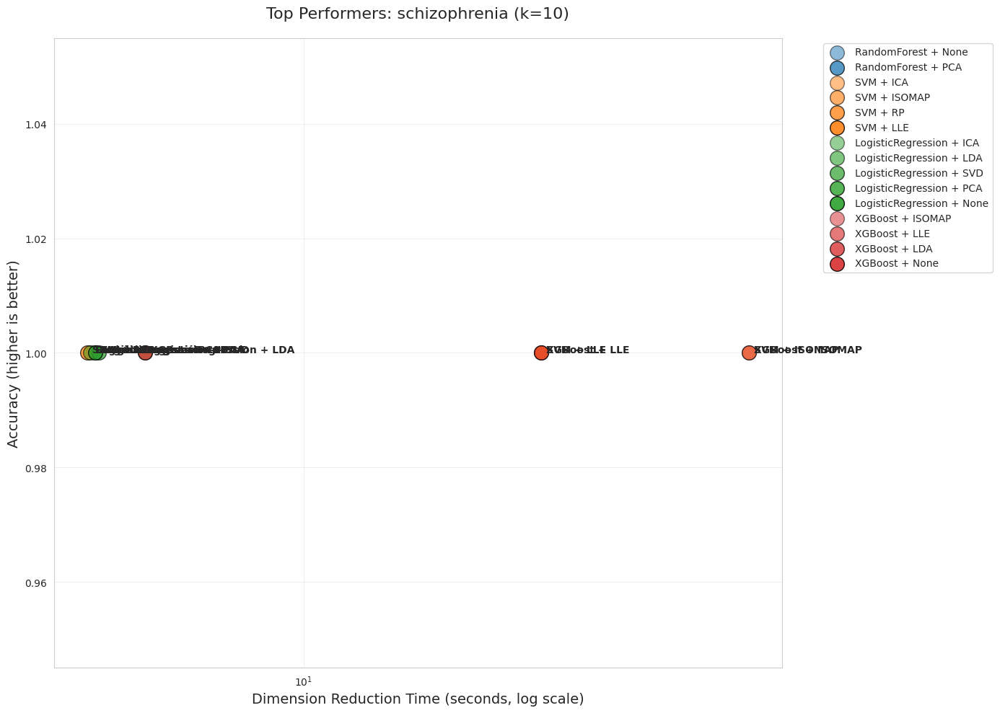

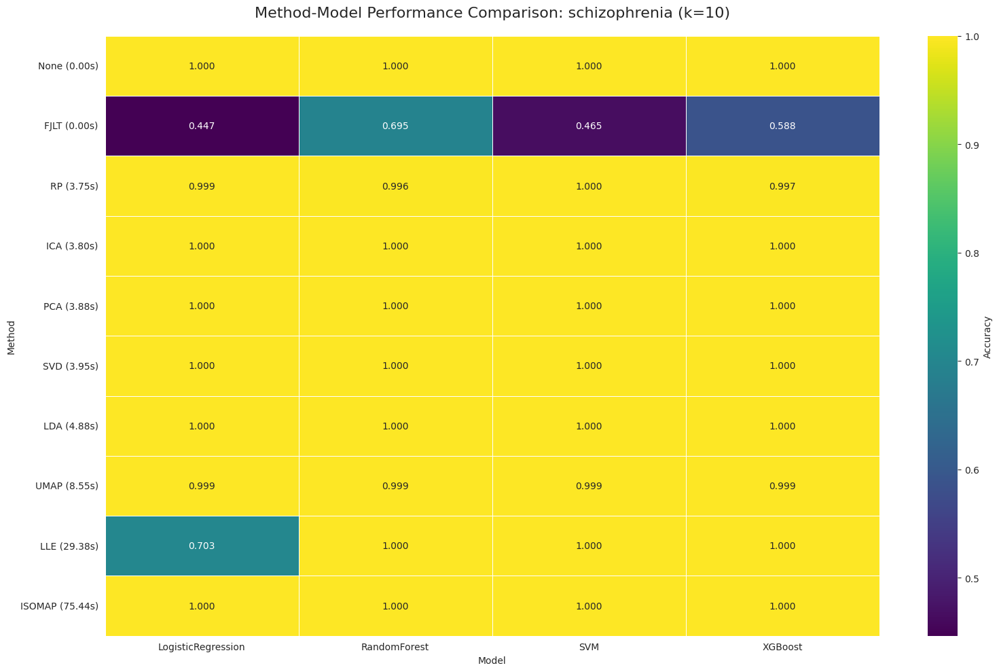

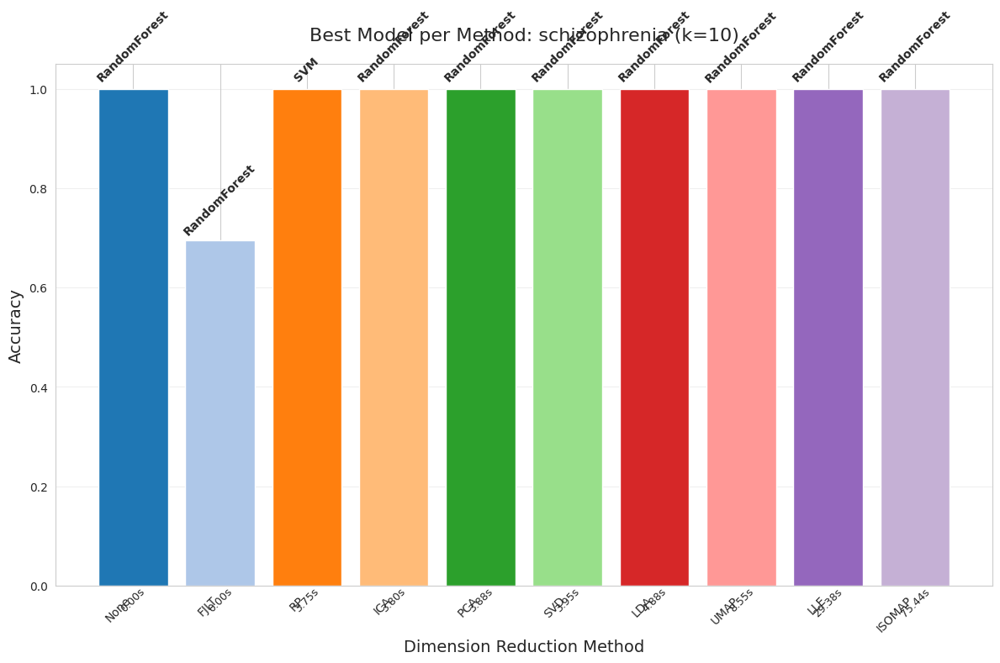

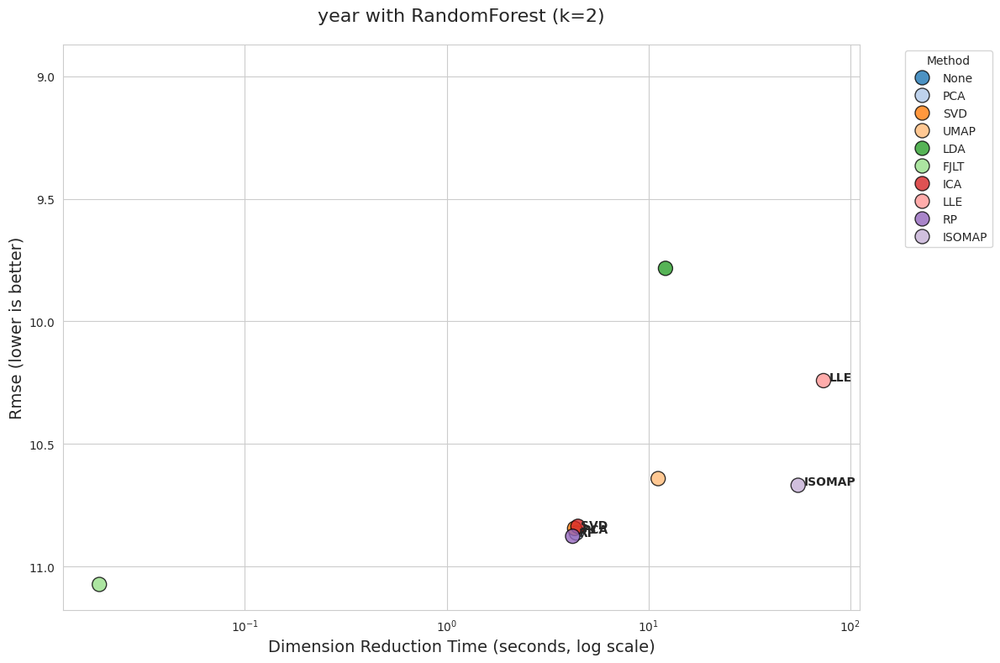

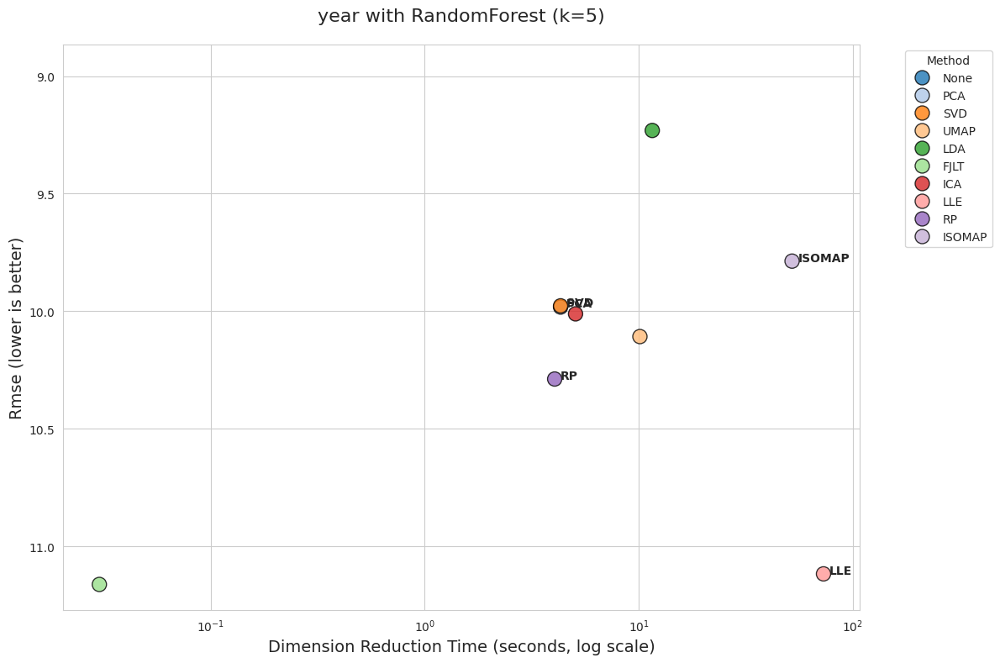

...

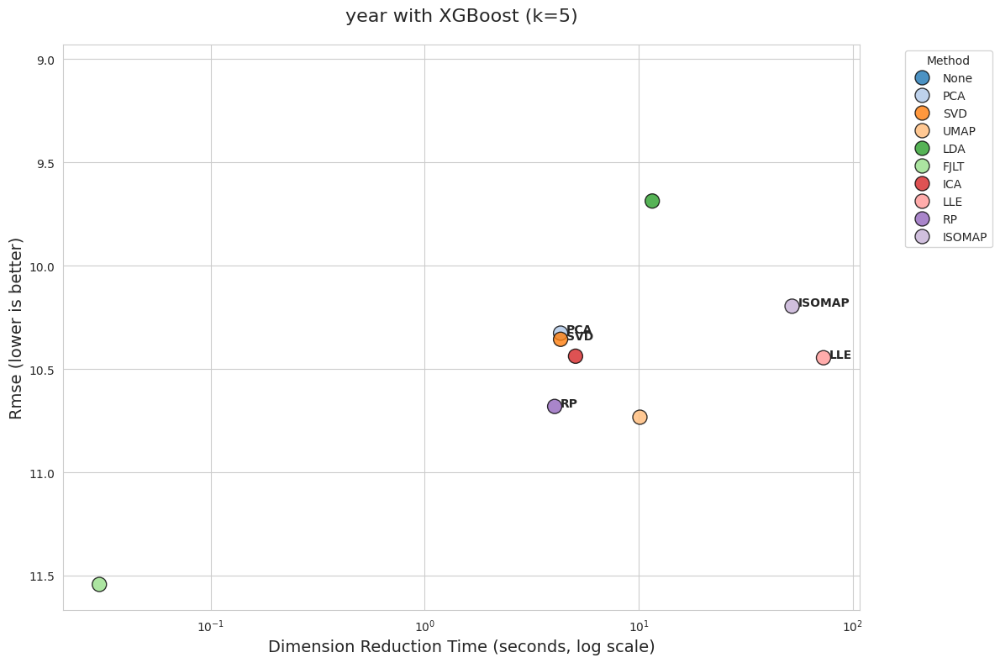

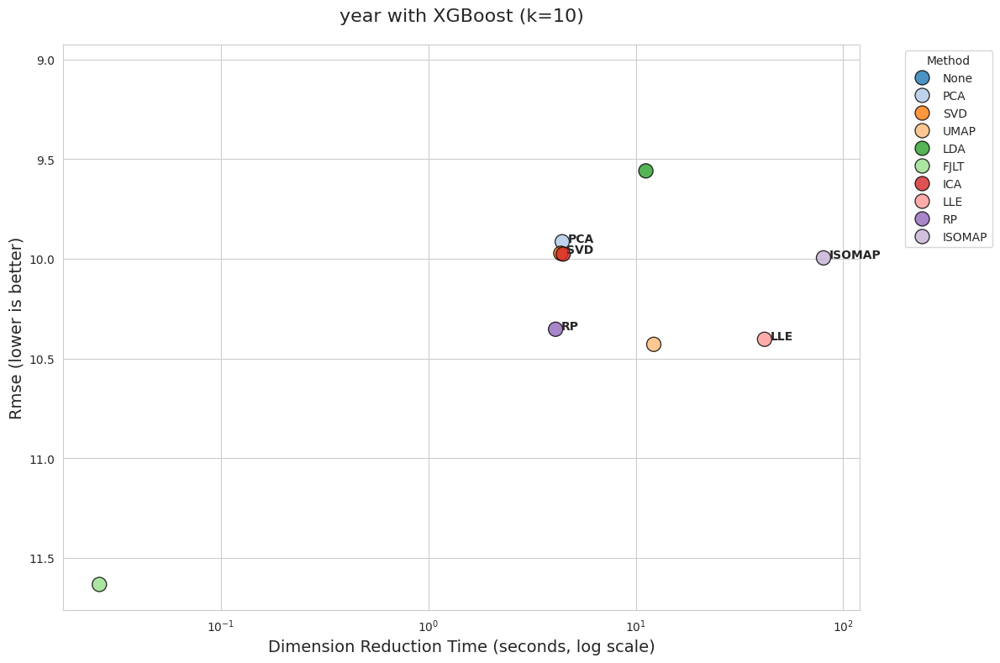

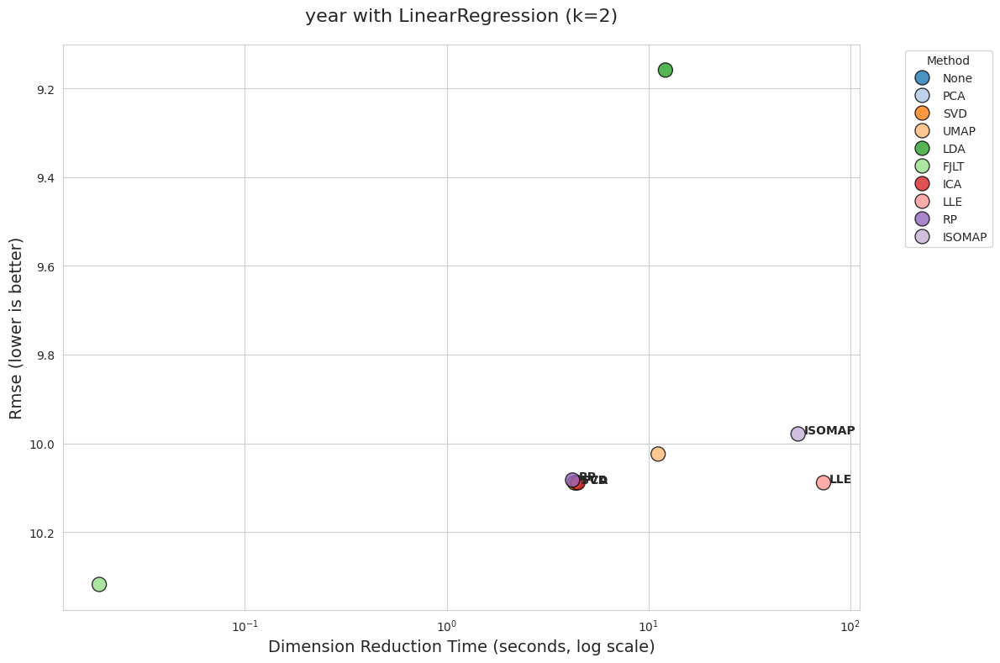

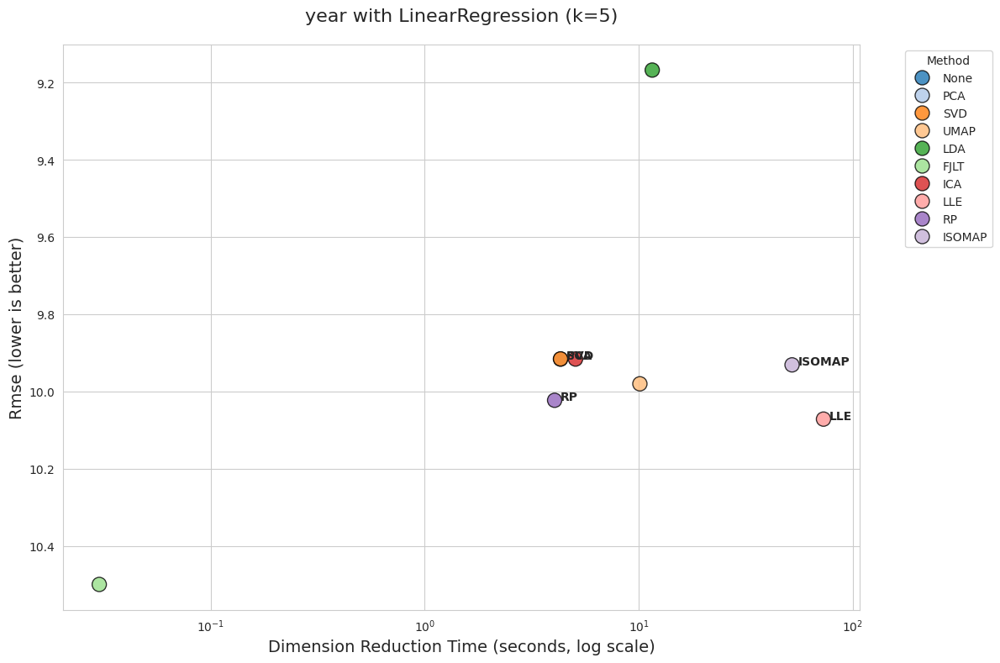

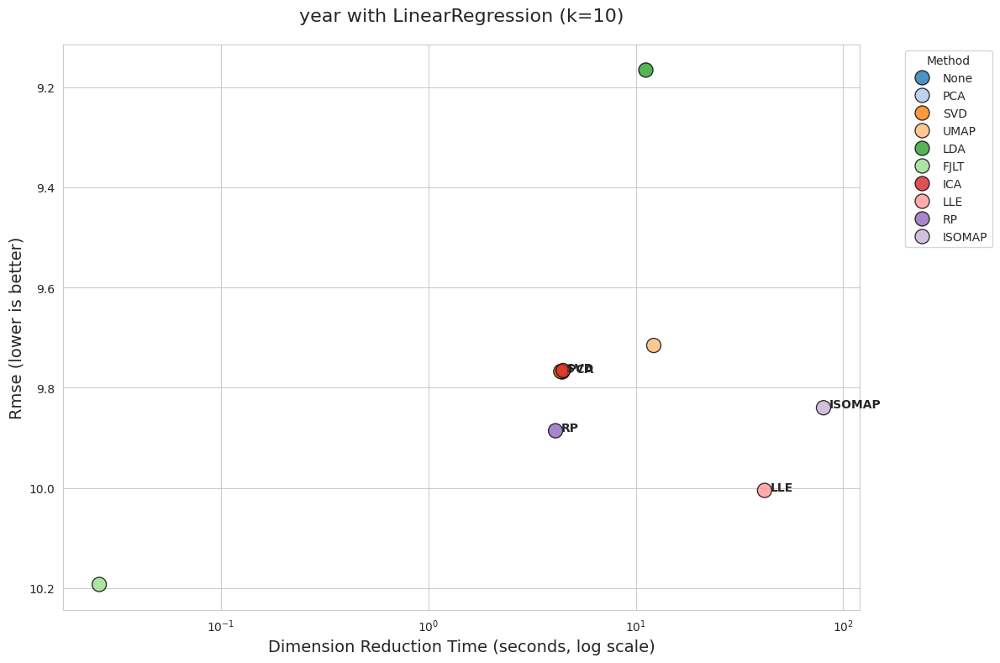

<Figure size 1400x1000 with 0 Axes>

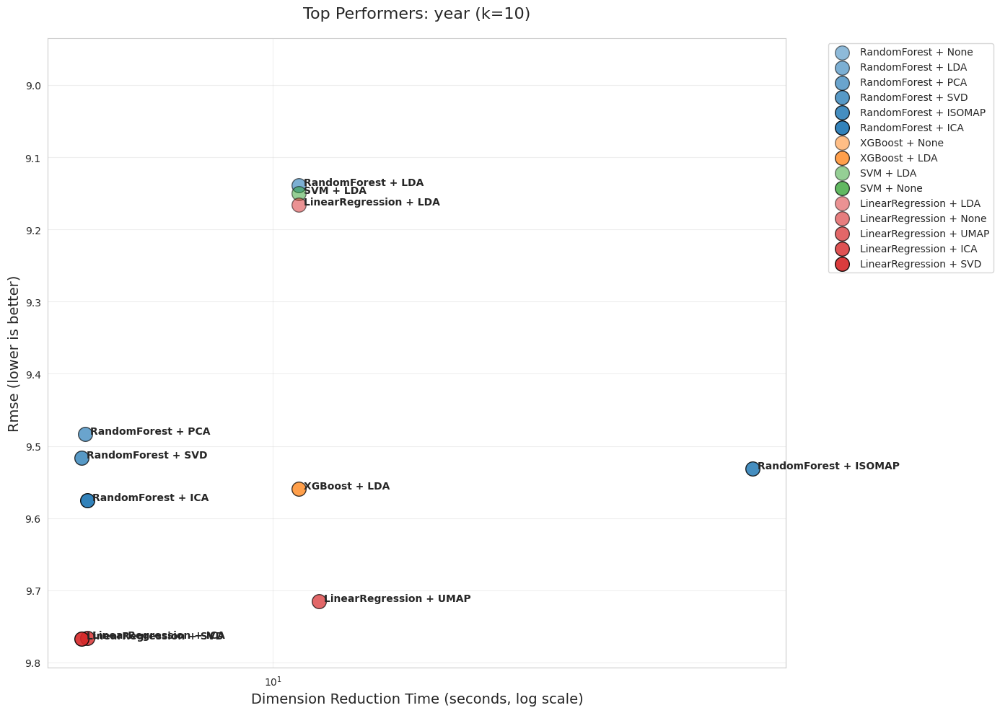

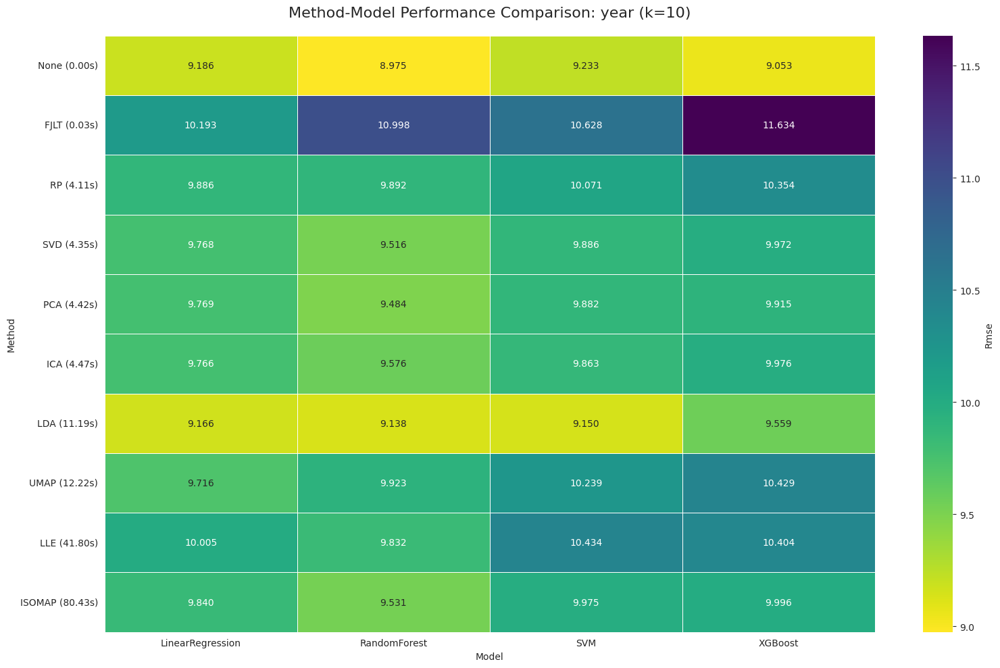

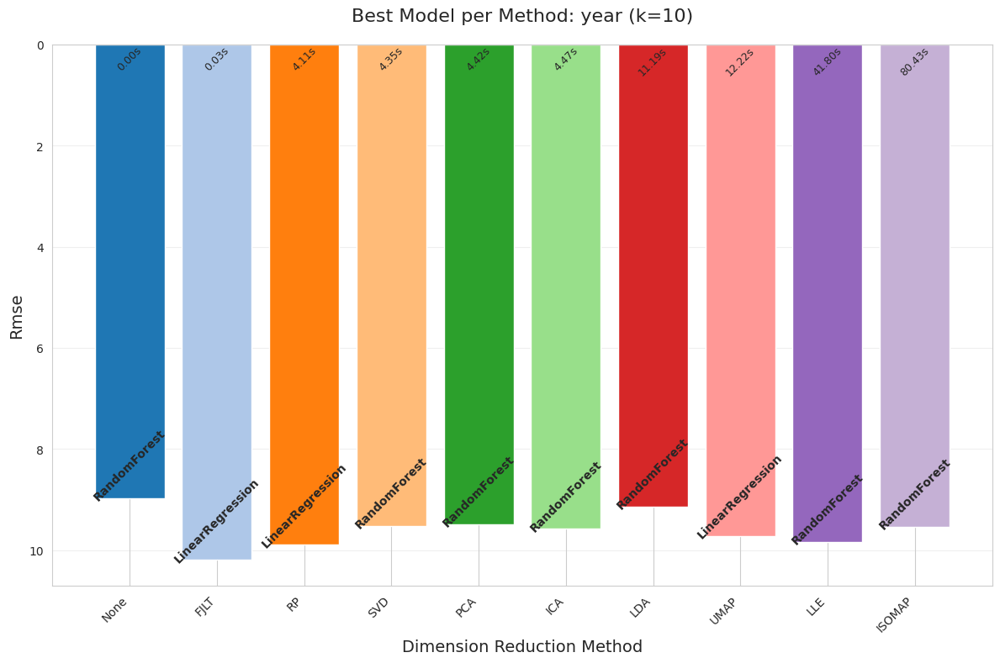

In [24]:
plot_time_performance_tradeoff(results)